In [1]:
import numpy as np
import pandas as pd
import matplotlib.image as img
import warnings
warnings.filterwarnings('ignore')

import os
import glob
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
random_seed = 80
learning_rate = 0.001
batch_size = 32
epochs = 100

cuda


# Data processing

- Load data from Cifar10 dataset
- merge train and testing data

In [3]:
from tqdm import tqdm
X = []       
labels = [] # this is not used in the training
for path in ['./data/cifar10/train/*', './data/cifar10/test/*']:
    for (i, dirname) in enumerate(glob.glob(path)):
        for filename in tqdm(glob.glob(os.path.join(dirname, '*'))):
            file = img.imread(filename)
            X.append(file)
            labels.append(i)

100%|██████████| 1000/1000 [00:00<00:00, 2470.90it/s]


In [4]:
X = np.array(X)

print(X.shape)
# plt.imshow(X[11451,:,:,:])

(60000, 32, 32, 3)


# VAE modeling

- Determine the batch size

In [5]:
from torch.utils.data import DataLoader
X = torch.tensor(X)
X = X.permute(0, 3,1,2)
image_loader = DataLoader(X, batch_size = batch_size, shuffle = True)
# We only care about reconstruction, so we don't need to compute accuracy

### Design VAE's infrastructure
- Required package: pip install torchsummary

In [6]:
pip install torchsummary

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
from torchsummary import summary
import torch.nn.functional as F

class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args
        
    def forward(self, x):
        return x.view(self.shape)
    
class Trim(nn.Module):
    def __init__(self):
        super(Trim, self).__init__()
    
    def forward(self, x):
        return x[:, :, :32, :32]
    
class VAE(nn.Module):
    def __init__(self, latent_dim = 100):
        
        # [(W−K+2P)/S]+1
        super(VAE, self).__init__()
        # Unfortunately, we cannot have maxunpool2d in nn.Sequential, so we have to write them out

        self.conv1 = nn.Conv2d(3, 32, 3, stride = 2, padding = 1)
        self.conv2 = nn.Conv2d(32, 64, 3, stride = 2, padding = 1)
        self.conv3 = nn.Conv2d(64, 128, 3, stride = 2, padding = 1)
        self.flatten = nn.Flatten()
        
        self.linear_mean = nn.Linear(2048, latent_dim)
        self.linear_logvar = nn.Linear(2048, latent_dim)

        self.linear = nn.Linear(latent_dim, 2048)
        self.reshape = Reshape(-1, 128, 4, 4)
        self.deconv1 = nn.ConvTranspose2d(128, 64, 3, stride = 2, padding=0)
        self.deconv2 = nn.ConvTranspose2d(64, 32, 3, stride = 2, padding=1)
        self.deconv3 = nn.ConvTranspose2d(32, 3, 3, stride = 2, padding=1)
        self.trim = Trim()
    
    def reparameterized(self, mean, var):
        eps = torch.randn(mean.size(0), mean.size(1)).to(device)
        z = mean + eps * torch.exp(var / 2.)
        return z

    def encode(self, x): # Using silu instead of relu here
        x = F.silu(self.conv1(x))
        x = F.silu(self.conv2(x))
        x = self.conv3(x)
        x = self.flatten(x)
        mean = self.linear_mean(x)
        var = self.linear_logvar(x)
        z = self.reparameterized(mean, var)
        return mean, var, z

    def decode(self, z):
        z = self.linear(z)
        z = self.reshape(z)
        z = F.silu(self.deconv1(z))
        z = F.silu(self.deconv2(z))
        z = F.silu(self.deconv3(z))
        z = self.trim(z)
        z = F.sigmoid(z)
        return z
    
    def forward(self, x):
        mean, var, z = self.encode(x)
        z = self.decode(z)
        return mean, var, z

model = VAE().to(device)
model2 = VAE().to(device)
# print(X.shape)

x = torch.randn(1, 3, 32, 32).to(device)
model(x)
summary(model, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 16, 16]             896
            Conv2d-2             [-1, 64, 8, 8]          18,496
            Conv2d-3            [-1, 128, 4, 4]          73,856
           Flatten-4                 [-1, 2048]               0
            Linear-5                  [-1, 100]         204,900
            Linear-6                  [-1, 100]         204,900
            Linear-7                 [-1, 2048]         206,848
           Reshape-8            [-1, 128, 4, 4]               0
   ConvTranspose2d-9             [-1, 64, 9, 9]          73,792
  ConvTranspose2d-10           [-1, 32, 17, 17]          18,464
  ConvTranspose2d-11            [-1, 3, 33, 33]             867
             Trim-12            [-1, 3, 32, 32]               0
Total params: 803,019
Trainable params: 803,019
Non-trainable params: 0
-------------------------------

### Training process

In [8]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
KL_weight = 0.000075 # The KL divergence is much larger than MAE loss, scaling it down
epochs = 100

train_losses_total, train_losses_total_avg = [], []
train_losses_reconstruction, train_losses_reconstruction_avg = [], []
train_losses_KL, train_losses_KL_avg = [], []
for epoch in range(epochs):
    train_loss_total = 0.0
    train_loss_reconstruction = 0.0
    train_loss_KL = 0.0
    for images in tqdm(image_loader):
        images = images.to(device)
        mean, var, outputs = model(images)

        optimizer.zero_grad()
        loss1 = criterion(outputs, images)
        loss2 = torch.mean(-0.5 * torch.sum(1 + var - mean**2 - torch.exp(var),axis=1),axis=0) # sum over latent dimension, not batch
        # -0.5 * torch.sum(1 + var - mean**2 - torch.exp(var), axis = 1).mean()
        # loss2 = torch.atan(loss2) / (np.pi / 2) # scaling it to [0,1]        
        loss = loss1  + KL_weight * loss2
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            train_losses_reconstruction.append(loss1.item())
            train_losses_KL.append(loss2.item())
            train_losses_total.append(loss.item())
            train_loss_reconstruction += loss1.item() * images.size(0)
            train_loss_KL += loss2.item() * images.size(0)
            train_loss_total += loss.item() * images.size(0)
    
    train_loss_total /= len(image_loader)
    train_loss_reconstruction /= len(image_loader)
    train_loss_KL /= len(image_loader)
    
    train_losses_total_avg.append(train_loss_total)
    train_losses_reconstruction_avg.append(train_loss_reconstruction)
    train_losses_KL_avg.append(train_loss_KL)
    
    print('-----------------------------------------------------')
    print(f'Epoch{epoch + 1}')
    print(f'Total loss = {train_loss_total:.3f}')
    print(f'Reconstruction loss = {train_loss_reconstruction:.3f}, KL = {train_loss_KL:.3f}')

    log = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict()
    }

    torch.save(log, f'model1_log_{epoch + 1}.pth')     

100%|██████████| 1875/1875 [00:06<00:00, 294.37it/s]


-----------------------------------------------------
Epoch1
Total loss = 1.117
Reconstruction loss = 1.027, KL = 1204.702


100%|██████████| 1875/1875 [00:05<00:00, 366.75it/s]


-----------------------------------------------------
Epoch2
Total loss = 1.024
Reconstruction loss = 0.922, KL = 1366.829


100%|██████████| 1875/1875 [00:05<00:00, 320.39it/s]


-----------------------------------------------------
Epoch3
Total loss = 1.012
Reconstruction loss = 0.905, KL = 1422.973


100%|██████████| 1875/1875 [00:05<00:00, 322.11it/s]


-----------------------------------------------------
Epoch4
Total loss = 1.007
Reconstruction loss = 0.898, KL = 1447.577


100%|██████████| 1875/1875 [00:05<00:00, 319.59it/s]


-----------------------------------------------------
Epoch5
Total loss = 1.003
Reconstruction loss = 0.894, KL = 1461.272


100%|██████████| 1875/1875 [00:05<00:00, 350.87it/s]


-----------------------------------------------------
Epoch6
Total loss = 1.001
Reconstruction loss = 0.891, KL = 1467.789


100%|██████████| 1875/1875 [00:05<00:00, 353.18it/s]


-----------------------------------------------------
Epoch7
Total loss = 0.999
Reconstruction loss = 0.888, KL = 1474.905


100%|██████████| 1875/1875 [00:05<00:00, 343.43it/s]


-----------------------------------------------------
Epoch8
Total loss = 0.998
Reconstruction loss = 0.887, KL = 1475.537


100%|██████████| 1875/1875 [00:05<00:00, 345.59it/s]


-----------------------------------------------------
Epoch9
Total loss = 0.997
Reconstruction loss = 0.886, KL = 1477.810


100%|██████████| 1875/1875 [00:05<00:00, 348.31it/s]


-----------------------------------------------------
Epoch10
Total loss = 0.996
Reconstruction loss = 0.885, KL = 1478.616


100%|██████████| 1875/1875 [00:05<00:00, 337.49it/s]


-----------------------------------------------------
Epoch11
Total loss = 0.995
Reconstruction loss = 0.884, KL = 1482.941


100%|██████████| 1875/1875 [00:05<00:00, 336.14it/s]


-----------------------------------------------------
Epoch12
Total loss = 0.994
Reconstruction loss = 0.883, KL = 1481.721


100%|██████████| 1875/1875 [00:05<00:00, 348.93it/s]


-----------------------------------------------------
Epoch13
Total loss = 0.993
Reconstruction loss = 0.882, KL = 1483.690


100%|██████████| 1875/1875 [00:05<00:00, 344.07it/s]


-----------------------------------------------------
Epoch14
Total loss = 0.993
Reconstruction loss = 0.882, KL = 1483.740


100%|██████████| 1875/1875 [00:05<00:00, 351.92it/s]


-----------------------------------------------------
Epoch15
Total loss = 0.992
Reconstruction loss = 0.881, KL = 1484.471


100%|██████████| 1875/1875 [00:05<00:00, 334.24it/s]


-----------------------------------------------------
Epoch16
Total loss = 0.992
Reconstruction loss = 0.880, KL = 1485.104


100%|██████████| 1875/1875 [00:05<00:00, 341.04it/s]


-----------------------------------------------------
Epoch17
Total loss = 0.991
Reconstruction loss = 0.880, KL = 1484.784


100%|██████████| 1875/1875 [00:05<00:00, 353.18it/s]


-----------------------------------------------------
Epoch18
Total loss = 0.991
Reconstruction loss = 0.879, KL = 1485.790


100%|██████████| 1875/1875 [00:05<00:00, 356.98it/s]


-----------------------------------------------------
Epoch19
Total loss = 0.991
Reconstruction loss = 0.879, KL = 1488.210


100%|██████████| 1875/1875 [00:05<00:00, 337.44it/s]


-----------------------------------------------------
Epoch20
Total loss = 0.990
Reconstruction loss = 0.879, KL = 1485.333


100%|██████████| 1875/1875 [00:05<00:00, 347.45it/s]


-----------------------------------------------------
Epoch21
Total loss = 0.990
Reconstruction loss = 0.878, KL = 1486.320


100%|██████████| 1875/1875 [00:05<00:00, 339.42it/s]


-----------------------------------------------------
Epoch22
Total loss = 0.990
Reconstruction loss = 0.878, KL = 1485.096


100%|██████████| 1875/1875 [00:05<00:00, 330.80it/s]


-----------------------------------------------------
Epoch23
Total loss = 0.989
Reconstruction loss = 0.878, KL = 1485.948


100%|██████████| 1875/1875 [00:05<00:00, 346.84it/s]


-----------------------------------------------------
Epoch24
Total loss = 0.989
Reconstruction loss = 0.878, KL = 1487.500


100%|██████████| 1875/1875 [00:05<00:00, 343.73it/s]


-----------------------------------------------------
Epoch25
Total loss = 0.989
Reconstruction loss = 0.878, KL = 1483.631


100%|██████████| 1875/1875 [00:05<00:00, 322.96it/s]


-----------------------------------------------------
Epoch26
Total loss = 0.989
Reconstruction loss = 0.877, KL = 1486.901


100%|██████████| 1875/1875 [00:05<00:00, 312.71it/s]


-----------------------------------------------------
Epoch27
Total loss = 0.989
Reconstruction loss = 0.877, KL = 1487.258


100%|██████████| 1875/1875 [00:05<00:00, 341.49it/s]


-----------------------------------------------------
Epoch28
Total loss = 0.988
Reconstruction loss = 0.877, KL = 1486.799


100%|██████████| 1875/1875 [00:05<00:00, 344.18it/s]


-----------------------------------------------------
Epoch29
Total loss = 0.988
Reconstruction loss = 0.877, KL = 1486.340


100%|██████████| 1875/1875 [00:05<00:00, 346.94it/s]


-----------------------------------------------------
Epoch30
Total loss = 0.988
Reconstruction loss = 0.877, KL = 1487.598


100%|██████████| 1875/1875 [00:05<00:00, 336.39it/s]


-----------------------------------------------------
Epoch31
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1485.809


100%|██████████| 1875/1875 [00:05<00:00, 339.12it/s]


-----------------------------------------------------
Epoch32
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1488.609


100%|██████████| 1875/1875 [00:05<00:00, 353.47it/s]


-----------------------------------------------------
Epoch33
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1487.761


100%|██████████| 1875/1875 [00:05<00:00, 333.55it/s]


-----------------------------------------------------
Epoch34
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1488.129


100%|██████████| 1875/1875 [00:05<00:00, 345.14it/s]


-----------------------------------------------------
Epoch35
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1488.703


100%|██████████| 1875/1875 [00:05<00:00, 346.85it/s]


-----------------------------------------------------
Epoch36
Total loss = 0.987
Reconstruction loss = 0.876, KL = 1487.732


100%|██████████| 1875/1875 [00:05<00:00, 338.85it/s]


-----------------------------------------------------
Epoch37
Total loss = 0.987
Reconstruction loss = 0.876, KL = 1487.633


100%|██████████| 1875/1875 [00:05<00:00, 347.39it/s]


-----------------------------------------------------
Epoch38
Total loss = 0.987
Reconstruction loss = 0.876, KL = 1488.057


100%|██████████| 1875/1875 [00:05<00:00, 344.03it/s]


-----------------------------------------------------
Epoch39
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1487.468


100%|██████████| 1875/1875 [00:05<00:00, 335.23it/s]


-----------------------------------------------------
Epoch40
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1487.114


100%|██████████| 1875/1875 [00:05<00:00, 338.74it/s]


-----------------------------------------------------
Epoch41
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.749


100%|██████████| 1875/1875 [00:05<00:00, 343.13it/s]


-----------------------------------------------------
Epoch42
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1490.061


100%|██████████| 1875/1875 [00:05<00:00, 336.50it/s]


-----------------------------------------------------
Epoch43
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1489.251


100%|██████████| 1875/1875 [00:05<00:00, 351.79it/s]


-----------------------------------------------------
Epoch44
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1490.217


100%|██████████| 1875/1875 [00:05<00:00, 332.34it/s]


-----------------------------------------------------
Epoch45
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1489.332


100%|██████████| 1875/1875 [00:05<00:00, 340.70it/s]


-----------------------------------------------------
Epoch46
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.405


100%|██████████| 1875/1875 [00:05<00:00, 356.98it/s]


-----------------------------------------------------
Epoch47
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.705


100%|██████████| 1875/1875 [00:05<00:00, 340.43it/s]


-----------------------------------------------------
Epoch48
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1487.931


100%|██████████| 1875/1875 [00:06<00:00, 295.40it/s]


-----------------------------------------------------
Epoch49
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.702


100%|██████████| 1875/1875 [00:05<00:00, 335.25it/s]


-----------------------------------------------------
Epoch50
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1489.486


100%|██████████| 1875/1875 [00:05<00:00, 353.85it/s]


-----------------------------------------------------
Epoch51
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1489.096


100%|██████████| 1875/1875 [00:05<00:00, 333.25it/s]


-----------------------------------------------------
Epoch52
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1489.172


100%|██████████| 1875/1875 [00:05<00:00, 348.63it/s]


-----------------------------------------------------
Epoch53
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1488.374


100%|██████████| 1875/1875 [00:05<00:00, 353.53it/s]


-----------------------------------------------------
Epoch54
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1488.373


100%|██████████| 1875/1875 [00:05<00:00, 354.58it/s]


-----------------------------------------------------
Epoch55
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1491.149


100%|██████████| 1875/1875 [00:05<00:00, 350.52it/s]


-----------------------------------------------------
Epoch56
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1491.782


100%|██████████| 1875/1875 [00:05<00:00, 345.48it/s]


-----------------------------------------------------
Epoch57
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.346


100%|██████████| 1875/1875 [00:05<00:00, 341.27it/s]


-----------------------------------------------------
Epoch58
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.875


100%|██████████| 1875/1875 [00:05<00:00, 343.10it/s]


-----------------------------------------------------
Epoch59
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.573


100%|██████████| 1875/1875 [00:05<00:00, 338.15it/s]


-----------------------------------------------------
Epoch60
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.123


100%|██████████| 1875/1875 [00:05<00:00, 340.84it/s]


-----------------------------------------------------
Epoch61
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.396


100%|██████████| 1875/1875 [00:05<00:00, 352.38it/s]


-----------------------------------------------------
Epoch62
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1491.360


100%|██████████| 1875/1875 [00:05<00:00, 343.34it/s]


-----------------------------------------------------
Epoch63
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1491.828


100%|██████████| 1875/1875 [00:05<00:00, 345.73it/s]


-----------------------------------------------------
Epoch64
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.642


100%|██████████| 1875/1875 [00:05<00:00, 348.41it/s]


-----------------------------------------------------
Epoch65
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.602


100%|██████████| 1875/1875 [00:05<00:00, 349.32it/s]


-----------------------------------------------------
Epoch66
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.926


100%|██████████| 1875/1875 [00:05<00:00, 358.40it/s]


-----------------------------------------------------
Epoch67
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1491.112


100%|██████████| 1875/1875 [00:05<00:00, 344.12it/s]


-----------------------------------------------------
Epoch68
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.877


100%|██████████| 1875/1875 [00:05<00:00, 333.48it/s]


-----------------------------------------------------
Epoch69
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.045


100%|██████████| 1875/1875 [00:05<00:00, 345.73it/s]


-----------------------------------------------------
Epoch70
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1490.011


100%|██████████| 1875/1875 [00:05<00:00, 326.62it/s]


-----------------------------------------------------
Epoch71
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1490.335


100%|██████████| 1875/1875 [00:05<00:00, 315.47it/s]


-----------------------------------------------------
Epoch72
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1489.925


100%|██████████| 1875/1875 [00:05<00:00, 326.25it/s]


-----------------------------------------------------
Epoch73
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1490.228


100%|██████████| 1875/1875 [00:05<00:00, 351.40it/s]


-----------------------------------------------------
Epoch74
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1489.684


100%|██████████| 1875/1875 [00:05<00:00, 342.61it/s]


-----------------------------------------------------
Epoch75
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1489.853


100%|██████████| 1875/1875 [00:05<00:00, 342.99it/s]


-----------------------------------------------------
Epoch76
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1490.563


100%|██████████| 1875/1875 [00:05<00:00, 342.82it/s]


-----------------------------------------------------
Epoch77
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.374


100%|██████████| 1875/1875 [00:05<00:00, 343.21it/s]


-----------------------------------------------------
Epoch78
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.891


100%|██████████| 1875/1875 [00:05<00:00, 355.76it/s]


-----------------------------------------------------
Epoch79
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.475


100%|██████████| 1875/1875 [00:05<00:00, 346.98it/s]


-----------------------------------------------------
Epoch80
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.001


100%|██████████| 1875/1875 [00:05<00:00, 326.48it/s]


-----------------------------------------------------
Epoch81
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.832


100%|██████████| 1875/1875 [00:05<00:00, 349.85it/s]


-----------------------------------------------------
Epoch82
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1487.912


100%|██████████| 1875/1875 [00:05<00:00, 348.14it/s]


-----------------------------------------------------
Epoch83
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.303


100%|██████████| 1875/1875 [00:05<00:00, 343.31it/s]


-----------------------------------------------------
Epoch84
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.377


100%|██████████| 1875/1875 [00:05<00:00, 339.23it/s]


-----------------------------------------------------
Epoch85
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.817


100%|██████████| 1875/1875 [00:05<00:00, 345.18it/s]


-----------------------------------------------------
Epoch86
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.119


100%|██████████| 1875/1875 [00:05<00:00, 336.73it/s]


-----------------------------------------------------
Epoch87
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.471


100%|██████████| 1875/1875 [00:05<00:00, 354.39it/s]


-----------------------------------------------------
Epoch88
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.785


100%|██████████| 1875/1875 [00:05<00:00, 341.00it/s]


-----------------------------------------------------
Epoch89
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.373


100%|██████████| 1875/1875 [00:05<00:00, 337.17it/s]


-----------------------------------------------------
Epoch90
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.957


100%|██████████| 1875/1875 [00:05<00:00, 346.01it/s]


-----------------------------------------------------
Epoch91
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1491.049


100%|██████████| 1875/1875 [00:05<00:00, 342.15it/s]


-----------------------------------------------------
Epoch92
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1491.820


100%|██████████| 1875/1875 [00:05<00:00, 335.12it/s]


-----------------------------------------------------
Epoch93
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1491.530


100%|██████████| 1875/1875 [00:05<00:00, 316.87it/s]


-----------------------------------------------------
Epoch94
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.762


100%|██████████| 1875/1875 [00:06<00:00, 306.78it/s]


-----------------------------------------------------
Epoch95
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.938


100%|██████████| 1875/1875 [00:05<00:00, 338.37it/s]


-----------------------------------------------------
Epoch96
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1492.924


100%|██████████| 1875/1875 [00:05<00:00, 356.68it/s]


-----------------------------------------------------
Epoch97
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1491.531


100%|██████████| 1875/1875 [00:05<00:00, 341.16it/s]


-----------------------------------------------------
Epoch98
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1492.091


100%|██████████| 1875/1875 [00:05<00:00, 353.56it/s]


-----------------------------------------------------
Epoch99
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.812


100%|██████████| 1875/1875 [00:05<00:00, 338.46it/s]

-----------------------------------------------------
Epoch100
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1491.422


### Learning curve

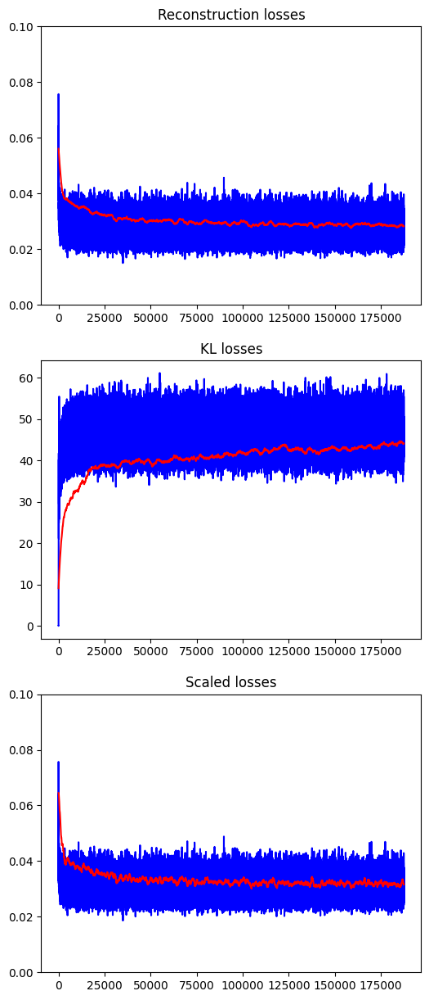

In [9]:
fig, axs = plt.subplots(3, 1, figsize = (6, 15))

train_losses_reconstruction_avg = [np.mean(train_losses_reconstruction[i:i+50]) for i in range(3750)] #CHANGE dEPENDING EPOCH, 100 --> 3750
axs[0].plot(np.arange(epochs * 1875), train_losses_reconstruction, color = 'b', label = 'mini-batches')
axs[0].plot(np.arange(0, epochs * 1875, 50), train_losses_reconstruction_avg, color = 'r', label = 'running average')
axs[0].set_ylim(0,0.1)
axs[0].set_title('Reconstruction losses')

train_losses_KL_avg = [np.mean(train_losses_KL[i:i+50]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[1].plot(np.arange(epochs * 1875), train_losses_KL, color = 'b', label = 'mini-batches')
axs[1].plot(np.arange(0, epochs * 1875, 50), train_losses_KL_avg, color = 'r', label = 'running average')
axs[1].set_title('KL losses')

train_losses_total_avg = [np.mean(train_losses_total[i:i+20]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[2].plot(np.arange(epochs * 1875), train_losses_total, color = 'b', label = 'mini-batches')
axs[2].plot(np.arange(0, epochs * 1875, 50), train_losses_total_avg, color = 'r', label = 'running average')
axs[2].set_ylim(0,0.1)
axs[2].set_title('Scaled losses')

plt.show()

# Comparison between VAE and AE

### Traning the Autoencoder (without KL in the loss)

In [10]:
model2 = VAE().to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model2.parameters(), lr = learning_rate)

train_losses_total, train_losses_total_avg = [], []
train_losses_reconstruction, train_losses_reconstruction_avg = [], []
train_losses_KL, train_losses_KL_avg = [], []
for epoch in range(epochs):
    train_loss_total = 0.0
    train_loss_reconstruction = 0.0
    train_loss_KL = 0.0
    for images in tqdm(image_loader):
        images = images.to(device)
        mean, var, outputs = model2(images)

        optimizer.zero_grad()
        loss1 = criterion(outputs, images)
        loss2 = torch.mean(-0.5 * torch.sum(1 + var - mean**2 - torch.exp(var),axis=1),axis=0) # sum over latent dimension, not batch     
        loss = loss1
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            train_losses_reconstruction.append(loss1.item())
            train_losses_KL.append(loss2.item())
            train_losses_total.append(loss.item())
            train_loss_reconstruction += loss1.item() * images.size(0)
            train_loss_KL += loss2.item() * images.size(0)
            train_loss_total += loss.item() * images.size(0)
    
    train_loss_total /= len(image_loader)
    train_loss_reconstruction /= len(image_loader)
    train_loss_KL /= len(image_loader)
    
    train_losses_total_avg.append(train_loss_total)
    train_losses_reconstruction_avg.append(train_loss_reconstruction)
    train_losses_KL_avg.append(train_loss_KL)
    
    print('-----------------------------------------------------')
    print(f'Epoch{epoch + 1}')
    print(f'Total loss = {train_loss_total:.3f}')
    print(f'Reconstruction loss = {train_loss_reconstruction:.3f}, KL = {train_loss_KL}')

    log = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict()
    }

    torch.save(log, f'model2_log_{epoch + 1}.pth')       

100%|██████████| 1875/1875 [00:05<00:00, 359.94it/s]


-----------------------------------------------------
Epoch1
Total loss = 0.912
Reconstruction loss = 0.912, KL = 14695.742017949422


100%|██████████| 1875/1875 [00:05<00:00, 370.33it/s]


-----------------------------------------------------
Epoch2
Total loss = 0.793
Reconstruction loss = 0.793, KL = 16568.013198958335


100%|██████████| 1875/1875 [00:05<00:00, 353.71it/s]


-----------------------------------------------------
Epoch3
Total loss = 0.784
Reconstruction loss = 0.784, KL = 16577.236327604165


100%|██████████| 1875/1875 [00:05<00:00, 349.95it/s]


-----------------------------------------------------
Epoch4
Total loss = 0.780
Reconstruction loss = 0.780, KL = 16622.466966666667


100%|██████████| 1875/1875 [00:05<00:00, 341.61it/s]


-----------------------------------------------------
Epoch5
Total loss = 0.778
Reconstruction loss = 0.778, KL = 16849.424015625


100%|██████████| 1875/1875 [00:05<00:00, 352.36it/s]


-----------------------------------------------------
Epoch6
Total loss = 0.777
Reconstruction loss = 0.777, KL = 17010.342222395833


100%|██████████| 1875/1875 [00:05<00:00, 322.62it/s]


-----------------------------------------------------
Epoch7
Total loss = 0.775
Reconstruction loss = 0.775, KL = 17180.816736979166


100%|██████████| 1875/1875 [00:05<00:00, 356.76it/s]


-----------------------------------------------------
Epoch8
Total loss = 0.774
Reconstruction loss = 0.774, KL = 17413.795586979166


100%|██████████| 1875/1875 [00:05<00:00, 327.93it/s]


-----------------------------------------------------
Epoch9
Total loss = 0.773
Reconstruction loss = 0.773, KL = 17556.880069270832


100%|██████████| 1875/1875 [00:05<00:00, 324.67it/s]


-----------------------------------------------------
Epoch10
Total loss = 0.772
Reconstruction loss = 0.772, KL = 17684.413253645835


100%|██████████| 1875/1875 [00:05<00:00, 360.14it/s]


-----------------------------------------------------
Epoch11
Total loss = 0.772
Reconstruction loss = 0.772, KL = 17985.569417708335


100%|██████████| 1875/1875 [00:05<00:00, 354.47it/s]


-----------------------------------------------------
Epoch12
Total loss = 0.771
Reconstruction loss = 0.771, KL = 17945.678907291665


100%|██████████| 1875/1875 [00:05<00:00, 340.30it/s]


-----------------------------------------------------
Epoch13
Total loss = 0.771
Reconstruction loss = 0.771, KL = 18099.748023958335


100%|██████████| 1875/1875 [00:05<00:00, 337.61it/s]


-----------------------------------------------------
Epoch14
Total loss = 0.770
Reconstruction loss = 0.770, KL = 18261.255729166667


100%|██████████| 1875/1875 [00:05<00:00, 334.99it/s]


-----------------------------------------------------
Epoch15
Total loss = 0.770
Reconstruction loss = 0.770, KL = 18359.274742708334


100%|██████████| 1875/1875 [00:05<00:00, 335.92it/s]


-----------------------------------------------------
Epoch16
Total loss = 0.769
Reconstruction loss = 0.769, KL = 18452.956727083332


100%|██████████| 1875/1875 [00:05<00:00, 347.64it/s]


-----------------------------------------------------
Epoch17
Total loss = 0.769
Reconstruction loss = 0.769, KL = 18539.219705208332


100%|██████████| 1875/1875 [00:05<00:00, 347.60it/s]


-----------------------------------------------------
Epoch18
Total loss = 0.769
Reconstruction loss = 0.769, KL = 18639.337177083333


100%|██████████| 1875/1875 [00:05<00:00, 333.29it/s]


-----------------------------------------------------
Epoch19
Total loss = 0.769
Reconstruction loss = 0.769, KL = 18720.579954166667


100%|██████████| 1875/1875 [00:05<00:00, 348.65it/s]


-----------------------------------------------------
Epoch20
Total loss = 0.768
Reconstruction loss = 0.768, KL = 18740.747885416666


100%|██████████| 1875/1875 [00:05<00:00, 355.72it/s]


-----------------------------------------------------
Epoch21
Total loss = 0.768
Reconstruction loss = 0.768, KL = 18867.6397625


100%|██████████| 1875/1875 [00:05<00:00, 350.38it/s]


-----------------------------------------------------
Epoch22
Total loss = 0.768
Reconstruction loss = 0.768, KL = 18948.921436458335


100%|██████████| 1875/1875 [00:05<00:00, 353.16it/s]


-----------------------------------------------------
Epoch23
Total loss = 0.768
Reconstruction loss = 0.768, KL = 19039.199055208333


100%|██████████| 1875/1875 [00:05<00:00, 365.47it/s]


-----------------------------------------------------
Epoch24
Total loss = 0.768
Reconstruction loss = 0.768, KL = 19056.946229166668


100%|██████████| 1875/1875 [00:05<00:00, 323.83it/s]


-----------------------------------------------------
Epoch25
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19131.655616666667


100%|██████████| 1875/1875 [00:05<00:00, 357.19it/s]


-----------------------------------------------------
Epoch26
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19182.916321875


100%|██████████| 1875/1875 [00:05<00:00, 341.77it/s]


-----------------------------------------------------
Epoch27
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19302.925870833333


100%|██████████| 1875/1875 [00:05<00:00, 345.77it/s]


-----------------------------------------------------
Epoch28
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19356.010490625


100%|██████████| 1875/1875 [00:05<00:00, 347.48it/s]


-----------------------------------------------------
Epoch29
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19459.9152125


100%|██████████| 1875/1875 [00:05<00:00, 347.00it/s]


-----------------------------------------------------
Epoch30
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19584.678955208332


100%|██████████| 1875/1875 [00:05<00:00, 327.06it/s]


-----------------------------------------------------
Epoch31
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19641.967


100%|██████████| 1875/1875 [00:05<00:00, 351.68it/s]


-----------------------------------------------------
Epoch32
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19704.718423958333


100%|██████████| 1875/1875 [00:05<00:00, 336.14it/s]


-----------------------------------------------------
Epoch33
Total loss = 0.766
Reconstruction loss = 0.766, KL = 19787.616461458332


100%|██████████| 1875/1875 [00:05<00:00, 337.44it/s]


-----------------------------------------------------
Epoch34
Total loss = 0.766
Reconstruction loss = 0.766, KL = 19835.903022916667


100%|██████████| 1875/1875 [00:05<00:00, 347.95it/s]


-----------------------------------------------------
Epoch35
Total loss = 0.766
Reconstruction loss = 0.766, KL = 19900.754977083332


100%|██████████| 1875/1875 [00:05<00:00, 341.39it/s]


-----------------------------------------------------
Epoch36
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20045.90589270833


100%|██████████| 1875/1875 [00:05<00:00, 354.30it/s]


-----------------------------------------------------
Epoch37
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20174.359839583332


100%|██████████| 1875/1875 [00:05<00:00, 354.44it/s]


-----------------------------------------------------
Epoch38
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20227.429060416667


100%|██████████| 1875/1875 [00:05<00:00, 333.24it/s]


-----------------------------------------------------
Epoch39
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20262.245561458334


100%|██████████| 1875/1875 [00:05<00:00, 344.90it/s]


-----------------------------------------------------
Epoch40
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20395.348797916668


100%|██████████| 1875/1875 [00:05<00:00, 368.06it/s]


-----------------------------------------------------
Epoch41
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20474.19936875


100%|██████████| 1875/1875 [00:05<00:00, 339.75it/s]


-----------------------------------------------------
Epoch42
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20575.211258333333


100%|██████████| 1875/1875 [00:05<00:00, 348.91it/s]


-----------------------------------------------------
Epoch43
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20693.045690625


100%|██████████| 1875/1875 [00:05<00:00, 338.80it/s]


-----------------------------------------------------
Epoch44
Total loss = 0.765
Reconstruction loss = 0.765, KL = 20801.052746875


100%|██████████| 1875/1875 [00:05<00:00, 336.81it/s]


-----------------------------------------------------
Epoch45
Total loss = 0.765
Reconstruction loss = 0.765, KL = 20845.405138541668


100%|██████████| 1875/1875 [00:05<00:00, 345.56it/s]


-----------------------------------------------------
Epoch46
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21009.541613541667


100%|██████████| 1875/1875 [00:05<00:00, 348.99it/s]


-----------------------------------------------------
Epoch47
Total loss = 0.765
Reconstruction loss = 0.765, KL = 20982.718329166666


100%|██████████| 1875/1875 [00:05<00:00, 360.34it/s]


-----------------------------------------------------
Epoch48
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21185.797904166666


100%|██████████| 1875/1875 [00:05<00:00, 372.02it/s]


-----------------------------------------------------
Epoch49
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21172.254219791666


100%|██████████| 1875/1875 [00:05<00:00, 373.28it/s]


-----------------------------------------------------
Epoch50
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21330.69572395833


100%|██████████| 1875/1875 [00:05<00:00, 342.89it/s]


-----------------------------------------------------
Epoch51
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21456.443315625


100%|██████████| 1875/1875 [00:04<00:00, 379.87it/s]


-----------------------------------------------------
Epoch52
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21607.304353125


100%|██████████| 1875/1875 [00:05<00:00, 355.63it/s]


-----------------------------------------------------
Epoch53
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21738.55185


100%|██████████| 1875/1875 [00:05<00:00, 372.12it/s]


-----------------------------------------------------
Epoch54
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21711.802211458333


100%|██████████| 1875/1875 [00:05<00:00, 351.35it/s]


-----------------------------------------------------
Epoch55
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21835.263009375


100%|██████████| 1875/1875 [00:05<00:00, 363.12it/s]


-----------------------------------------------------
Epoch56
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21952.70249375


100%|██████████| 1875/1875 [00:05<00:00, 363.64it/s]


-----------------------------------------------------
Epoch57
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22126.689778125


100%|██████████| 1875/1875 [00:05<00:00, 360.53it/s]


-----------------------------------------------------
Epoch58
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22230.601580208335


100%|██████████| 1875/1875 [00:05<00:00, 353.22it/s]


-----------------------------------------------------
Epoch59
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22271.195552083333


100%|██████████| 1875/1875 [00:05<00:00, 364.35it/s]


-----------------------------------------------------
Epoch60
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22287.737152083333


100%|██████████| 1875/1875 [00:05<00:00, 358.81it/s]


-----------------------------------------------------
Epoch61
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22486.591130208333


100%|██████████| 1875/1875 [00:05<00:00, 369.93it/s]


-----------------------------------------------------
Epoch62
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22556.8181125


100%|██████████| 1875/1875 [00:05<00:00, 368.69it/s]


-----------------------------------------------------
Epoch63
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22733.463203125


100%|██████████| 1875/1875 [00:05<00:00, 349.87it/s]


-----------------------------------------------------
Epoch64
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22714.647582291665


100%|██████████| 1875/1875 [00:05<00:00, 360.16it/s]


-----------------------------------------------------
Epoch65
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22841.14260833333


100%|██████████| 1875/1875 [00:05<00:00, 370.26it/s]


-----------------------------------------------------
Epoch66
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22909.82851666667


100%|██████████| 1875/1875 [00:05<00:00, 347.18it/s]


-----------------------------------------------------
Epoch67
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23058.081182291666


100%|██████████| 1875/1875 [00:05<00:00, 368.56it/s]


-----------------------------------------------------
Epoch68
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23155.741152083334


100%|██████████| 1875/1875 [00:05<00:00, 333.74it/s]


-----------------------------------------------------
Epoch69
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23296.20498125


100%|██████████| 1875/1875 [00:05<00:00, 331.87it/s]


-----------------------------------------------------
Epoch70
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23368.6025625


100%|██████████| 1875/1875 [00:05<00:00, 355.87it/s]


-----------------------------------------------------
Epoch71
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23518.66120104167


100%|██████████| 1875/1875 [00:05<00:00, 364.28it/s]


-----------------------------------------------------
Epoch72
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23595.1712375


100%|██████████| 1875/1875 [00:05<00:00, 320.46it/s]


-----------------------------------------------------
Epoch73
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23607.029588541667


100%|██████████| 1875/1875 [00:05<00:00, 367.40it/s]


-----------------------------------------------------
Epoch74
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23647.199141666668


100%|██████████| 1875/1875 [00:05<00:00, 363.77it/s]


-----------------------------------------------------
Epoch75
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23920.076584375


100%|██████████| 1875/1875 [00:05<00:00, 349.39it/s]


-----------------------------------------------------
Epoch76
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23958.369415625


100%|██████████| 1875/1875 [00:05<00:00, 366.99it/s]


-----------------------------------------------------
Epoch77
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23852.919475


100%|██████████| 1875/1875 [00:04<00:00, 376.48it/s]


-----------------------------------------------------
Epoch78
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24178.984936458335


100%|██████████| 1875/1875 [00:05<00:00, 357.68it/s]


-----------------------------------------------------
Epoch79
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24078.442688541665


100%|██████████| 1875/1875 [00:05<00:00, 354.68it/s]


-----------------------------------------------------
Epoch80
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24110.697951041668


100%|██████████| 1875/1875 [00:05<00:00, 355.84it/s]


-----------------------------------------------------
Epoch81
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24379.697991666668


100%|██████████| 1875/1875 [00:05<00:00, 347.64it/s]


-----------------------------------------------------
Epoch82
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24489.506354166668


100%|██████████| 1875/1875 [00:04<00:00, 377.58it/s]


-----------------------------------------------------
Epoch83
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24398.225259375


100%|██████████| 1875/1875 [00:05<00:00, 364.89it/s]


-----------------------------------------------------
Epoch84
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24625.263198958335


100%|██████████| 1875/1875 [00:05<00:00, 358.59it/s]


-----------------------------------------------------
Epoch85
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24589.441408333332


100%|██████████| 1875/1875 [00:05<00:00, 364.35it/s]


-----------------------------------------------------
Epoch86
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24787.230309375


100%|██████████| 1875/1875 [00:04<00:00, 379.48it/s]


-----------------------------------------------------
Epoch87
Total loss = 0.763
Reconstruction loss = 0.763, KL = 24796.57121875


100%|██████████| 1875/1875 [00:05<00:00, 355.19it/s]


-----------------------------------------------------
Epoch88
Total loss = 0.763
Reconstruction loss = 0.763, KL = 24947.450146875


100%|██████████| 1875/1875 [00:05<00:00, 363.87it/s]


-----------------------------------------------------
Epoch89
Total loss = 0.763
Reconstruction loss = 0.763, KL = 24963.85011666667


100%|██████████| 1875/1875 [00:05<00:00, 356.93it/s]


-----------------------------------------------------
Epoch90
Total loss = 0.763
Reconstruction loss = 0.763, KL = 24949.844269791665


100%|██████████| 1875/1875 [00:05<00:00, 345.01it/s]


-----------------------------------------------------
Epoch91
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25004.481032291667


100%|██████████| 1875/1875 [00:05<00:00, 369.85it/s]


-----------------------------------------------------
Epoch92
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25063.712646875


100%|██████████| 1875/1875 [00:06<00:00, 311.26it/s]


-----------------------------------------------------
Epoch93
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25044.684569791665


100%|██████████| 1875/1875 [00:05<00:00, 323.48it/s]


-----------------------------------------------------
Epoch94
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25110.136577083333


100%|██████████| 1875/1875 [00:04<00:00, 378.30it/s]


-----------------------------------------------------
Epoch95
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25416.767088541666


100%|██████████| 1875/1875 [00:04<00:00, 381.13it/s]


-----------------------------------------------------
Epoch96
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25410.61794375


100%|██████████| 1875/1875 [00:05<00:00, 356.39it/s]


-----------------------------------------------------
Epoch97
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25441.683397916666


100%|██████████| 1875/1875 [00:05<00:00, 370.26it/s]


-----------------------------------------------------
Epoch98
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25617.734642708332


100%|██████████| 1875/1875 [00:04<00:00, 378.49it/s]


-----------------------------------------------------
Epoch99
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25338.558590625


100%|██████████| 1875/1875 [00:05<00:00, 368.94it/s]

-----------------------------------------------------
Epoch100
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25536.275153125


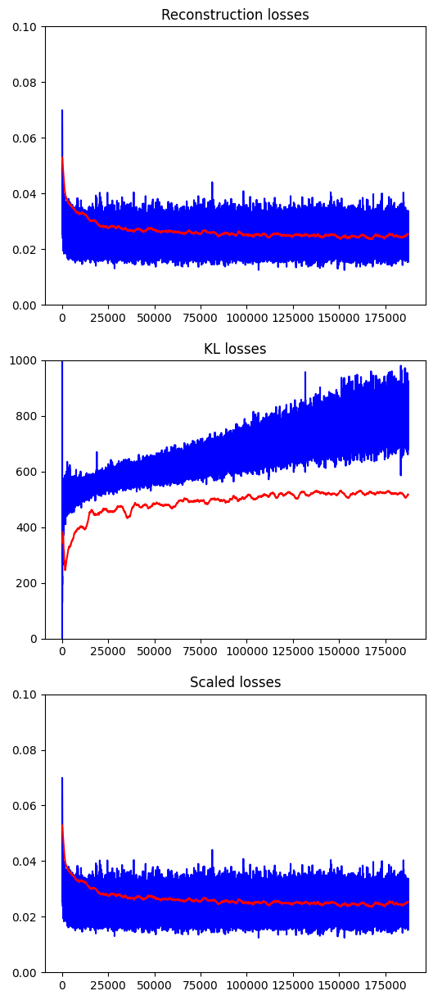

In [11]:
fig, axs = plt.subplots(3, 1, figsize = (6, 15))

train_losses_reconstruction_avg = [np.mean(train_losses_reconstruction[i:i+50]) for i in range(3750)]
axs[0].plot(np.arange(epochs * 1875), train_losses_reconstruction, color = 'b', label = 'mini-batches')
axs[0].plot(np.arange(0, epochs * 1875, 50), train_losses_reconstruction_avg, color = 'r', label = 'running average')
axs[0].set_ylim(0,0.1)
axs[0].set_title('Reconstruction losses')

train_losses_KL_avg = [np.mean(train_losses_KL[i:i+50]) for i in range(3750)]
axs[1].plot(np.arange(epochs * 1875), train_losses_KL, color = 'b', label = 'mini-batches')
axs[1].plot(np.arange(0, epochs * 1875, 50), train_losses_KL_avg, color = 'r', label = 'running average')
axs[1].set_ylim(0,1000)
axs[1].set_title('KL losses')

train_losses_total_avg = [np.mean(train_losses_total[i:i+50]) for i in range(3750)]
axs[2].plot(np.arange(epochs * 1875), train_losses_total, color = 'b', label = 'mini-batches')
axs[2].plot(np.arange(0, epochs * 1875, 50), train_losses_total_avg, color = 'r', label = 'running average')
axs[2].set_ylim(0,0.1)
axs[2].set_title('Scaled losses')

plt.show()

### Generated image by VAE

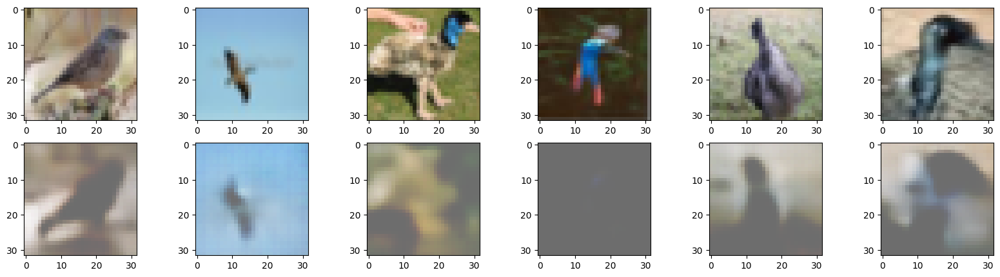

In [12]:
fig, axs = plt.subplots(2, 6, figsize = (20, 5))
for i in range(6):
    axs[0][i].imshow(X[i+10000,:,:,:].permute(1,2,0))
_, _, new_fig = model(X[10000:10006, :, :, :].to(device))
for i in range(6):
    axs[1][i].imshow(new_fig[i].permute(1,2,0).cpu().detach().numpy())

### Output of AE

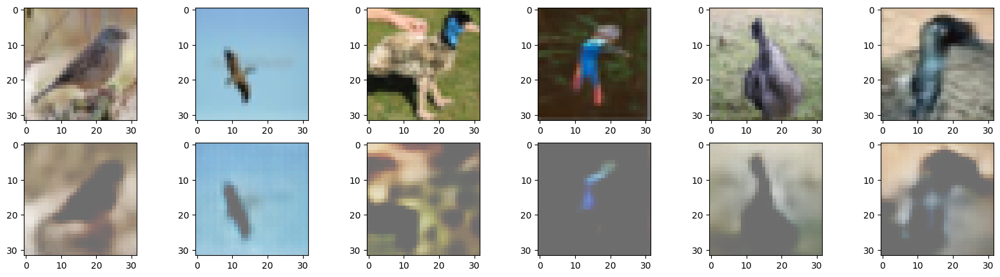

In [13]:
fig, axs = plt.subplots(2, 6, figsize = (20, 5))
for i in range(6):
    axs[0][i].imshow(X[i+10000,:,:,:].permute(1,2,0))
_, _, new_fig = model2(X[10000:10006, :, :, :].to(device))
for i in range(6):
    axs[1][i].imshow(new_fig[i].permute(1,2,0).cpu().detach().numpy())

### Latent Space

Text(0.5, 1.0, 'comparison between the latent spaces')

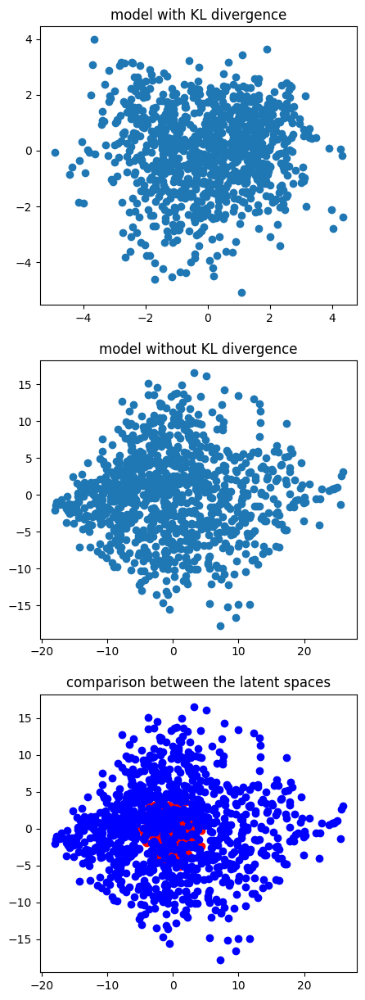

In [14]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)

_,_,latent_model1 = model.encode(X[:1000].to(device))
_,_,latent_model2 = model2.encode(X[:1000].to(device))
latent_model1 = latent_model1.cpu().detach().numpy()
latent_model2 = latent_model2.cpu().detach().numpy()

fig, axs = plt.subplots(3, figsize = (5, 15))
plot_X_1 = pca.fit_transform(latent_model1)
axs[0].scatter(plot_X_1[:,0], plot_X_1[:,1])
axs[0].set_title('model with KL divergence')
plot_X_2 = pca.fit_transform(latent_model2)
axs[1].scatter(plot_X_2[:, 0], plot_X_2[:, 1])
axs[1].set_title('model without KL divergence')

axs[2].scatter(plot_X_1[:,0], plot_X_1[:, 1], color = 'r')
axs[2].scatter(plot_X_2[:,0], plot_X_2[:, 1], color = 'b')
axs[2].set_title('comparison between the latent spaces')

PCA / TSNE PLOT

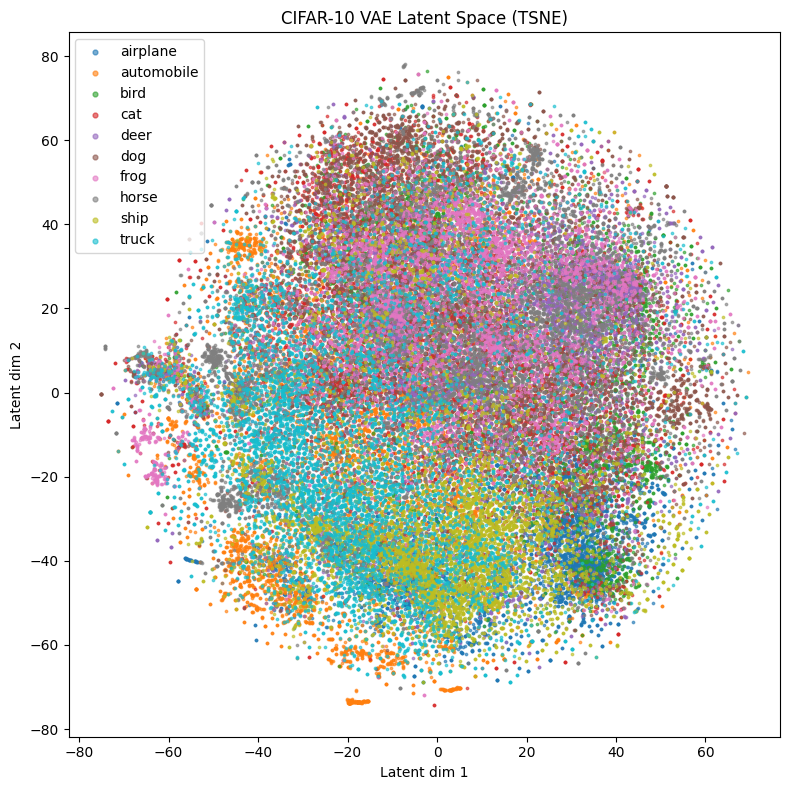

In [15]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
from torchvision import datasets, transforms

# # 1. Load CIFAR-10 test data (or any split you want)
# transform = transforms.Compose([
#     transforms.ToTensor(),
# ])
# testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
# testloader = torch.utils.data.DataLoader(testset, batch_size=256, shuffle=False)

# 2. Put VAE in eval mode
vae = model  # your trained VAE
vae.eval()

latents = []
batch_size = 256
device = next(vae.parameters()).device
labels = np.array(labels)
with torch.no_grad():
    for i in range(0, len(X), batch_size):
        batch = X[i:i+batch_size].to(device)
        mean, logvar, z = vae.encode(batch)
        latents.append(mean.cpu().numpy())
latents = np.concatenate(latents, axis=0)

# Step 3: t-SNE or PCA

reducer = TSNE(n_components=2, random_state=42,perplexity=30)
# reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (TSNE)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

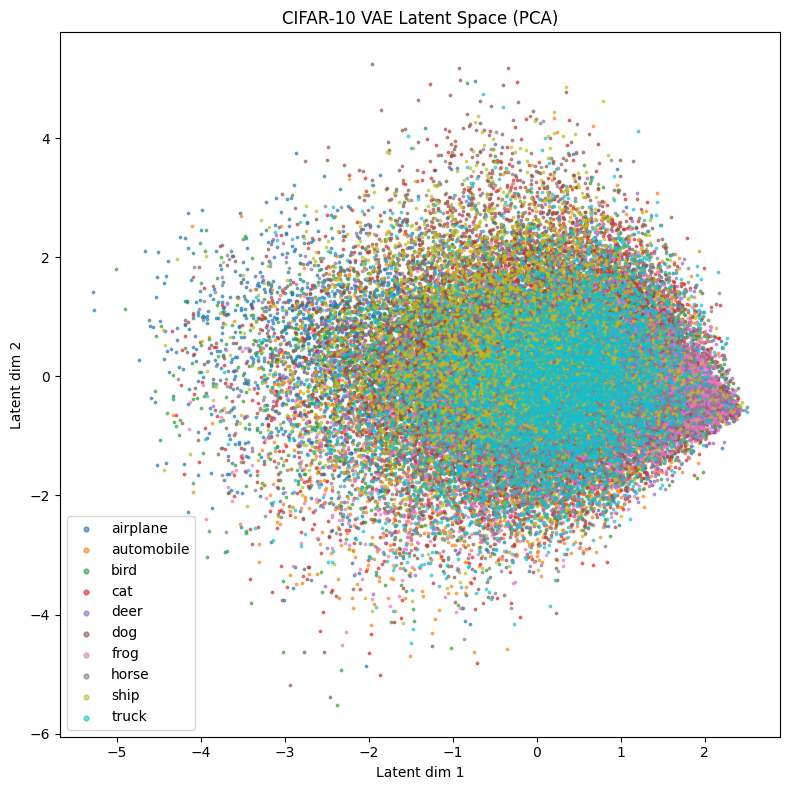

In [16]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
from torchvision import datasets, transforms

# # 1. Load CIFAR-10 test data (or any split you want)
# transform = transforms.Compose([
#     transforms.ToTensor(),
# ])
# testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
# testloader = torch.utils.data.DataLoader(testset, batch_size=256, shuffle=False)

# 2. Put VAE in eval mode
vae = model  # your trained VAE
vae.eval()

latents = []
batch_size = 256
device = next(vae.parameters()).device
labels = np.array(labels)
with torch.no_grad():
    for i in range(0, len(X), batch_size):
        batch = X[i:i+batch_size].to(device)
        mean, logvar, z = vae.encode(batch)
        latents.append(mean.cpu().numpy())
latents = np.concatenate(latents, axis=0)

# Step 3: t-SNE or PCA

# reducer = TSNE(n_components=2, random_state=42,perplexity=30)
reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (PCA)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

### Generating 60 images using VAE

torch.Size([60, 3, 32, 32])


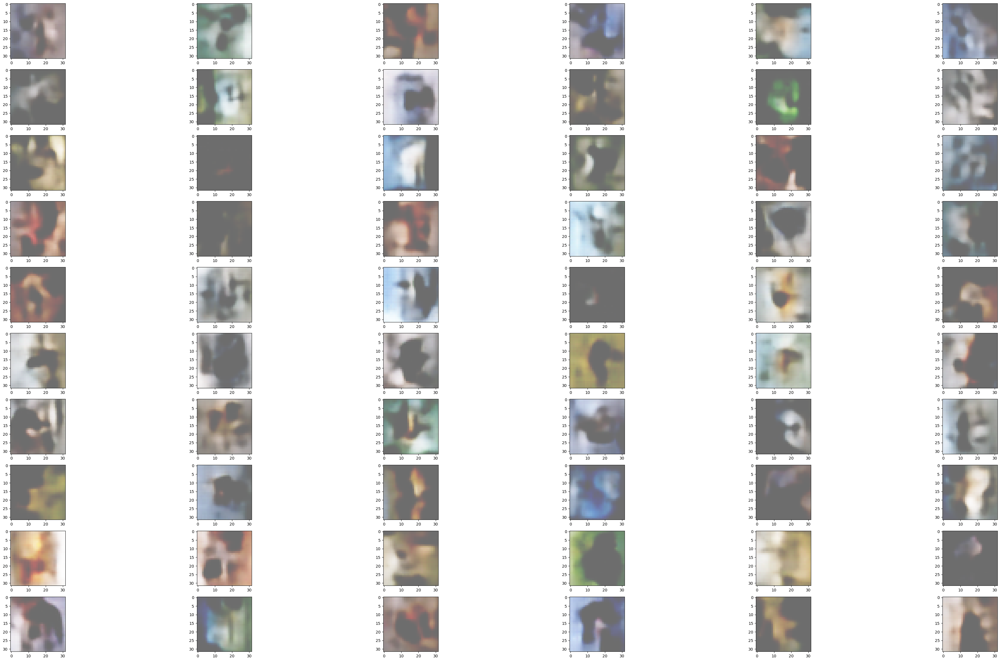

In [18]:
fig, axs = plt.subplots(10,6, figsize = (50, 30))

names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
sixty_images_latent = torch.randn(60, 100).to(device)
sixty_images = model.decode(sixty_images_latent)
print(sixty_images.shape)
sixty_images = sixty_images.permute(0, 3, 2, 1).cpu().detach().numpy()

for i in range(10):
    for j in range(6):
        idx = (6) * (i-1) + (j)
        axs[i][j].imshow(sixty_images[idx])

### Generating 60 images using AE

torch.Size([60, 3, 32, 32])


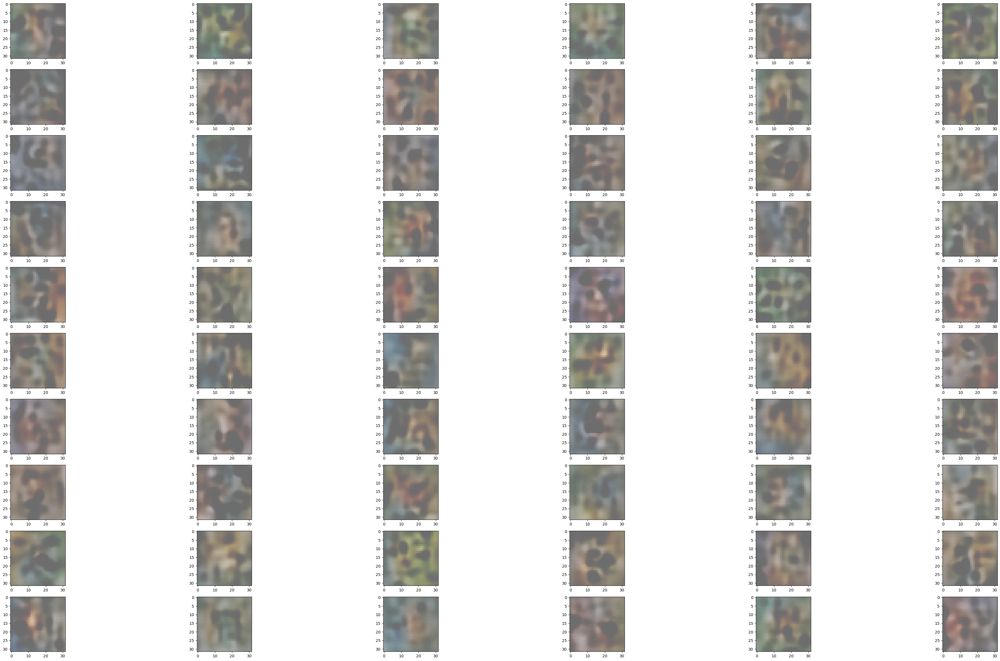

In [19]:
fig, axs = plt.subplots(10,6, figsize = (50, 30))

names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
sixty_images_latent = torch.randn(60, 100).to(device)
sixty_images = model2.decode(sixty_images_latent)
print(sixty_images.shape)
sixty_images = sixty_images.permute(0, 3, 2, 1).cpu().detach().numpy()

for i in range(10):
    for j in range(6):
        idx = (6) * (i-1) + (j)
        axs[i][j].imshow(sixty_images[idx])

# Experiments

1. Train Convolutional Model with 1 more layer 

In [20]:
class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args
        
    def forward(self, x):
        return x.view(self.shape)
    
class Trim(nn.Module):
    def __init__(self):
        super(Trim, self).__init__()
    
    def forward(self, x):
        return x[:, :, :32, :32]
    
class VAE(nn.Module):
    def __init__(self, latent_dim = 100):
        
        # [(W−K+2P)/S]+1
        super(VAE, self).__init__()
        # Unfortunately, we cannot have maxunpool2d in nn.Sequential, so we have to write them out

        self.conv1 = nn.Conv2d(3, 32, 3, stride = 2, padding = 1)
        self.conv2 = nn.Conv2d(32, 64, 3, stride = 2, padding = 1)
        self.conv3 = nn.Conv2d(64, 128, 3, stride = 2, padding = 1)
        self.conv4 = nn.Conv2d(128, 256, 3,stride = 2, padding = 1) # Add fourth convolutional layer
        self.flatten = nn.Flatten()
        
        self.linear_mean = nn.Linear(1024, latent_dim)
        self.linear_logvar = nn.Linear(1024, latent_dim)

        self.linear = nn.Linear(latent_dim, 1024)
        self.reshape = Reshape(-1, 256, 2, 2)
        self.deconv1 = nn.ConvTranspose2d(256, 128, 3, stride = 2, padding=0)
        self.deconv2 = nn.ConvTranspose2d(128, 64, 3, stride = 2, padding=1)
        self.deconv3 = nn.ConvTranspose2d(64, 32, 3, stride = 2, padding=1)
        self.deconv4 = nn.ConvTranspose2d(32, 3, 3, stride = 2, padding=1)
        self.trim = Trim()
    
    def reparameterized(self, mean, var):
        eps = torch.randn(mean.size(0), mean.size(1)).to(device)
        z = mean + eps * torch.exp(var / 2.)
        return z

    def encode(self, x): # Using silu instead of relu here
        x = F.silu(self.conv1(x))
        x = F.silu(self.conv2(x))
        x = F.silu(self.conv3(x))
        x = self.conv4(x)
        x = self.flatten(x)
        mean = self.linear_mean(x)
        var = self.linear_logvar(x)
        z = self.reparameterized(mean, var)
        return mean, var, z

    def decode(self, z):
        z = self.linear(z)
        z = self.reshape(z)
        z = F.silu(self.deconv1(z))
        z = F.silu(self.deconv2(z))
        z = F.silu(self.deconv3(z))
        z = F.silu(self.deconv4(z))
        z = self.trim(z)
        z = F.sigmoid(z)
        return z
    
    def forward(self, x):
        mean, var, z = self.encode(x)
        z = self.decode(z)
        return mean, var, z

model = VAE().to(device)
model2 = VAE().to(device)
# print(X.shape)

x = torch.randn(1, 3, 32, 32).to(device)
model(x)
summary(model, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 16, 16]             896
            Conv2d-2             [-1, 64, 8, 8]          18,496
            Conv2d-3            [-1, 128, 4, 4]          73,856
            Conv2d-4            [-1, 256, 2, 2]         295,168
           Flatten-5                 [-1, 1024]               0
            Linear-6                  [-1, 100]         102,500
            Linear-7                  [-1, 100]         102,500
            Linear-8                 [-1, 1024]         103,424
           Reshape-9            [-1, 256, 2, 2]               0
  ConvTranspose2d-10            [-1, 128, 5, 5]         295,040
  ConvTranspose2d-11             [-1, 64, 9, 9]          73,792
  ConvTranspose2d-12           [-1, 32, 17, 17]          18,464
  ConvTranspose2d-13            [-1, 3, 33, 33]             867
             Trim-14            [-1, 3,

In [21]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
KL_weight = 0.000075 # The KL divergence is much larger than MAE loss, scaling it down
epochs = 100

train_losses_total, train_losses_total_avg = [], []
train_losses_reconstruction, train_losses_reconstruction_avg = [], []
train_losses_KL, train_losses_KL_avg = [], []
for epoch in range(epochs):
    train_loss_total = 0.0
    train_loss_reconstruction = 0.0
    train_loss_KL = 0.0
    for images in tqdm(image_loader):
        images = images.to(device)
        mean, var, outputs = model(images)

        optimizer.zero_grad()
        loss1 = criterion(outputs, images)
        loss2 = torch.mean(-0.5 * torch.sum(1 + var - mean**2 - torch.exp(var),axis=1),axis=0) # sum over latent dimension, not batch
        # -0.5 * torch.sum(1 + var - mean**2 - torch.exp(var), axis = 1).mean()
        # loss2 = torch.atan(loss2) / (np.pi / 2) # scaling it to [0,1]        
        loss = loss1  + KL_weight * loss2
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            train_losses_reconstruction.append(loss1.item())
            train_losses_KL.append(loss2.item())
            train_losses_total.append(loss.item())
            train_loss_reconstruction += loss1.item() * images.size(0)
            train_loss_KL += loss2.item() * images.size(0)
            train_loss_total += loss.item() * images.size(0)
    
    train_loss_total /= len(image_loader)
    train_loss_reconstruction /= len(image_loader)
    train_loss_KL /= len(image_loader)
    
    train_losses_total_avg.append(train_loss_total)
    train_losses_reconstruction_avg.append(train_loss_reconstruction)
    train_losses_KL_avg.append(train_loss_KL)
    
    print('-----------------------------------------------------')
    print(f'Epoch{epoch + 1}')
    print(f'Total loss = {train_loss_total:.3f}')
    print(f'Reconstruction loss = {train_loss_reconstruction:.3f}, KL = {train_loss_KL:.3f}')

    log = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict()
    }

    torch.save(log, f'model1_log_{epoch + 1}.pth')     

100%|██████████| 1875/1875 [00:06<00:00, 279.00it/s]


-----------------------------------------------------
Epoch1
Total loss = 1.155
Reconstruction loss = 1.081, KL = 979.713


100%|██████████| 1875/1875 [00:06<00:00, 307.97it/s]


-----------------------------------------------------
Epoch2
Total loss = 1.036
Reconstruction loss = 0.948, KL = 1166.282


100%|██████████| 1875/1875 [00:05<00:00, 313.72it/s]


-----------------------------------------------------
Epoch3
Total loss = 1.021
Reconstruction loss = 0.928, KL = 1245.835


100%|██████████| 1875/1875 [00:06<00:00, 291.27it/s]


-----------------------------------------------------
Epoch4
Total loss = 1.013
Reconstruction loss = 0.915, KL = 1304.066


100%|██████████| 1875/1875 [00:06<00:00, 300.62it/s]


-----------------------------------------------------
Epoch5
Total loss = 1.008
Reconstruction loss = 0.907, KL = 1335.085


100%|██████████| 1875/1875 [00:06<00:00, 302.45it/s]


-----------------------------------------------------
Epoch6
Total loss = 1.004
Reconstruction loss = 0.903, KL = 1357.004


100%|██████████| 1875/1875 [00:06<00:00, 308.14it/s]


-----------------------------------------------------
Epoch7
Total loss = 1.002
Reconstruction loss = 0.899, KL = 1371.340


100%|██████████| 1875/1875 [00:06<00:00, 301.43it/s]


-----------------------------------------------------
Epoch8
Total loss = 1.001
Reconstruction loss = 0.897, KL = 1379.778


100%|██████████| 1875/1875 [00:06<00:00, 303.72it/s]


-----------------------------------------------------
Epoch9
Total loss = 0.999
Reconstruction loss = 0.895, KL = 1388.603


100%|██████████| 1875/1875 [00:06<00:00, 311.72it/s]


-----------------------------------------------------
Epoch10
Total loss = 0.998
Reconstruction loss = 0.893, KL = 1394.832


100%|██████████| 1875/1875 [00:06<00:00, 300.99it/s]


-----------------------------------------------------
Epoch11
Total loss = 0.997
Reconstruction loss = 0.892, KL = 1401.846


100%|██████████| 1875/1875 [00:06<00:00, 304.00it/s]


-----------------------------------------------------
Epoch12
Total loss = 0.996
Reconstruction loss = 0.890, KL = 1406.345


100%|██████████| 1875/1875 [00:06<00:00, 295.89it/s]


-----------------------------------------------------
Epoch13
Total loss = 0.995
Reconstruction loss = 0.889, KL = 1410.078


100%|██████████| 1875/1875 [00:06<00:00, 308.01it/s]


-----------------------------------------------------
Epoch14
Total loss = 0.994
Reconstruction loss = 0.888, KL = 1413.488


100%|██████████| 1875/1875 [00:06<00:00, 310.10it/s]


-----------------------------------------------------
Epoch15
Total loss = 0.993
Reconstruction loss = 0.887, KL = 1414.585


100%|██████████| 1875/1875 [00:06<00:00, 304.72it/s]


-----------------------------------------------------
Epoch16
Total loss = 0.993
Reconstruction loss = 0.886, KL = 1419.901


100%|██████████| 1875/1875 [00:06<00:00, 307.81it/s]


-----------------------------------------------------
Epoch17
Total loss = 0.992
Reconstruction loss = 0.886, KL = 1422.517


100%|██████████| 1875/1875 [00:05<00:00, 315.39it/s]


-----------------------------------------------------
Epoch18
Total loss = 0.992
Reconstruction loss = 0.885, KL = 1424.470


100%|██████████| 1875/1875 [00:06<00:00, 304.48it/s]


-----------------------------------------------------
Epoch19
Total loss = 0.991
Reconstruction loss = 0.884, KL = 1423.920


100%|██████████| 1875/1875 [00:06<00:00, 298.88it/s]


-----------------------------------------------------
Epoch20
Total loss = 0.991
Reconstruction loss = 0.884, KL = 1424.695


100%|██████████| 1875/1875 [00:06<00:00, 306.19it/s]


-----------------------------------------------------
Epoch21
Total loss = 0.990
Reconstruction loss = 0.883, KL = 1428.466


100%|██████████| 1875/1875 [00:05<00:00, 312.98it/s]


-----------------------------------------------------
Epoch22
Total loss = 0.990
Reconstruction loss = 0.883, KL = 1428.106


100%|██████████| 1875/1875 [00:06<00:00, 308.96it/s]


-----------------------------------------------------
Epoch23
Total loss = 0.990
Reconstruction loss = 0.882, KL = 1428.701


100%|██████████| 1875/1875 [00:06<00:00, 297.72it/s]


-----------------------------------------------------
Epoch24
Total loss = 0.989
Reconstruction loss = 0.882, KL = 1428.440


100%|██████████| 1875/1875 [00:06<00:00, 280.13it/s]


-----------------------------------------------------
Epoch25
Total loss = 0.989
Reconstruction loss = 0.882, KL = 1430.109


100%|██████████| 1875/1875 [00:06<00:00, 291.38it/s]


-----------------------------------------------------
Epoch26
Total loss = 0.989
Reconstruction loss = 0.881, KL = 1430.943


100%|██████████| 1875/1875 [00:06<00:00, 304.82it/s]


-----------------------------------------------------
Epoch27
Total loss = 0.989
Reconstruction loss = 0.881, KL = 1433.119


100%|██████████| 1875/1875 [00:05<00:00, 313.58it/s]


-----------------------------------------------------
Epoch28
Total loss = 0.988
Reconstruction loss = 0.881, KL = 1433.717


100%|██████████| 1875/1875 [00:06<00:00, 303.10it/s]


-----------------------------------------------------
Epoch29
Total loss = 0.988
Reconstruction loss = 0.881, KL = 1432.747


100%|██████████| 1875/1875 [00:06<00:00, 312.00it/s]


-----------------------------------------------------
Epoch30
Total loss = 0.988
Reconstruction loss = 0.880, KL = 1434.664


100%|██████████| 1875/1875 [00:06<00:00, 303.09it/s]


-----------------------------------------------------
Epoch31
Total loss = 0.988
Reconstruction loss = 0.880, KL = 1433.253


100%|██████████| 1875/1875 [00:06<00:00, 311.35it/s]


-----------------------------------------------------
Epoch32
Total loss = 0.987
Reconstruction loss = 0.880, KL = 1433.829


100%|██████████| 1875/1875 [00:06<00:00, 303.29it/s]


-----------------------------------------------------
Epoch33
Total loss = 0.987
Reconstruction loss = 0.880, KL = 1436.132


100%|██████████| 1875/1875 [00:06<00:00, 285.51it/s]


-----------------------------------------------------
Epoch34
Total loss = 0.987
Reconstruction loss = 0.879, KL = 1435.706


100%|██████████| 1875/1875 [00:06<00:00, 273.17it/s]


-----------------------------------------------------
Epoch35
Total loss = 0.987
Reconstruction loss = 0.879, KL = 1436.954


100%|██████████| 1875/1875 [00:06<00:00, 274.76it/s]


-----------------------------------------------------
Epoch36
Total loss = 0.987
Reconstruction loss = 0.879, KL = 1435.630


100%|██████████| 1875/1875 [00:06<00:00, 290.66it/s]


-----------------------------------------------------
Epoch37
Total loss = 0.987
Reconstruction loss = 0.879, KL = 1437.622


100%|██████████| 1875/1875 [00:06<00:00, 299.58it/s]


-----------------------------------------------------
Epoch38
Total loss = 0.987
Reconstruction loss = 0.879, KL = 1437.254


100%|██████████| 1875/1875 [00:06<00:00, 280.15it/s]


-----------------------------------------------------
Epoch39
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1438.391


100%|██████████| 1875/1875 [00:06<00:00, 275.90it/s]


-----------------------------------------------------
Epoch40
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1437.339


100%|██████████| 1875/1875 [00:06<00:00, 277.56it/s]


-----------------------------------------------------
Epoch41
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1437.756


100%|██████████| 1875/1875 [00:06<00:00, 283.96it/s]


-----------------------------------------------------
Epoch42
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1439.765


100%|██████████| 1875/1875 [00:06<00:00, 286.87it/s]


-----------------------------------------------------
Epoch43
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1438.014


100%|██████████| 1875/1875 [00:06<00:00, 280.71it/s]


-----------------------------------------------------
Epoch44
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1438.558


100%|██████████| 1875/1875 [00:06<00:00, 289.43it/s]


-----------------------------------------------------
Epoch45
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1437.502


100%|██████████| 1875/1875 [00:06<00:00, 282.79it/s]


-----------------------------------------------------
Epoch46
Total loss = 0.985
Reconstruction loss = 0.878, KL = 1438.414


100%|██████████| 1875/1875 [00:06<00:00, 287.94it/s]


-----------------------------------------------------
Epoch47
Total loss = 0.986
Reconstruction loss = 0.878, KL = 1440.458


100%|██████████| 1875/1875 [00:06<00:00, 294.56it/s]


-----------------------------------------------------
Epoch48
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1438.929


100%|██████████| 1875/1875 [00:06<00:00, 276.87it/s]


-----------------------------------------------------
Epoch49
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1437.859


100%|██████████| 1875/1875 [00:06<00:00, 279.18it/s]


-----------------------------------------------------
Epoch50
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1440.542


100%|██████████| 1875/1875 [00:06<00:00, 279.58it/s]


-----------------------------------------------------
Epoch51
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1439.107


100%|██████████| 1875/1875 [00:06<00:00, 289.77it/s]


-----------------------------------------------------
Epoch52
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1438.643


100%|██████████| 1875/1875 [00:06<00:00, 281.05it/s]


-----------------------------------------------------
Epoch53
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1440.390


100%|██████████| 1875/1875 [00:06<00:00, 278.30it/s]


-----------------------------------------------------
Epoch54
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1441.364


100%|██████████| 1875/1875 [00:06<00:00, 289.08it/s]


-----------------------------------------------------
Epoch55
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1440.442


100%|██████████| 1875/1875 [00:06<00:00, 280.11it/s]


-----------------------------------------------------
Epoch56
Total loss = 0.984
Reconstruction loss = 0.877, KL = 1438.727


100%|██████████| 1875/1875 [00:06<00:00, 286.17it/s]


-----------------------------------------------------
Epoch57
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1440.553


100%|██████████| 1875/1875 [00:06<00:00, 282.77it/s]


-----------------------------------------------------
Epoch58
Total loss = 0.985
Reconstruction loss = 0.877, KL = 1440.945


100%|██████████| 1875/1875 [00:06<00:00, 285.39it/s]


-----------------------------------------------------
Epoch59
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1440.144


100%|██████████| 1875/1875 [00:07<00:00, 266.40it/s]


-----------------------------------------------------
Epoch60
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1439.601


100%|██████████| 1875/1875 [00:06<00:00, 270.63it/s]


-----------------------------------------------------
Epoch61
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1440.902


100%|██████████| 1875/1875 [00:06<00:00, 277.44it/s]


-----------------------------------------------------
Epoch62
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1440.703


100%|██████████| 1875/1875 [00:06<00:00, 281.51it/s]


-----------------------------------------------------
Epoch63
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1440.280


100%|██████████| 1875/1875 [00:06<00:00, 280.56it/s]


-----------------------------------------------------
Epoch64
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1440.067


100%|██████████| 1875/1875 [00:07<00:00, 264.54it/s]


-----------------------------------------------------
Epoch65
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1439.664


100%|██████████| 1875/1875 [00:06<00:00, 283.97it/s]


-----------------------------------------------------
Epoch66
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1439.900


100%|██████████| 1875/1875 [00:06<00:00, 286.19it/s]


-----------------------------------------------------
Epoch67
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1441.870


100%|██████████| 1875/1875 [00:06<00:00, 303.99it/s]


-----------------------------------------------------
Epoch68
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1440.050


100%|██████████| 1875/1875 [00:06<00:00, 301.64it/s]


-----------------------------------------------------
Epoch69
Total loss = 0.984
Reconstruction loss = 0.875, KL = 1441.162


100%|██████████| 1875/1875 [00:06<00:00, 299.87it/s]


-----------------------------------------------------
Epoch70
Total loss = 0.984
Reconstruction loss = 0.876, KL = 1441.610


100%|██████████| 1875/1875 [00:06<00:00, 306.05it/s]


-----------------------------------------------------
Epoch71
Total loss = 0.984
Reconstruction loss = 0.875, KL = 1442.202


100%|██████████| 1875/1875 [00:06<00:00, 311.42it/s]


-----------------------------------------------------
Epoch72
Total loss = 0.984
Reconstruction loss = 0.875, KL = 1442.499


100%|██████████| 1875/1875 [00:06<00:00, 295.85it/s]


-----------------------------------------------------
Epoch73
Total loss = 0.984
Reconstruction loss = 0.875, KL = 1441.650


100%|██████████| 1875/1875 [00:06<00:00, 296.19it/s]


-----------------------------------------------------
Epoch74
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1440.280


100%|██████████| 1875/1875 [00:06<00:00, 300.53it/s]


-----------------------------------------------------
Epoch75
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.402


100%|██████████| 1875/1875 [00:06<00:00, 309.30it/s]


-----------------------------------------------------
Epoch76
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1440.267


100%|██████████| 1875/1875 [00:06<00:00, 301.16it/s]


-----------------------------------------------------
Epoch77
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.581


100%|██████████| 1875/1875 [00:06<00:00, 294.01it/s]


-----------------------------------------------------
Epoch78
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.846


100%|██████████| 1875/1875 [00:06<00:00, 306.02it/s]


-----------------------------------------------------
Epoch79
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.437


100%|██████████| 1875/1875 [00:06<00:00, 300.27it/s]


-----------------------------------------------------
Epoch80
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.196


100%|██████████| 1875/1875 [00:06<00:00, 300.27it/s]


-----------------------------------------------------
Epoch81
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1442.127


100%|██████████| 1875/1875 [00:06<00:00, 300.85it/s]


-----------------------------------------------------
Epoch82
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1442.898


100%|██████████| 1875/1875 [00:06<00:00, 302.12it/s]


-----------------------------------------------------
Epoch83
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.431


100%|██████████| 1875/1875 [00:05<00:00, 312.97it/s]


-----------------------------------------------------
Epoch84
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1442.234


100%|██████████| 1875/1875 [00:06<00:00, 303.38it/s]


-----------------------------------------------------
Epoch85
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1442.157


100%|██████████| 1875/1875 [00:06<00:00, 272.94it/s]


-----------------------------------------------------
Epoch86
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1442.145


100%|██████████| 1875/1875 [00:06<00:00, 286.31it/s]


-----------------------------------------------------
Epoch87
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.576


100%|██████████| 1875/1875 [00:06<00:00, 290.15it/s]


-----------------------------------------------------
Epoch88
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1442.503


100%|██████████| 1875/1875 [00:06<00:00, 307.86it/s]


-----------------------------------------------------
Epoch89
Total loss = 0.983
Reconstruction loss = 0.875, KL = 1441.907


100%|██████████| 1875/1875 [00:06<00:00, 303.89it/s]


-----------------------------------------------------
Epoch90
Total loss = 0.983
Reconstruction loss = 0.874, KL = 1440.708


100%|██████████| 1875/1875 [00:06<00:00, 300.71it/s]


-----------------------------------------------------
Epoch91
Total loss = 0.983
Reconstruction loss = 0.874, KL = 1441.883


100%|██████████| 1875/1875 [00:06<00:00, 303.21it/s]


-----------------------------------------------------
Epoch92
Total loss = 0.983
Reconstruction loss = 0.874, KL = 1441.630


100%|██████████| 1875/1875 [00:06<00:00, 303.49it/s]


-----------------------------------------------------
Epoch93
Total loss = 0.982
Reconstruction loss = 0.874, KL = 1442.925


100%|██████████| 1875/1875 [00:06<00:00, 304.98it/s]


-----------------------------------------------------
Epoch94
Total loss = 0.982
Reconstruction loss = 0.874, KL = 1442.663


100%|██████████| 1875/1875 [00:06<00:00, 306.00it/s]


-----------------------------------------------------
Epoch95
Total loss = 0.983
Reconstruction loss = 0.874, KL = 1440.704


100%|██████████| 1875/1875 [00:06<00:00, 289.30it/s]


-----------------------------------------------------
Epoch96
Total loss = 0.982
Reconstruction loss = 0.874, KL = 1443.066


100%|██████████| 1875/1875 [00:05<00:00, 313.44it/s]


-----------------------------------------------------
Epoch97
Total loss = 0.982
Reconstruction loss = 0.874, KL = 1440.412


100%|██████████| 1875/1875 [00:06<00:00, 303.90it/s]


-----------------------------------------------------
Epoch98
Total loss = 0.982
Reconstruction loss = 0.874, KL = 1442.270


100%|██████████| 1875/1875 [00:06<00:00, 306.86it/s]


-----------------------------------------------------
Epoch99
Total loss = 0.982
Reconstruction loss = 0.874, KL = 1440.598


100%|██████████| 1875/1875 [00:06<00:00, 301.56it/s]

-----------------------------------------------------
Epoch100
Total loss = 0.982
Reconstruction loss = 0.874, KL = 1442.464


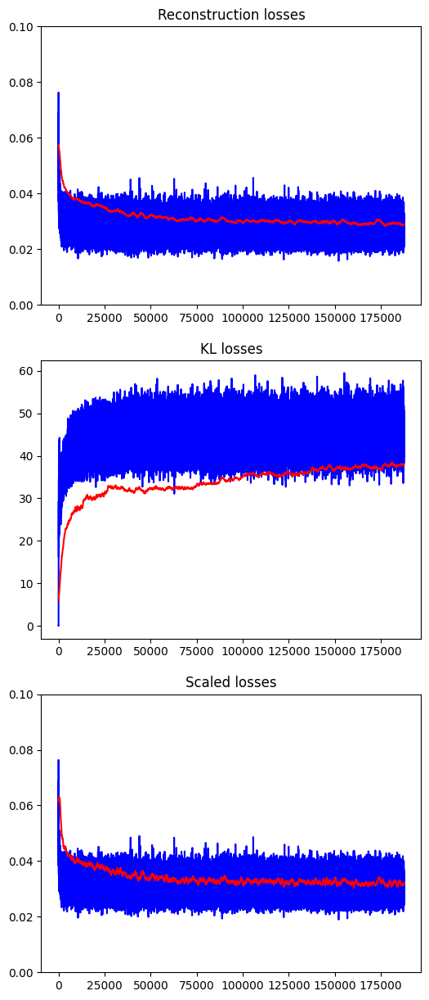

In [22]:
fig, axs = plt.subplots(3, 1, figsize = (6, 15))

train_losses_reconstruction_avg = [np.mean(train_losses_reconstruction[i:i+50]) for i in range(3750)] #CHANGE dEPENDING EPOCH, 100 --> 3750
axs[0].plot(np.arange(epochs * 1875), train_losses_reconstruction, color = 'b', label = 'mini-batches')
axs[0].plot(np.arange(0, epochs * 1875, 50), train_losses_reconstruction_avg, color = 'r', label = 'running average')
axs[0].set_ylim(0,0.1)
axs[0].set_title('Reconstruction losses')

train_losses_KL_avg = [np.mean(train_losses_KL[i:i+50]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[1].plot(np.arange(epochs * 1875), train_losses_KL, color = 'b', label = 'mini-batches')
axs[1].plot(np.arange(0, epochs * 1875, 50), train_losses_KL_avg, color = 'r', label = 'running average')
axs[1].set_title('KL losses')

train_losses_total_avg = [np.mean(train_losses_total[i:i+20]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[2].plot(np.arange(epochs * 1875), train_losses_total, color = 'b', label = 'mini-batches')
axs[2].plot(np.arange(0, epochs * 1875, 50), train_losses_total_avg, color = 'r', label = 'running average')
axs[2].set_ylim(0,0.1)
axs[2].set_title('Scaled losses')

plt.show()

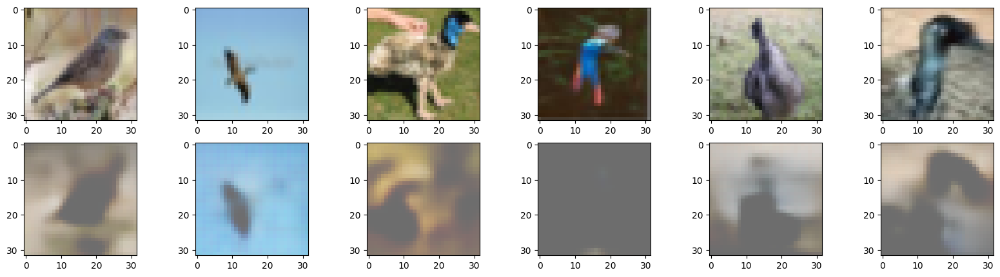

In [23]:
fig, axs = plt.subplots(2, 6, figsize = (20, 5))
for i in range(6):
    axs[0][i].imshow(X[i+10000,:,:,:].permute(1,2,0))
_, _, new_fig = model(X[10000:10006, :, :, :].to(device))
for i in range(6):
    axs[1][i].imshow(new_fig[i].permute(1,2,0).cpu().detach().numpy())

Text(0.5, 1.0, 'comparison between the latent spaces')

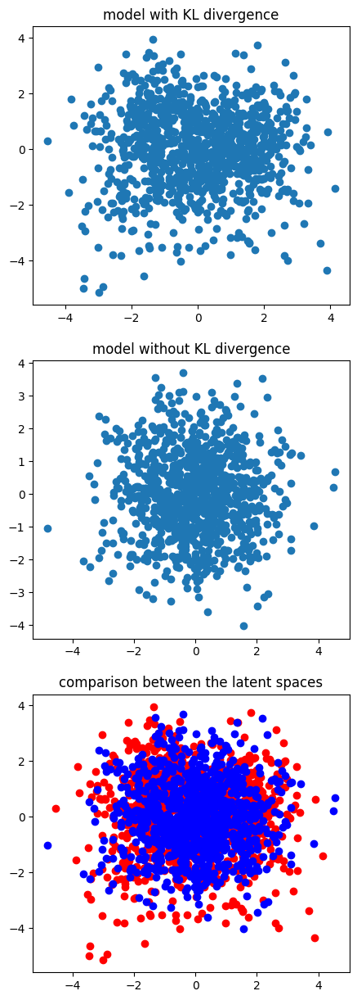

In [24]:
pca = PCA(n_components = 2)

_,_,latent_model1 = model.encode(X[:1000].to(device))
_,_,latent_model2 = model2.encode(X[:1000].to(device))
latent_model1 = latent_model1.cpu().detach().numpy()
latent_model2 = latent_model2.cpu().detach().numpy()

fig, axs = plt.subplots(3, figsize = (5, 15))
plot_X_1 = pca.fit_transform(latent_model1)
axs[0].scatter(plot_X_1[:,0], plot_X_1[:,1])
axs[0].set_title('model with KL divergence')
plot_X_2 = pca.fit_transform(latent_model2)
axs[1].scatter(plot_X_2[:, 0], plot_X_2[:, 1])
axs[1].set_title('model without KL divergence')

axs[2].scatter(plot_X_1[:,0], plot_X_1[:, 1], color = 'r')
axs[2].scatter(plot_X_2[:,0], plot_X_2[:, 1], color = 'b')
axs[2].set_title('comparison between the latent spaces')

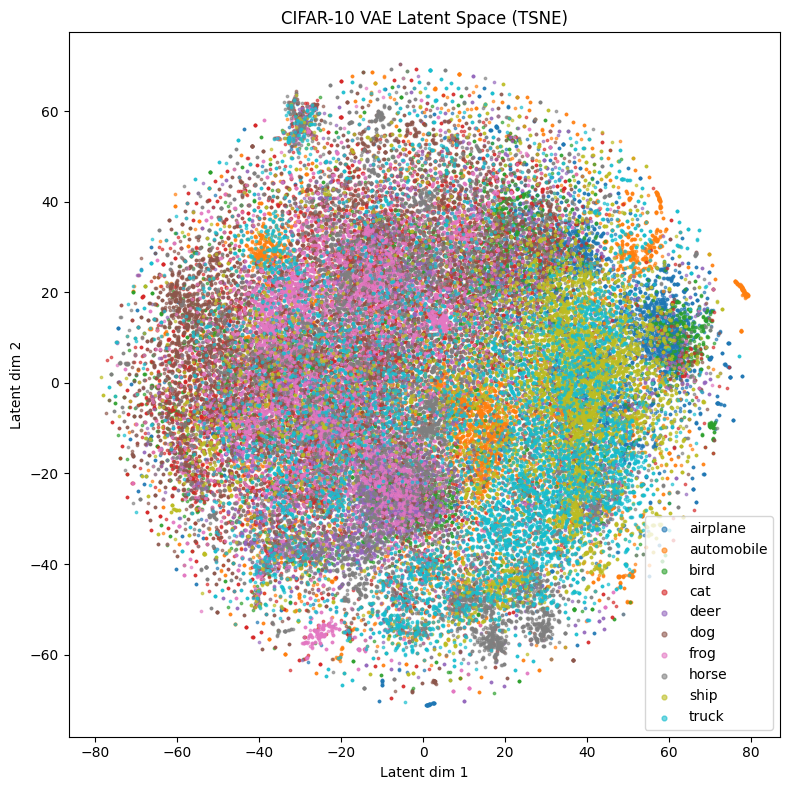

In [25]:
vae = model  # your trained VAE
vae.eval()

latents = []
batch_size = 256
device = next(vae.parameters()).device
labels = np.array(labels)
with torch.no_grad():
    for i in range(0, len(X), batch_size):
        batch = X[i:i+batch_size].to(device)
        mean, logvar, z = vae.encode(batch)
        latents.append(mean.cpu().numpy())
latents = np.concatenate(latents, axis=0)

# Step 3: t-SNE or PCA

reducer = TSNE(n_components=2, random_state=42,perplexity=30)
# reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (TSNE)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

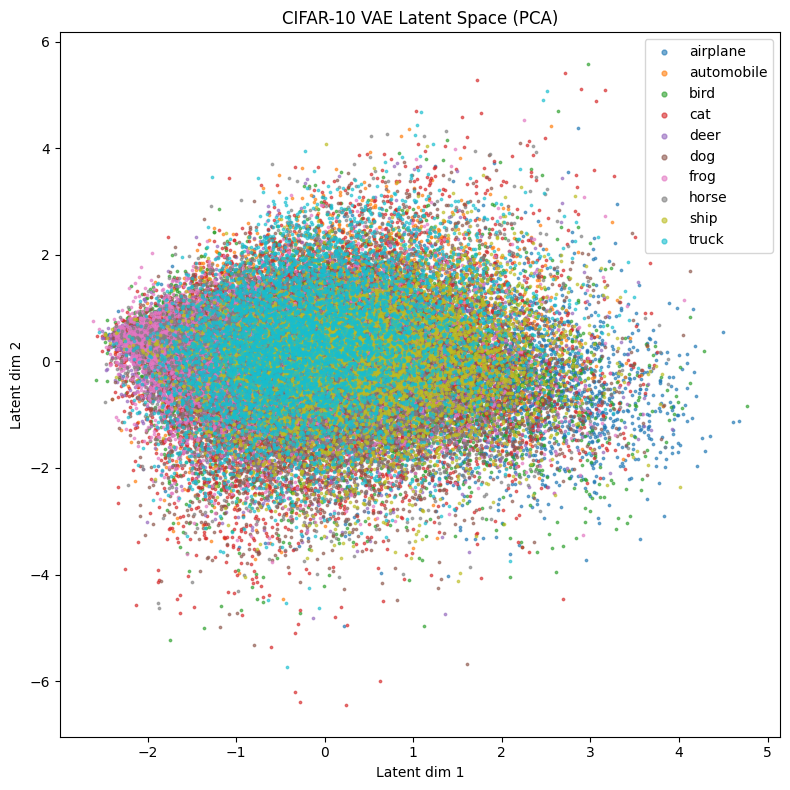

In [26]:
reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (PCA)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

2. Train Convolutional VAE Model with more epochs: use epochs = 150

In [27]:
class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args
        
    def forward(self, x):
        return x.view(self.shape)
    
class Trim(nn.Module):
    def __init__(self):
        super(Trim, self).__init__()
    
    def forward(self, x):
        return x[:, :, :32, :32]
    
class VAE(nn.Module):
    def __init__(self):
        
        # [(W−K+2P)/S]+1
        super(VAE, self).__init__()
        # Unfortunately, we cannot have maxunpool2d in nn.Sequential, so we have to write them out

        self.conv1 = nn.Conv2d(3, 32, 3, stride = 2, padding = 1)
        self.conv2 = nn.Conv2d(32, 64, 3, stride = 2, padding = 1)
        self.conv3 = nn.Conv2d(64, 128, 3, stride = 2, padding = 1)
        self.flatten = nn.Flatten()
        
        self.linear_mean = nn.Linear(2048, 100)
        self.linear_logvar = nn.Linear(2048, 100)

        self.linear = nn.Linear(100, 2048)
        self.reshape = Reshape(-1, 128, 4, 4)
        self.deconv1 = nn.ConvTranspose2d(128, 64, 3, stride = 2, padding=0)
        self.deconv2 = nn.ConvTranspose2d(64, 32, 3, stride = 2, padding=1)
        self.deconv3 = nn.ConvTranspose2d(32, 3, 3, stride = 2, padding=1)
        self.trim = Trim()
    
    def reparameterized(self, mean, var):
        eps = torch.randn(mean.size(0), mean.size(1)).to(device)
        z = mean + eps * torch.exp(var / 2.)
        return z

    def encode(self, x): # Using silu instead of relu here
        x = F.silu(self.conv1(x))
        x = F.silu(self.conv2(x))
        x = self.conv3(x)
        x = self.flatten(x)
        mean = self.linear_mean(x)
        var = self.linear_logvar(x)
        z = self.reparameterized(mean, var)
        return mean, var, z

    def decode(self, z):
        z = self.linear(z)
        z = self.reshape(z)
        z = F.silu(self.deconv1(z))
        z = F.silu(self.deconv2(z))
        z = F.silu(self.deconv3(z))
        z = self.trim(z)
        z = F.sigmoid(z)
        return z
    
    def forward(self, x):
        mean, var, z = self.encode(x)
        z = self.decode(z)
        return mean, var, z

model = VAE().to(device)
model2 = VAE().to(device)
# print(X.shape)

x = torch.randn(1, 3, 32, 32).to(device)
model(x)
summary(model, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 16, 16]             896
            Conv2d-2             [-1, 64, 8, 8]          18,496
            Conv2d-3            [-1, 128, 4, 4]          73,856
           Flatten-4                 [-1, 2048]               0
            Linear-5                  [-1, 100]         204,900
            Linear-6                  [-1, 100]         204,900
            Linear-7                 [-1, 2048]         206,848
           Reshape-8            [-1, 128, 4, 4]               0
   ConvTranspose2d-9             [-1, 64, 9, 9]          73,792
  ConvTranspose2d-10           [-1, 32, 17, 17]          18,464
  ConvTranspose2d-11            [-1, 3, 33, 33]             867
             Trim-12            [-1, 3, 32, 32]               0
Total params: 803,019
Trainable params: 803,019
Non-trainable params: 0
-------------------------------

In [28]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
KL_weight = 0.000075 # The KL divergence is much larger than MAE loss, scaling it down
epochs = 150

train_losses_total, train_losses_total_avg = [], []
train_losses_reconstruction, train_losses_reconstruction_avg = [], []
train_losses_KL, train_losses_KL_avg = [], []
for epoch in range(epochs):
    train_loss_total = 0.0
    train_loss_reconstruction = 0.0
    train_loss_KL = 0.0
    for images in tqdm(image_loader):
        images = images.to(device)
        mean, var, outputs = model(images)

        optimizer.zero_grad()
        loss1 = criterion(outputs, images)
        loss2 = torch.mean(-0.5 * torch.sum(1 + var - mean**2 - torch.exp(var),axis=1),axis=0) # sum over latent dimension, not batch
        # -0.5 * torch.sum(1 + var - mean**2 - torch.exp(var), axis = 1).mean()
        # loss2 = torch.atan(loss2) / (np.pi / 2) # scaling it to [0,1]        
        loss = loss1  + KL_weight * loss2
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            train_losses_reconstruction.append(loss1.item())
            train_losses_KL.append(loss2.item())
            train_losses_total.append(loss.item())
            train_loss_reconstruction += loss1.item() * images.size(0)
            train_loss_KL += loss2.item() * images.size(0)
            train_loss_total += loss.item() * images.size(0)
    
    train_loss_total /= len(image_loader)
    train_loss_reconstruction /= len(image_loader)
    train_loss_KL /= len(image_loader)
    
    train_losses_total_avg.append(train_loss_total)
    train_losses_reconstruction_avg.append(train_loss_reconstruction)
    train_losses_KL_avg.append(train_loss_KL)
    
    print('-----------------------------------------------------')
    print(f'Epoch{epoch + 1}')
    print(f'Total loss = {train_loss_total:.3f}')
    print(f'Reconstruction loss = {train_loss_reconstruction:.3f}, KL = {train_loss_KL:.3f}')

    log = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict()
    }

    torch.save(log, f'model1_log_{epoch + 1}.pth')     

100%|██████████| 1875/1875 [00:06<00:00, 305.43it/s]


-----------------------------------------------------
Epoch1
Total loss = 1.116
Reconstruction loss = 1.025, KL = 1214.645


100%|██████████| 1875/1875 [00:05<00:00, 328.18it/s]


-----------------------------------------------------
Epoch2
Total loss = 1.023
Reconstruction loss = 0.921, KL = 1368.535


100%|██████████| 1875/1875 [00:05<00:00, 335.64it/s]


-----------------------------------------------------
Epoch3
Total loss = 1.012
Reconstruction loss = 0.905, KL = 1423.715


100%|██████████| 1875/1875 [00:05<00:00, 343.70it/s]


-----------------------------------------------------
Epoch4
Total loss = 1.006
Reconstruction loss = 0.898, KL = 1443.723


100%|██████████| 1875/1875 [00:05<00:00, 353.10it/s]


-----------------------------------------------------
Epoch5
Total loss = 1.003
Reconstruction loss = 0.894, KL = 1453.324


100%|██████████| 1875/1875 [00:05<00:00, 337.22it/s]


-----------------------------------------------------
Epoch6
Total loss = 1.001
Reconstruction loss = 0.891, KL = 1462.908


100%|██████████| 1875/1875 [00:05<00:00, 348.97it/s]


-----------------------------------------------------
Epoch7
Total loss = 0.999
Reconstruction loss = 0.889, KL = 1468.614


100%|██████████| 1875/1875 [00:05<00:00, 342.77it/s]


-----------------------------------------------------
Epoch8
Total loss = 0.998
Reconstruction loss = 0.888, KL = 1472.618


100%|██████████| 1875/1875 [00:05<00:00, 333.69it/s]


-----------------------------------------------------
Epoch9
Total loss = 0.997
Reconstruction loss = 0.886, KL = 1474.660


100%|██████████| 1875/1875 [00:05<00:00, 346.72it/s]


-----------------------------------------------------
Epoch10
Total loss = 0.996
Reconstruction loss = 0.885, KL = 1478.050


100%|██████████| 1875/1875 [00:05<00:00, 342.36it/s]


-----------------------------------------------------
Epoch11
Total loss = 0.995
Reconstruction loss = 0.884, KL = 1479.101


100%|██████████| 1875/1875 [00:05<00:00, 356.99it/s]


-----------------------------------------------------
Epoch12
Total loss = 0.995
Reconstruction loss = 0.884, KL = 1480.108


100%|██████████| 1875/1875 [00:05<00:00, 348.85it/s]


-----------------------------------------------------
Epoch13
Total loss = 0.994
Reconstruction loss = 0.883, KL = 1480.140


100%|██████████| 1875/1875 [00:06<00:00, 306.49it/s]


-----------------------------------------------------
Epoch14
Total loss = 0.994
Reconstruction loss = 0.883, KL = 1481.350


100%|██████████| 1875/1875 [00:05<00:00, 313.60it/s]


-----------------------------------------------------
Epoch15
Total loss = 0.993
Reconstruction loss = 0.882, KL = 1482.718


100%|██████████| 1875/1875 [00:05<00:00, 338.96it/s]


-----------------------------------------------------
Epoch16
Total loss = 0.993
Reconstruction loss = 0.881, KL = 1483.825


100%|██████████| 1875/1875 [00:05<00:00, 332.14it/s]


-----------------------------------------------------
Epoch17
Total loss = 0.992
Reconstruction loss = 0.881, KL = 1483.065


100%|██████████| 1875/1875 [00:05<00:00, 345.56it/s]


-----------------------------------------------------
Epoch18
Total loss = 0.992
Reconstruction loss = 0.880, KL = 1482.707


100%|██████████| 1875/1875 [00:05<00:00, 332.17it/s]


-----------------------------------------------------
Epoch19
Total loss = 0.991
Reconstruction loss = 0.880, KL = 1483.205


100%|██████████| 1875/1875 [00:05<00:00, 316.11it/s]


-----------------------------------------------------
Epoch20
Total loss = 0.991
Reconstruction loss = 0.880, KL = 1482.608


100%|██████████| 1875/1875 [00:05<00:00, 342.29it/s]


-----------------------------------------------------
Epoch21
Total loss = 0.991
Reconstruction loss = 0.879, KL = 1484.011


100%|██████████| 1875/1875 [00:06<00:00, 308.32it/s]


-----------------------------------------------------
Epoch22
Total loss = 0.990
Reconstruction loss = 0.879, KL = 1483.488


100%|██████████| 1875/1875 [00:06<00:00, 270.02it/s]


-----------------------------------------------------
Epoch23
Total loss = 0.990
Reconstruction loss = 0.879, KL = 1483.506


100%|██████████| 1875/1875 [00:06<00:00, 302.11it/s]


-----------------------------------------------------
Epoch24
Total loss = 0.990
Reconstruction loss = 0.878, KL = 1485.570


100%|██████████| 1875/1875 [00:05<00:00, 323.41it/s]


-----------------------------------------------------
Epoch25
Total loss = 0.990
Reconstruction loss = 0.878, KL = 1485.615


100%|██████████| 1875/1875 [00:05<00:00, 332.80it/s]


-----------------------------------------------------
Epoch26
Total loss = 0.989
Reconstruction loss = 0.878, KL = 1485.481


100%|██████████| 1875/1875 [00:05<00:00, 334.50it/s]


-----------------------------------------------------
Epoch27
Total loss = 0.989
Reconstruction loss = 0.878, KL = 1487.762


100%|██████████| 1875/1875 [00:05<00:00, 337.17it/s]


-----------------------------------------------------
Epoch28
Total loss = 0.989
Reconstruction loss = 0.878, KL = 1486.543


100%|██████████| 1875/1875 [00:05<00:00, 340.49it/s]


-----------------------------------------------------
Epoch29
Total loss = 0.989
Reconstruction loss = 0.877, KL = 1487.898


100%|██████████| 1875/1875 [00:05<00:00, 333.30it/s]


-----------------------------------------------------
Epoch30
Total loss = 0.989
Reconstruction loss = 0.877, KL = 1486.373


100%|██████████| 1875/1875 [00:05<00:00, 323.71it/s]


-----------------------------------------------------
Epoch31
Total loss = 0.989
Reconstruction loss = 0.877, KL = 1487.753


100%|██████████| 1875/1875 [00:05<00:00, 341.21it/s]


-----------------------------------------------------
Epoch32
Total loss = 0.988
Reconstruction loss = 0.877, KL = 1486.572


100%|██████████| 1875/1875 [00:05<00:00, 339.03it/s]


-----------------------------------------------------
Epoch33
Total loss = 0.988
Reconstruction loss = 0.877, KL = 1486.443


100%|██████████| 1875/1875 [00:05<00:00, 339.16it/s]


-----------------------------------------------------
Epoch34
Total loss = 0.988
Reconstruction loss = 0.877, KL = 1487.136


100%|██████████| 1875/1875 [00:05<00:00, 336.68it/s]


-----------------------------------------------------
Epoch35
Total loss = 0.988
Reconstruction loss = 0.877, KL = 1486.986


100%|██████████| 1875/1875 [00:05<00:00, 341.19it/s]


-----------------------------------------------------
Epoch36
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1487.694


100%|██████████| 1875/1875 [00:05<00:00, 334.31it/s]


-----------------------------------------------------
Epoch37
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1487.702


100%|██████████| 1875/1875 [00:05<00:00, 336.19it/s]


-----------------------------------------------------
Epoch38
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1486.963


100%|██████████| 1875/1875 [00:05<00:00, 350.95it/s]


-----------------------------------------------------
Epoch39
Total loss = 0.987
Reconstruction loss = 0.876, KL = 1487.026


100%|██████████| 1875/1875 [00:05<00:00, 335.09it/s]


-----------------------------------------------------
Epoch40
Total loss = 0.988
Reconstruction loss = 0.876, KL = 1487.424


100%|██████████| 1875/1875 [00:05<00:00, 331.46it/s]


-----------------------------------------------------
Epoch41
Total loss = 0.987
Reconstruction loss = 0.876, KL = 1487.785


100%|██████████| 1875/1875 [00:05<00:00, 335.34it/s]


-----------------------------------------------------
Epoch42
Total loss = 0.987
Reconstruction loss = 0.876, KL = 1487.656


100%|██████████| 1875/1875 [00:05<00:00, 345.64it/s]


-----------------------------------------------------
Epoch43
Total loss = 0.987
Reconstruction loss = 0.876, KL = 1487.882


100%|██████████| 1875/1875 [00:05<00:00, 333.16it/s]


-----------------------------------------------------
Epoch44
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.681


100%|██████████| 1875/1875 [00:06<00:00, 286.44it/s]


-----------------------------------------------------
Epoch45
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1490.003


100%|██████████| 1875/1875 [00:05<00:00, 318.06it/s]


-----------------------------------------------------
Epoch46
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.628


100%|██████████| 1875/1875 [00:05<00:00, 337.85it/s]


-----------------------------------------------------
Epoch47
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1489.143


100%|██████████| 1875/1875 [00:05<00:00, 326.19it/s]


-----------------------------------------------------
Epoch48
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1489.395


100%|██████████| 1875/1875 [00:05<00:00, 331.38it/s]


-----------------------------------------------------
Epoch49
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.842


100%|██████████| 1875/1875 [00:05<00:00, 341.76it/s]


-----------------------------------------------------
Epoch50
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.916


100%|██████████| 1875/1875 [00:05<00:00, 314.23it/s]


-----------------------------------------------------
Epoch51
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.369


100%|██████████| 1875/1875 [00:05<00:00, 340.19it/s]


-----------------------------------------------------
Epoch52
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1488.401


100%|██████████| 1875/1875 [00:05<00:00, 339.70it/s]


-----------------------------------------------------
Epoch53
Total loss = 0.987
Reconstruction loss = 0.875, KL = 1489.199


100%|██████████| 1875/1875 [00:05<00:00, 313.73it/s]


-----------------------------------------------------
Epoch54
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1489.123


100%|██████████| 1875/1875 [00:06<00:00, 300.39it/s]


-----------------------------------------------------
Epoch55
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1489.376


100%|██████████| 1875/1875 [00:06<00:00, 272.81it/s]


-----------------------------------------------------
Epoch56
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1488.204


100%|██████████| 1875/1875 [00:06<00:00, 277.57it/s]


-----------------------------------------------------
Epoch57
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1487.612


100%|██████████| 1875/1875 [00:06<00:00, 273.63it/s]


-----------------------------------------------------
Epoch58
Total loss = 0.986
Reconstruction loss = 0.875, KL = 1489.433


100%|██████████| 1875/1875 [00:06<00:00, 276.95it/s]


-----------------------------------------------------
Epoch59
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1491.378


100%|██████████| 1875/1875 [00:06<00:00, 297.67it/s]


-----------------------------------------------------
Epoch60
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.175


100%|██████████| 1875/1875 [00:07<00:00, 266.68it/s]


-----------------------------------------------------
Epoch61
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1487.332


100%|██████████| 1875/1875 [00:06<00:00, 292.95it/s]


-----------------------------------------------------
Epoch62
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.400


100%|██████████| 1875/1875 [00:06<00:00, 279.28it/s]


-----------------------------------------------------
Epoch63
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.379


100%|██████████| 1875/1875 [00:06<00:00, 275.06it/s]


-----------------------------------------------------
Epoch64
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.881


100%|██████████| 1875/1875 [00:06<00:00, 279.11it/s]


-----------------------------------------------------
Epoch65
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1487.708


100%|██████████| 1875/1875 [00:07<00:00, 264.52it/s]


-----------------------------------------------------
Epoch66
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.315


100%|██████████| 1875/1875 [00:06<00:00, 280.22it/s]


-----------------------------------------------------
Epoch67
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.933


100%|██████████| 1875/1875 [00:06<00:00, 284.60it/s]


-----------------------------------------------------
Epoch68
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.989


100%|██████████| 1875/1875 [00:06<00:00, 276.10it/s]


-----------------------------------------------------
Epoch69
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.455


100%|██████████| 1875/1875 [00:06<00:00, 278.65it/s]


-----------------------------------------------------
Epoch70
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.078


100%|██████████| 1875/1875 [00:06<00:00, 284.09it/s]


-----------------------------------------------------
Epoch71
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1488.218


100%|██████████| 1875/1875 [00:06<00:00, 287.64it/s]


-----------------------------------------------------
Epoch72
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1490.549


100%|██████████| 1875/1875 [00:06<00:00, 278.36it/s]


-----------------------------------------------------
Epoch73
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1489.771


100%|██████████| 1875/1875 [00:06<00:00, 286.15it/s]


-----------------------------------------------------
Epoch74
Total loss = 0.986
Reconstruction loss = 0.874, KL = 1489.578


100%|██████████| 1875/1875 [00:06<00:00, 279.92it/s]


-----------------------------------------------------
Epoch75
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1489.449


100%|██████████| 1875/1875 [00:06<00:00, 286.18it/s]


-----------------------------------------------------
Epoch76
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1490.684


100%|██████████| 1875/1875 [00:06<00:00, 272.57it/s]


-----------------------------------------------------
Epoch77
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1488.888


100%|██████████| 1875/1875 [00:06<00:00, 270.84it/s]


-----------------------------------------------------
Epoch78
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1490.821


100%|██████████| 1875/1875 [00:07<00:00, 258.62it/s]


-----------------------------------------------------
Epoch79
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1489.396


100%|██████████| 1875/1875 [00:06<00:00, 275.36it/s]


-----------------------------------------------------
Epoch80
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1489.540


100%|██████████| 1875/1875 [00:06<00:00, 286.36it/s]


-----------------------------------------------------
Epoch81
Total loss = 0.985
Reconstruction loss = 0.874, KL = 1488.597


100%|██████████| 1875/1875 [00:06<00:00, 275.58it/s]


-----------------------------------------------------
Epoch82
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.418


100%|██████████| 1875/1875 [00:06<00:00, 285.59it/s]


-----------------------------------------------------
Epoch83
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.605


100%|██████████| 1875/1875 [00:06<00:00, 273.40it/s]


-----------------------------------------------------
Epoch84
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.393


100%|██████████| 1875/1875 [00:07<00:00, 256.73it/s]


-----------------------------------------------------
Epoch85
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1488.391


100%|██████████| 1875/1875 [00:06<00:00, 284.76it/s]


-----------------------------------------------------
Epoch86
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.204


100%|██████████| 1875/1875 [00:07<00:00, 266.85it/s]


-----------------------------------------------------
Epoch87
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1488.739


100%|██████████| 1875/1875 [00:06<00:00, 286.26it/s]


-----------------------------------------------------
Epoch88
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.012


100%|██████████| 1875/1875 [00:06<00:00, 302.14it/s]


-----------------------------------------------------
Epoch89
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.374


100%|██████████| 1875/1875 [00:05<00:00, 341.82it/s]


-----------------------------------------------------
Epoch90
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.407


100%|██████████| 1875/1875 [00:05<00:00, 330.18it/s]


-----------------------------------------------------
Epoch91
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.558


100%|██████████| 1875/1875 [00:05<00:00, 331.81it/s]


-----------------------------------------------------
Epoch92
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1488.812


100%|██████████| 1875/1875 [00:05<00:00, 336.51it/s]


-----------------------------------------------------
Epoch93
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.666


100%|██████████| 1875/1875 [00:05<00:00, 343.29it/s]


-----------------------------------------------------
Epoch94
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.414


100%|██████████| 1875/1875 [00:05<00:00, 324.98it/s]


-----------------------------------------------------
Epoch95
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1491.285


100%|██████████| 1875/1875 [00:05<00:00, 345.97it/s]


-----------------------------------------------------
Epoch96
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.991


100%|██████████| 1875/1875 [00:05<00:00, 326.11it/s]


-----------------------------------------------------
Epoch97
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.533


100%|██████████| 1875/1875 [00:05<00:00, 329.32it/s]


-----------------------------------------------------
Epoch98
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.267


100%|██████████| 1875/1875 [00:05<00:00, 329.40it/s]


-----------------------------------------------------
Epoch99
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1488.422


100%|██████████| 1875/1875 [00:05<00:00, 339.07it/s]


-----------------------------------------------------
Epoch100
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.590


100%|██████████| 1875/1875 [00:05<00:00, 333.91it/s]


-----------------------------------------------------
Epoch101
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1488.546


100%|██████████| 1875/1875 [00:05<00:00, 333.66it/s]


-----------------------------------------------------
Epoch102
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1488.895


100%|██████████| 1875/1875 [00:05<00:00, 337.28it/s]


-----------------------------------------------------
Epoch103
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.067


100%|██████████| 1875/1875 [00:05<00:00, 329.01it/s]


-----------------------------------------------------
Epoch104
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1488.963


100%|██████████| 1875/1875 [00:05<00:00, 340.36it/s]


-----------------------------------------------------
Epoch105
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.195


100%|██████████| 1875/1875 [00:05<00:00, 324.97it/s]


-----------------------------------------------------
Epoch106
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.117


100%|██████████| 1875/1875 [00:05<00:00, 340.98it/s]


-----------------------------------------------------
Epoch107
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1489.572


100%|██████████| 1875/1875 [00:05<00:00, 319.16it/s]


-----------------------------------------------------
Epoch108
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1488.157


100%|██████████| 1875/1875 [00:06<00:00, 292.61it/s]


-----------------------------------------------------
Epoch109
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.113


100%|██████████| 1875/1875 [00:06<00:00, 276.04it/s]


-----------------------------------------------------
Epoch110
Total loss = 0.985
Reconstruction loss = 0.873, KL = 1490.200


100%|██████████| 1875/1875 [00:05<00:00, 320.22it/s]


-----------------------------------------------------
Epoch111
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.539


100%|██████████| 1875/1875 [00:05<00:00, 323.50it/s]


-----------------------------------------------------
Epoch112
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.100


100%|██████████| 1875/1875 [00:05<00:00, 329.30it/s]


-----------------------------------------------------
Epoch113
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1488.568


100%|██████████| 1875/1875 [00:05<00:00, 335.95it/s]


-----------------------------------------------------
Epoch114
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1490.294


100%|██████████| 1875/1875 [00:05<00:00, 335.26it/s]


-----------------------------------------------------
Epoch115
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.416


100%|██████████| 1875/1875 [00:05<00:00, 329.30it/s]


-----------------------------------------------------
Epoch116
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1491.018


100%|██████████| 1875/1875 [00:05<00:00, 333.20it/s]


-----------------------------------------------------
Epoch117
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1490.319


100%|██████████| 1875/1875 [00:05<00:00, 326.15it/s]


-----------------------------------------------------
Epoch118
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1491.348


100%|██████████| 1875/1875 [00:05<00:00, 334.21it/s]


-----------------------------------------------------
Epoch119
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.522


100%|██████████| 1875/1875 [00:06<00:00, 301.99it/s]


-----------------------------------------------------
Epoch120
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1490.460


100%|██████████| 1875/1875 [00:05<00:00, 335.44it/s]


-----------------------------------------------------
Epoch121
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.961


100%|██████████| 1875/1875 [00:05<00:00, 346.61it/s]


-----------------------------------------------------
Epoch122
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.011


100%|██████████| 1875/1875 [00:05<00:00, 329.90it/s]


-----------------------------------------------------
Epoch123
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1489.254


100%|██████████| 1875/1875 [00:05<00:00, 342.41it/s]


-----------------------------------------------------
Epoch124
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1490.280


100%|██████████| 1875/1875 [00:05<00:00, 327.52it/s]


-----------------------------------------------------
Epoch125
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.734


100%|██████████| 1875/1875 [00:05<00:00, 323.31it/s]


-----------------------------------------------------
Epoch126
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1489.809


100%|██████████| 1875/1875 [00:05<00:00, 334.03it/s]


-----------------------------------------------------
Epoch127
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1492.279


100%|██████████| 1875/1875 [00:05<00:00, 337.45it/s]


-----------------------------------------------------
Epoch128
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.898


100%|██████████| 1875/1875 [00:05<00:00, 320.10it/s]


-----------------------------------------------------
Epoch129
Total loss = 0.984
Reconstruction loss = 0.873, KL = 1488.904


100%|██████████| 1875/1875 [00:05<00:00, 315.76it/s]


-----------------------------------------------------
Epoch130
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1491.491


100%|██████████| 1875/1875 [00:06<00:00, 274.55it/s]


-----------------------------------------------------
Epoch131
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.088


100%|██████████| 1875/1875 [00:06<00:00, 295.12it/s]


-----------------------------------------------------
Epoch132
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.111


100%|██████████| 1875/1875 [00:05<00:00, 338.86it/s]


-----------------------------------------------------
Epoch133
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1491.184


100%|██████████| 1875/1875 [00:05<00:00, 314.00it/s]


-----------------------------------------------------
Epoch134
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1488.309


100%|██████████| 1875/1875 [00:05<00:00, 344.10it/s]


-----------------------------------------------------
Epoch135
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1488.595


100%|██████████| 1875/1875 [00:05<00:00, 348.90it/s]


-----------------------------------------------------
Epoch136
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1488.236


100%|██████████| 1875/1875 [00:05<00:00, 327.35it/s]


-----------------------------------------------------
Epoch137
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1489.106


100%|██████████| 1875/1875 [00:05<00:00, 344.10it/s]


-----------------------------------------------------
Epoch138
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1489.508


100%|██████████| 1875/1875 [00:05<00:00, 319.54it/s]


-----------------------------------------------------
Epoch139
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.511


100%|██████████| 1875/1875 [00:05<00:00, 336.51it/s]


-----------------------------------------------------
Epoch140
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.910


100%|██████████| 1875/1875 [00:05<00:00, 334.56it/s]


-----------------------------------------------------
Epoch141
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.362


100%|██████████| 1875/1875 [00:05<00:00, 338.97it/s]


-----------------------------------------------------
Epoch142
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1489.941


100%|██████████| 1875/1875 [00:05<00:00, 334.11it/s]


-----------------------------------------------------
Epoch143
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1489.416


100%|██████████| 1875/1875 [00:05<00:00, 347.67it/s]


-----------------------------------------------------
Epoch144
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.296


100%|██████████| 1875/1875 [00:06<00:00, 280.58it/s]


-----------------------------------------------------
Epoch145
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1489.699


100%|██████████| 1875/1875 [00:05<00:00, 331.22it/s]


-----------------------------------------------------
Epoch146
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.305


100%|██████████| 1875/1875 [00:05<00:00, 335.97it/s]


-----------------------------------------------------
Epoch147
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1488.480


100%|██████████| 1875/1875 [00:05<00:00, 317.99it/s]


-----------------------------------------------------
Epoch148
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1490.167


100%|██████████| 1875/1875 [00:05<00:00, 330.83it/s]


-----------------------------------------------------
Epoch149
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1491.728


100%|██████████| 1875/1875 [00:05<00:00, 339.80it/s]

-----------------------------------------------------
Epoch150
Total loss = 0.984
Reconstruction loss = 0.872, KL = 1489.782


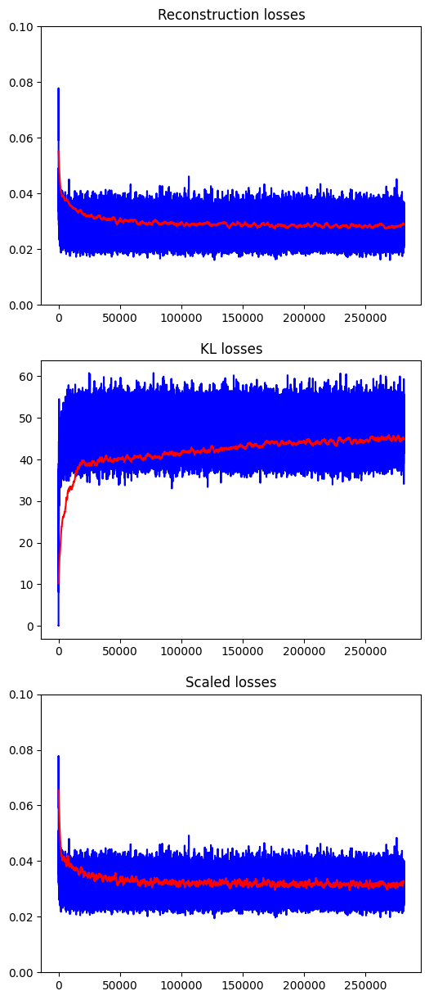

In [29]:
fig, axs = plt.subplots(3, 1, figsize = (6, 15))

train_losses_reconstruction_avg = [np.mean(train_losses_reconstruction[i:i+50]) for i in range(5625)] #CHANGE dEPENDING EPOCH, 100 --> 3750
axs[0].plot(np.arange(epochs * 1875), train_losses_reconstruction, color = 'b', label = 'mini-batches')
axs[0].plot(np.arange(0, epochs * 1875, 50), train_losses_reconstruction_avg, color = 'r', label = 'running average')
axs[0].set_ylim(0,0.1)
axs[0].set_title('Reconstruction losses')

train_losses_KL_avg = [np.mean(train_losses_KL[i:i+50]) for i in range(5625)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[1].plot(np.arange(epochs * 1875), train_losses_KL, color = 'b', label = 'mini-batches')
axs[1].plot(np.arange(0, epochs * 1875, 50), train_losses_KL_avg, color = 'r', label = 'running average')
axs[1].set_title('KL losses')

train_losses_total_avg = [np.mean(train_losses_total[i:i+20]) for i in range(5625)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[2].plot(np.arange(epochs * 1875), train_losses_total, color = 'b', label = 'mini-batches')
axs[2].plot(np.arange(0, epochs * 1875, 50), train_losses_total_avg, color = 'r', label = 'running average')
axs[2].set_ylim(0,0.1)
axs[2].set_title('Scaled losses')

plt.show()

Text(0.5, 1.0, 'comparison between the latent spaces')

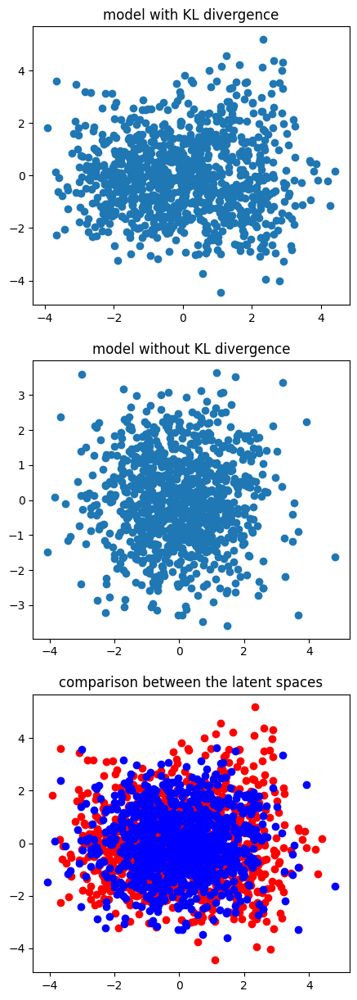

In [30]:
pca = PCA(n_components = 2)

_,_,latent_model1 = model.encode(X[:1000].to(device))
_,_,latent_model2 = model2.encode(X[:1000].to(device))
latent_model1 = latent_model1.cpu().detach().numpy()
latent_model2 = latent_model2.cpu().detach().numpy()

fig, axs = plt.subplots(3, figsize = (5, 15))
plot_X_1 = pca.fit_transform(latent_model1)
axs[0].scatter(plot_X_1[:,0], plot_X_1[:,1])
axs[0].set_title('model with KL divergence')
plot_X_2 = pca.fit_transform(latent_model2)
axs[1].scatter(plot_X_2[:, 0], plot_X_2[:, 1])
axs[1].set_title('model without KL divergence')

axs[2].scatter(plot_X_1[:,0], plot_X_1[:, 1], color = 'r')
axs[2].scatter(plot_X_2[:,0], plot_X_2[:, 1], color = 'b')
axs[2].set_title('comparison between the latent spaces')

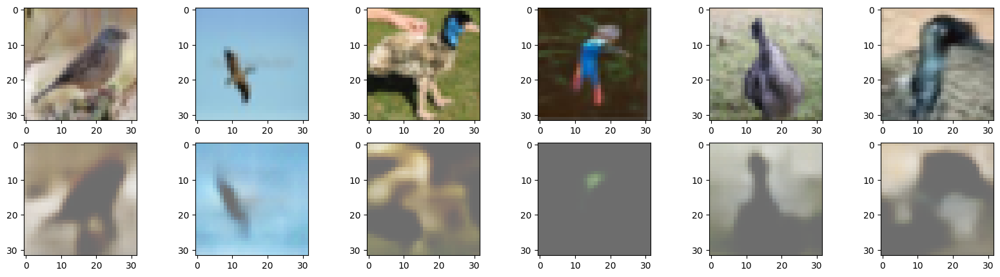

In [31]:
fig, axs = plt.subplots(2, 6, figsize = (20, 5))
for i in range(6):
    axs[0][i].imshow(X[i+10000,:,:,:].permute(1,2,0))
_, _, new_fig = model(X[10000:10006, :, :, :].to(device))
for i in range(6):
    axs[1][i].imshow(new_fig[i].permute(1,2,0).cpu().detach().numpy())

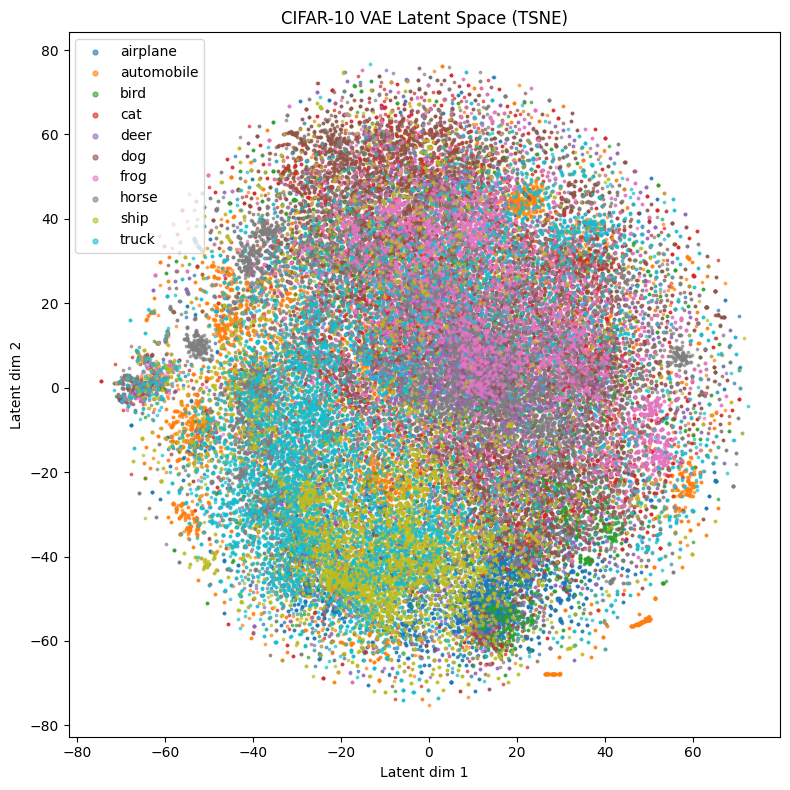

In [32]:
vae = model  # your trained VAE
vae.eval()

latents = []
batch_size = 256
device = next(vae.parameters()).device
labels = np.array(labels)
with torch.no_grad():
    for i in range(0, len(X), batch_size):
        batch = X[i:i+batch_size].to(device)
        mean, logvar, z = vae.encode(batch)
        latents.append(mean.cpu().numpy())
latents = np.concatenate(latents, axis=0)

# Step 3: t-SNE or PCA

reducer = TSNE(n_components=2, random_state=42,perplexity=30)
# reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (TSNE)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

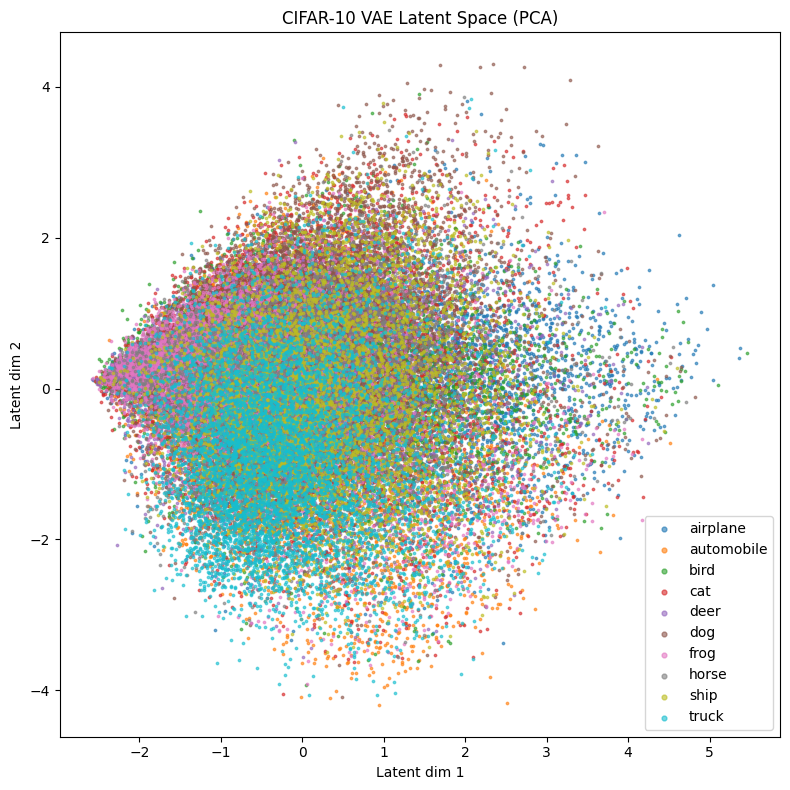

In [33]:
reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (PCA)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

3. Adjust KL weights [beta-VAE]. Initial KL_weight = 0.000075 with beta = 1

a) Use beta = 10

b) use beta = 100 --> KL_Loss to dominate over Reconstruction Loss
 
c) use beta = 0 --> This is autoencoder

** Beta-VAE with beta = 10

In [34]:
from torchsummary import summary
import torch.nn.functional as F

class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args
        
    def forward(self, x):
        return x.view(self.shape)
    
class Trim(nn.Module):
    def __init__(self):
        super(Trim, self).__init__()
    
    def forward(self, x):
        return x[:, :, :32, :32]
    
class VAE(nn.Module):
    def __init__(self):
        
        # [(W−K+2P)/S]+1
        super(VAE, self).__init__()
        # Unfortunately, we cannot have maxunpool2d in nn.Sequential, so we have to write them out

        self.conv1 = nn.Conv2d(3, 32, 3, stride = 2, padding = 1)
        self.conv2 = nn.Conv2d(32, 64, 3, stride = 2, padding = 1)
        self.conv3 = nn.Conv2d(64, 128, 3, stride = 2, padding = 1)
        self.flatten = nn.Flatten()
        
        self.linear_mean = nn.Linear(2048, 100)
        self.linear_logvar = nn.Linear(2048, 100)

        self.linear = nn.Linear(100, 2048)
        self.reshape = Reshape(-1, 128, 4, 4)
        self.deconv1 = nn.ConvTranspose2d(128, 64, 3, stride = 2, padding=0)
        self.deconv2 = nn.ConvTranspose2d(64, 32, 3, stride = 2, padding=1)
        self.deconv3 = nn.ConvTranspose2d(32, 3, 3, stride = 2, padding=1)
        self.trim = Trim()
    
    def reparameterized(self, mean, var):
        eps = torch.randn(mean.size(0), mean.size(1)).to(device)
        z = mean + eps * torch.exp(var / 2.)
        return z

    def encode(self, x): # Using silu instead of relu here
        x = F.silu(self.conv1(x))
        x = F.silu(self.conv2(x))
        x = self.conv3(x)
        x = self.flatten(x)
        mean = self.linear_mean(x)
        var = self.linear_logvar(x)
        z = self.reparameterized(mean, var)
        return mean, var, z

    def decode(self, z):
        z = self.linear(z)
        z = self.reshape(z)
        z = F.silu(self.deconv1(z))
        z = F.silu(self.deconv2(z))
        z = F.silu(self.deconv3(z))
        z = self.trim(z)
        z = F.sigmoid(z)
        return z
    
    def forward(self, x):
        mean, var, z = self.encode(x)
        z = self.decode(z)
        return mean, var, z

model = VAE().to(device)
model2 = VAE().to(device)
# print(X.shape)

x = torch.randn(1, 3, 32, 32).to(device)
model(x)
summary(model, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 16, 16]             896
            Conv2d-2             [-1, 64, 8, 8]          18,496
            Conv2d-3            [-1, 128, 4, 4]          73,856
           Flatten-4                 [-1, 2048]               0
            Linear-5                  [-1, 100]         204,900
            Linear-6                  [-1, 100]         204,900
            Linear-7                 [-1, 2048]         206,848
           Reshape-8            [-1, 128, 4, 4]               0
   ConvTranspose2d-9             [-1, 64, 9, 9]          73,792
  ConvTranspose2d-10           [-1, 32, 17, 17]          18,464
  ConvTranspose2d-11            [-1, 3, 33, 33]             867
             Trim-12            [-1, 3, 32, 32]               0
Total params: 803,019
Trainable params: 803,019
Non-trainable params: 0
-------------------------------

In [35]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
epochs = 100
beta = 10
KL_weight = beta*0.000075 # The KL divergence is much larger than MAE loss, scaling it down

train_losses_total, train_losses_total_avg = [], []
train_losses_reconstruction, train_losses_reconstruction_avg = [], []
train_losses_KL, train_losses_KL_avg = [], []
for epoch in range(epochs):
    train_loss_total = 0.0
    train_loss_reconstruction = 0.0
    train_loss_KL = 0.0
    for images in tqdm(image_loader):
        images = images.to(device)
        mean, var, outputs = model(images)

        optimizer.zero_grad()
        loss1 = criterion(outputs, images)
        loss2 = torch.mean(-0.5 * torch.sum(1 + var - mean**2 - torch.exp(var),axis=1),axis=0) # sum over latent dimension, not batch
        # -0.5 * torch.sum(1 + var - mean**2 - torch.exp(var), axis = 1).mean()
        # loss2 = torch.atan(loss2) / (np.pi / 2) # scaling it to [0,1]        
        loss = loss1  + KL_weight * loss2
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            train_losses_reconstruction.append(loss1.item())
            train_losses_KL.append(loss2.item())
            train_losses_total.append(loss.item())
            train_loss_reconstruction += loss1.item() * images.size(0)
            train_loss_KL += loss2.item() * images.size(0)
            train_loss_total += loss.item() * images.size(0)
    
    train_loss_total /= len(image_loader)
    train_loss_reconstruction /= len(image_loader)
    train_loss_KL /= len(image_loader)
    
    train_losses_total_avg.append(train_loss_total)
    train_losses_reconstruction_avg.append(train_loss_reconstruction)
    train_losses_KL_avg.append(train_loss_KL)
    
    print('-----------------------------------------------------')
    print(f'Epoch{epoch + 1}')
    print(f'Total loss = {train_loss_total:.3f}')
    print(f'Reconstruction loss = {train_loss_reconstruction:.3f}, KL = {train_loss_KL:.3f}')

    log = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict()
    }

    torch.save(log, f'model1_log_{epoch + 1}.pth')     

100%|██████████| 1875/1875 [00:05<00:00, 357.21it/s]


-----------------------------------------------------
Epoch1
Total loss = 1.460
Reconstruction loss = 1.301, KL = 211.573


100%|██████████| 1875/1875 [00:05<00:00, 339.02it/s]


-----------------------------------------------------
Epoch2
Total loss = 1.375
Reconstruction loss = 1.204, KL = 226.923


100%|██████████| 1875/1875 [00:05<00:00, 372.59it/s]


-----------------------------------------------------
Epoch3
Total loss = 1.365
Reconstruction loss = 1.192, KL = 230.349


100%|██████████| 1875/1875 [00:05<00:00, 359.30it/s]


-----------------------------------------------------
Epoch4
Total loss = 1.360
Reconstruction loss = 1.186, KL = 231.493


100%|██████████| 1875/1875 [00:05<00:00, 351.89it/s]


-----------------------------------------------------
Epoch5
Total loss = 1.356
Reconstruction loss = 1.181, KL = 233.169


100%|██████████| 1875/1875 [00:05<00:00, 359.48it/s]


-----------------------------------------------------
Epoch6
Total loss = 1.354
Reconstruction loss = 1.177, KL = 235.045


100%|██████████| 1875/1875 [00:05<00:00, 352.51it/s]


-----------------------------------------------------
Epoch7
Total loss = 1.351
Reconstruction loss = 1.175, KL = 235.043


100%|██████████| 1875/1875 [00:05<00:00, 362.77it/s]


-----------------------------------------------------
Epoch8
Total loss = 1.350
Reconstruction loss = 1.172, KL = 236.501


100%|██████████| 1875/1875 [00:05<00:00, 364.57it/s]


-----------------------------------------------------
Epoch9
Total loss = 1.348
Reconstruction loss = 1.171, KL = 236.324


100%|██████████| 1875/1875 [00:05<00:00, 338.87it/s]


-----------------------------------------------------
Epoch10
Total loss = 1.348
Reconstruction loss = 1.170, KL = 237.076


100%|██████████| 1875/1875 [00:05<00:00, 354.51it/s]


-----------------------------------------------------
Epoch11
Total loss = 1.347
Reconstruction loss = 1.169, KL = 238.492


100%|██████████| 1875/1875 [00:05<00:00, 353.81it/s]


-----------------------------------------------------
Epoch12
Total loss = 1.346
Reconstruction loss = 1.168, KL = 237.754


100%|██████████| 1875/1875 [00:04<00:00, 378.11it/s]


-----------------------------------------------------
Epoch13
Total loss = 1.346
Reconstruction loss = 1.167, KL = 238.166


100%|██████████| 1875/1875 [00:05<00:00, 357.48it/s]


-----------------------------------------------------
Epoch14
Total loss = 1.345
Reconstruction loss = 1.167, KL = 238.192


100%|██████████| 1875/1875 [00:05<00:00, 365.94it/s]


-----------------------------------------------------
Epoch15
Total loss = 1.345
Reconstruction loss = 1.166, KL = 238.207


100%|██████████| 1875/1875 [00:05<00:00, 355.83it/s]


-----------------------------------------------------
Epoch16
Total loss = 1.345
Reconstruction loss = 1.166, KL = 238.937


100%|██████████| 1875/1875 [00:05<00:00, 361.71it/s]


-----------------------------------------------------
Epoch17
Total loss = 1.344
Reconstruction loss = 1.165, KL = 238.703


100%|██████████| 1875/1875 [00:05<00:00, 344.24it/s]


-----------------------------------------------------
Epoch18
Total loss = 1.344
Reconstruction loss = 1.165, KL = 238.598


100%|██████████| 1875/1875 [00:05<00:00, 371.07it/s]


-----------------------------------------------------
Epoch19
Total loss = 1.344
Reconstruction loss = 1.164, KL = 239.085


100%|██████████| 1875/1875 [00:05<00:00, 368.91it/s]


-----------------------------------------------------
Epoch20
Total loss = 1.343
Reconstruction loss = 1.164, KL = 238.737


100%|██████████| 1875/1875 [00:05<00:00, 343.33it/s]


-----------------------------------------------------
Epoch21
Total loss = 1.344
Reconstruction loss = 1.165, KL = 238.432


100%|██████████| 1875/1875 [00:05<00:00, 357.86it/s]


-----------------------------------------------------
Epoch22
Total loss = 1.343
Reconstruction loss = 1.164, KL = 238.665


100%|██████████| 1875/1875 [00:05<00:00, 354.28it/s]


-----------------------------------------------------
Epoch23
Total loss = 1.342
Reconstruction loss = 1.163, KL = 238.966


100%|██████████| 1875/1875 [00:05<00:00, 356.97it/s]


-----------------------------------------------------
Epoch24
Total loss = 1.343
Reconstruction loss = 1.163, KL = 239.147


100%|██████████| 1875/1875 [00:05<00:00, 373.49it/s]


-----------------------------------------------------
Epoch25
Total loss = 1.343
Reconstruction loss = 1.163, KL = 239.258


100%|██████████| 1875/1875 [00:05<00:00, 354.93it/s]


-----------------------------------------------------
Epoch26
Total loss = 1.342
Reconstruction loss = 1.163, KL = 238.717


100%|██████████| 1875/1875 [00:05<00:00, 357.19it/s]


-----------------------------------------------------
Epoch27
Total loss = 1.342
Reconstruction loss = 1.162, KL = 239.019


100%|██████████| 1875/1875 [00:05<00:00, 358.73it/s]


-----------------------------------------------------
Epoch28
Total loss = 1.342
Reconstruction loss = 1.162, KL = 239.339


100%|██████████| 1875/1875 [00:05<00:00, 357.43it/s]


-----------------------------------------------------
Epoch29
Total loss = 1.342
Reconstruction loss = 1.162, KL = 239.531


100%|██████████| 1875/1875 [00:05<00:00, 339.93it/s]


-----------------------------------------------------
Epoch30
Total loss = 1.341
Reconstruction loss = 1.162, KL = 239.644


100%|██████████| 1875/1875 [00:05<00:00, 355.80it/s]


-----------------------------------------------------
Epoch31
Total loss = 1.341
Reconstruction loss = 1.161, KL = 240.036


100%|██████████| 1875/1875 [00:05<00:00, 349.46it/s]


-----------------------------------------------------
Epoch32
Total loss = 1.341
Reconstruction loss = 1.161, KL = 240.086


100%|██████████| 1875/1875 [00:05<00:00, 342.82it/s]


-----------------------------------------------------
Epoch33
Total loss = 1.341
Reconstruction loss = 1.160, KL = 240.770


100%|██████████| 1875/1875 [00:05<00:00, 350.72it/s]


-----------------------------------------------------
Epoch34
Total loss = 1.341
Reconstruction loss = 1.160, KL = 240.642


100%|██████████| 1875/1875 [00:05<00:00, 359.39it/s]


-----------------------------------------------------
Epoch35
Total loss = 1.341
Reconstruction loss = 1.160, KL = 240.980


100%|██████████| 1875/1875 [00:05<00:00, 348.79it/s]


-----------------------------------------------------
Epoch36
Total loss = 1.341
Reconstruction loss = 1.160, KL = 240.755


100%|██████████| 1875/1875 [00:05<00:00, 362.76it/s]


-----------------------------------------------------
Epoch37
Total loss = 1.340
Reconstruction loss = 1.160, KL = 240.414


100%|██████████| 1875/1875 [00:05<00:00, 347.58it/s]


-----------------------------------------------------
Epoch38
Total loss = 1.340
Reconstruction loss = 1.161, KL = 239.747


100%|██████████| 1875/1875 [00:05<00:00, 342.45it/s]


-----------------------------------------------------
Epoch39
Total loss = 1.340
Reconstruction loss = 1.160, KL = 240.235


100%|██████████| 1875/1875 [00:05<00:00, 364.65it/s]


-----------------------------------------------------
Epoch40
Total loss = 1.340
Reconstruction loss = 1.159, KL = 240.181


100%|██████████| 1875/1875 [00:05<00:00, 357.05it/s]


-----------------------------------------------------
Epoch41
Total loss = 1.340
Reconstruction loss = 1.160, KL = 240.353


100%|██████████| 1875/1875 [00:05<00:00, 326.92it/s]


-----------------------------------------------------
Epoch42
Total loss = 1.340
Reconstruction loss = 1.159, KL = 240.881


100%|██████████| 1875/1875 [00:05<00:00, 343.46it/s]


-----------------------------------------------------
Epoch43
Total loss = 1.340
Reconstruction loss = 1.160, KL = 240.649


100%|██████████| 1875/1875 [00:05<00:00, 351.13it/s]


-----------------------------------------------------
Epoch44
Total loss = 1.339
Reconstruction loss = 1.159, KL = 240.547


100%|██████████| 1875/1875 [00:05<00:00, 341.51it/s]


-----------------------------------------------------
Epoch45
Total loss = 1.340
Reconstruction loss = 1.159, KL = 241.290


100%|██████████| 1875/1875 [00:05<00:00, 350.26it/s]


-----------------------------------------------------
Epoch46
Total loss = 1.340
Reconstruction loss = 1.159, KL = 241.170


100%|██████████| 1875/1875 [00:05<00:00, 357.45it/s]


-----------------------------------------------------
Epoch47
Total loss = 1.340
Reconstruction loss = 1.159, KL = 240.263


100%|██████████| 1875/1875 [00:05<00:00, 339.88it/s]


-----------------------------------------------------
Epoch48
Total loss = 1.339
Reconstruction loss = 1.159, KL = 240.121


100%|██████████| 1875/1875 [00:05<00:00, 345.03it/s]


-----------------------------------------------------
Epoch49
Total loss = 1.339
Reconstruction loss = 1.159, KL = 240.657


100%|██████████| 1875/1875 [00:05<00:00, 361.20it/s]


-----------------------------------------------------
Epoch50
Total loss = 1.339
Reconstruction loss = 1.159, KL = 240.582


100%|██████████| 1875/1875 [00:05<00:00, 349.18it/s]


-----------------------------------------------------
Epoch51
Total loss = 1.339
Reconstruction loss = 1.158, KL = 241.057


100%|██████████| 1875/1875 [00:05<00:00, 357.39it/s]


-----------------------------------------------------
Epoch52
Total loss = 1.339
Reconstruction loss = 1.158, KL = 241.283


100%|██████████| 1875/1875 [00:05<00:00, 358.01it/s]


-----------------------------------------------------
Epoch53
Total loss = 1.339
Reconstruction loss = 1.159, KL = 241.138


100%|██████████| 1875/1875 [00:05<00:00, 342.12it/s]


-----------------------------------------------------
Epoch54
Total loss = 1.339
Reconstruction loss = 1.158, KL = 241.147


100%|██████████| 1875/1875 [00:05<00:00, 334.72it/s]


-----------------------------------------------------
Epoch55
Total loss = 1.339
Reconstruction loss = 1.158, KL = 241.300


100%|██████████| 1875/1875 [00:05<00:00, 353.32it/s]


-----------------------------------------------------
Epoch56
Total loss = 1.339
Reconstruction loss = 1.158, KL = 241.344


100%|██████████| 1875/1875 [00:05<00:00, 355.37it/s]


-----------------------------------------------------
Epoch57
Total loss = 1.339
Reconstruction loss = 1.158, KL = 240.939


100%|██████████| 1875/1875 [00:05<00:00, 359.12it/s]


-----------------------------------------------------
Epoch58
Total loss = 1.338
Reconstruction loss = 1.158, KL = 241.034


100%|██████████| 1875/1875 [00:05<00:00, 348.01it/s]


-----------------------------------------------------
Epoch59
Total loss = 1.339
Reconstruction loss = 1.158, KL = 240.978


100%|██████████| 1875/1875 [00:05<00:00, 344.59it/s]


-----------------------------------------------------
Epoch60
Total loss = 1.338
Reconstruction loss = 1.158, KL = 240.771


100%|██████████| 1875/1875 [00:05<00:00, 360.57it/s]


-----------------------------------------------------
Epoch61
Total loss = 1.338
Reconstruction loss = 1.158, KL = 240.732


100%|██████████| 1875/1875 [00:05<00:00, 358.06it/s]


-----------------------------------------------------
Epoch62
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.349


100%|██████████| 1875/1875 [00:05<00:00, 345.97it/s]


-----------------------------------------------------
Epoch63
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.166


100%|██████████| 1875/1875 [00:05<00:00, 359.56it/s]


-----------------------------------------------------
Epoch64
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.072


100%|██████████| 1875/1875 [00:05<00:00, 361.86it/s]


-----------------------------------------------------
Epoch65
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.179


100%|██████████| 1875/1875 [00:05<00:00, 328.86it/s]


-----------------------------------------------------
Epoch66
Total loss = 1.338
Reconstruction loss = 1.158, KL = 240.885


100%|██████████| 1875/1875 [00:05<00:00, 346.05it/s]


-----------------------------------------------------
Epoch67
Total loss = 1.338
Reconstruction loss = 1.157, KL = 240.991


100%|██████████| 1875/1875 [00:05<00:00, 360.45it/s]


-----------------------------------------------------
Epoch68
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.775


100%|██████████| 1875/1875 [00:05<00:00, 338.61it/s]


-----------------------------------------------------
Epoch69
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.393


100%|██████████| 1875/1875 [00:05<00:00, 355.84it/s]


-----------------------------------------------------
Epoch70
Total loss = 1.338
Reconstruction loss = 1.157, KL = 240.908


100%|██████████| 1875/1875 [00:05<00:00, 351.30it/s]


-----------------------------------------------------
Epoch71
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.492


100%|██████████| 1875/1875 [00:05<00:00, 365.30it/s]


-----------------------------------------------------
Epoch72
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.485


100%|██████████| 1875/1875 [00:05<00:00, 364.63it/s]


-----------------------------------------------------
Epoch73
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.214


100%|██████████| 1875/1875 [00:05<00:00, 338.51it/s]


-----------------------------------------------------
Epoch74
Total loss = 1.337
Reconstruction loss = 1.157, KL = 240.989


100%|██████████| 1875/1875 [00:05<00:00, 345.66it/s]


-----------------------------------------------------
Epoch75
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.177


100%|██████████| 1875/1875 [00:05<00:00, 355.05it/s]


-----------------------------------------------------
Epoch76
Total loss = 1.337
Reconstruction loss = 1.157, KL = 240.975


100%|██████████| 1875/1875 [00:05<00:00, 362.80it/s]


-----------------------------------------------------
Epoch77
Total loss = 1.337
Reconstruction loss = 1.157, KL = 240.560


100%|██████████| 1875/1875 [00:05<00:00, 345.04it/s]


-----------------------------------------------------
Epoch78
Total loss = 1.337
Reconstruction loss = 1.157, KL = 240.993


100%|██████████| 1875/1875 [00:05<00:00, 366.68it/s]


-----------------------------------------------------
Epoch79
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.048


100%|██████████| 1875/1875 [00:05<00:00, 361.08it/s]


-----------------------------------------------------
Epoch80
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.271


100%|██████████| 1875/1875 [00:05<00:00, 349.66it/s]


-----------------------------------------------------
Epoch81
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.076


100%|██████████| 1875/1875 [00:04<00:00, 382.03it/s]


-----------------------------------------------------
Epoch82
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.499


100%|██████████| 1875/1875 [00:05<00:00, 369.79it/s]


-----------------------------------------------------
Epoch83
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.047


100%|██████████| 1875/1875 [00:05<00:00, 361.18it/s]


-----------------------------------------------------
Epoch84
Total loss = 1.337
Reconstruction loss = 1.157, KL = 240.663


100%|██████████| 1875/1875 [00:05<00:00, 374.59it/s]


-----------------------------------------------------
Epoch85
Total loss = 1.338
Reconstruction loss = 1.157, KL = 241.556


100%|██████████| 1875/1875 [00:05<00:00, 356.85it/s]


-----------------------------------------------------
Epoch86
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.460


100%|██████████| 1875/1875 [00:05<00:00, 353.45it/s]


-----------------------------------------------------
Epoch87
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.063


100%|██████████| 1875/1875 [00:05<00:00, 354.84it/s]


-----------------------------------------------------
Epoch88
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.957


100%|██████████| 1875/1875 [00:04<00:00, 376.81it/s]


-----------------------------------------------------
Epoch89
Total loss = 1.337
Reconstruction loss = 1.156, KL = 240.690


100%|██████████| 1875/1875 [00:05<00:00, 330.64it/s]


-----------------------------------------------------
Epoch90
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.310


100%|██████████| 1875/1875 [00:05<00:00, 354.53it/s]


-----------------------------------------------------
Epoch91
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.089


100%|██████████| 1875/1875 [00:05<00:00, 365.56it/s]


-----------------------------------------------------
Epoch92
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.396


100%|██████████| 1875/1875 [00:05<00:00, 356.38it/s]


-----------------------------------------------------
Epoch93
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.160


100%|██████████| 1875/1875 [00:05<00:00, 361.39it/s]


-----------------------------------------------------
Epoch94
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.362


100%|██████████| 1875/1875 [00:05<00:00, 352.19it/s]


-----------------------------------------------------
Epoch95
Total loss = 1.337
Reconstruction loss = 1.155, KL = 241.870


100%|██████████| 1875/1875 [00:05<00:00, 315.68it/s]


-----------------------------------------------------
Epoch96
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.928


100%|██████████| 1875/1875 [00:05<00:00, 355.00it/s]


-----------------------------------------------------
Epoch97
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.147


100%|██████████| 1875/1875 [00:05<00:00, 359.20it/s]


-----------------------------------------------------
Epoch98
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.226


100%|██████████| 1875/1875 [00:05<00:00, 353.77it/s]


-----------------------------------------------------
Epoch99
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.411


100%|██████████| 1875/1875 [00:05<00:00, 362.57it/s]

-----------------------------------------------------
Epoch100
Total loss = 1.337
Reconstruction loss = 1.156, KL = 241.498


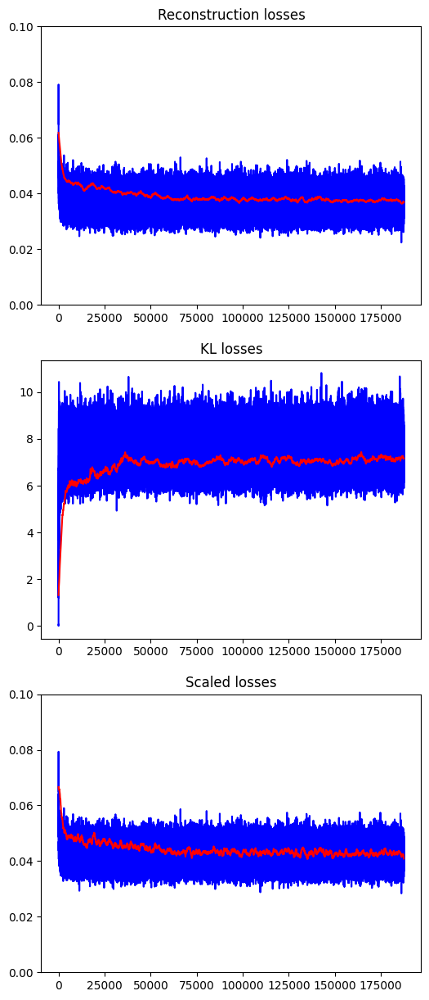

In [36]:
fig, axs = plt.subplots(3, 1, figsize = (6, 15))

train_losses_reconstruction_avg = [np.mean(train_losses_reconstruction[i:i+50]) for i in range(3750)] #CHANGE dEPENDING EPOCH, 100 --> 3750
axs[0].plot(np.arange(epochs * 1875), train_losses_reconstruction, color = 'b', label = 'mini-batches')
axs[0].plot(np.arange(0, epochs * 1875, 50), train_losses_reconstruction_avg, color = 'r', label = 'running average')
axs[0].set_ylim(0,0.1)
axs[0].set_title('Reconstruction losses')

train_losses_KL_avg = [np.mean(train_losses_KL[i:i+50]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[1].plot(np.arange(epochs * 1875), train_losses_KL, color = 'b', label = 'mini-batches')
axs[1].plot(np.arange(0, epochs * 1875, 50), train_losses_KL_avg, color = 'r', label = 'running average')
axs[1].set_title('KL losses')

train_losses_total_avg = [np.mean(train_losses_total[i:i+20]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[2].plot(np.arange(epochs * 1875), train_losses_total, color = 'b', label = 'mini-batches')
axs[2].plot(np.arange(0, epochs * 1875, 50), train_losses_total_avg, color = 'r', label = 'running average')
axs[2].set_ylim(0,0.1)
axs[2].set_title('Scaled losses')

plt.show()

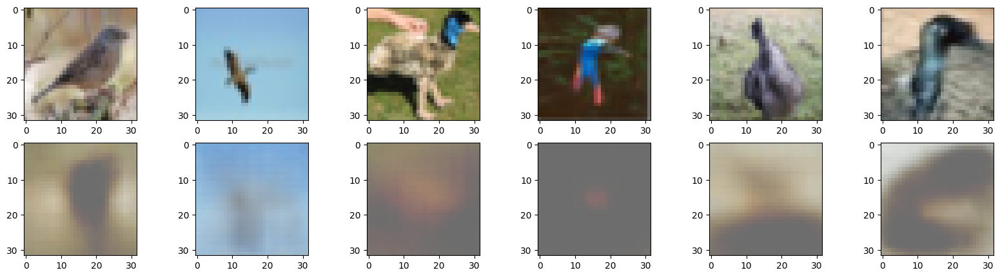

In [37]:
fig, axs = plt.subplots(2, 6, figsize = (20, 5))
for i in range(6):
    axs[0][i].imshow(X[i+10000,:,:,:].permute(1,2,0))
_, _, new_fig = model(X[10000:10006, :, :, :].to(device))
for i in range(6):
    axs[1][i].imshow(new_fig[i].permute(1,2,0).cpu().detach().numpy())

Text(0.5, 1.0, 'comparison between the latent spaces')

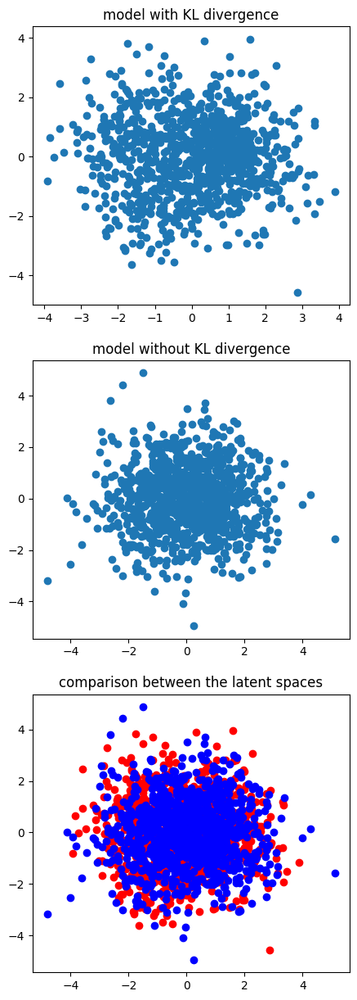

In [38]:
pca = PCA(n_components = 2)

_,_,latent_model1 = model.encode(X[:1000].to(device))
_,_,latent_model2 = model2.encode(X[:1000].to(device))
latent_model1 = latent_model1.cpu().detach().numpy()
latent_model2 = latent_model2.cpu().detach().numpy()

fig, axs = plt.subplots(3, figsize = (5, 15))
plot_X_1 = pca.fit_transform(latent_model1)
axs[0].scatter(plot_X_1[:,0], plot_X_1[:,1])
axs[0].set_title('model with KL divergence')
plot_X_2 = pca.fit_transform(latent_model2)
axs[1].scatter(plot_X_2[:, 0], plot_X_2[:, 1])
axs[1].set_title('model without KL divergence')

axs[2].scatter(plot_X_1[:,0], plot_X_1[:, 1], color = 'r')
axs[2].scatter(plot_X_2[:,0], plot_X_2[:, 1], color = 'b')
axs[2].set_title('comparison between the latent spaces')

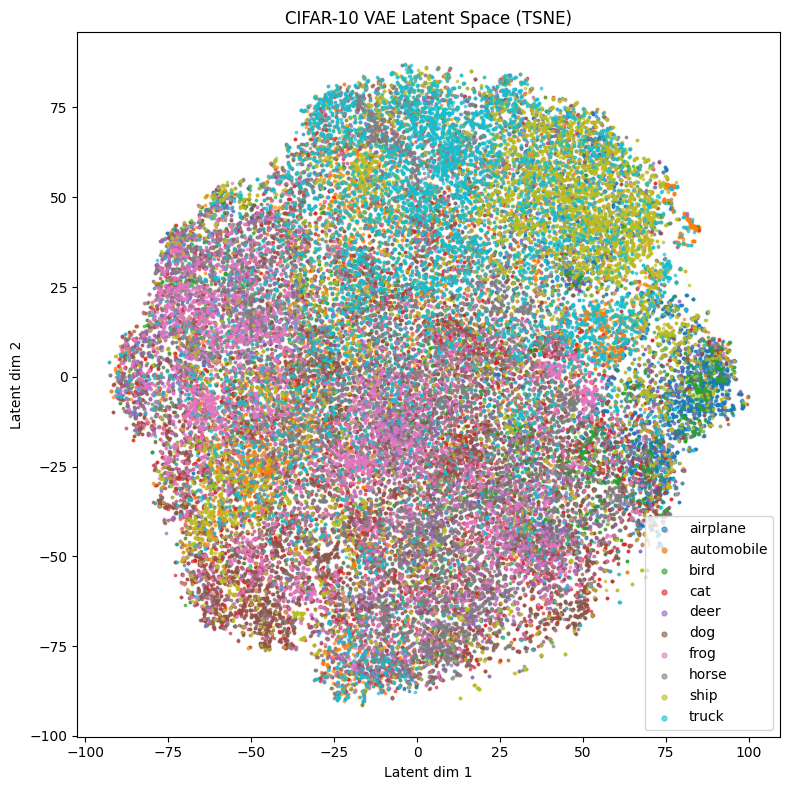

In [39]:
vae = model  # your trained VAE
vae.eval()

latents = []
batch_size = 256
device = next(vae.parameters()).device
labels = np.array(labels)
with torch.no_grad():
    for i in range(0, len(X), batch_size):
        batch = X[i:i+batch_size].to(device)
        mean, logvar, z = vae.encode(batch)
        latents.append(mean.cpu().numpy())
latents = np.concatenate(latents, axis=0)

# Step 3: t-SNE or PCA

reducer = TSNE(n_components=2, random_state=42,perplexity=30)
# reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (TSNE)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

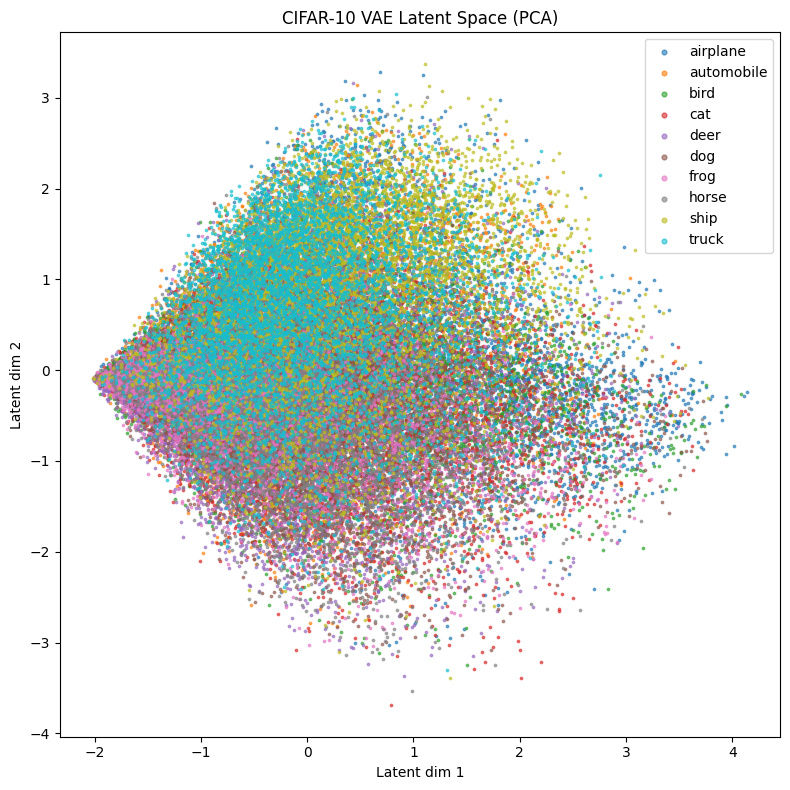

In [40]:
reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (PCA)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

** Beta-VAE with beta = 100

In [41]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
epochs = 100
beta = 100
KL_weight = beta*0.000075 # The KL divergence is much larger than MAE loss, scaling it down

train_losses_total, train_losses_total_avg = [], []
train_losses_reconstruction, train_losses_reconstruction_avg = [], []
train_losses_KL, train_losses_KL_avg = [], []
for epoch in range(epochs):
    train_loss_total = 0.0
    train_loss_reconstruction = 0.0
    train_loss_KL = 0.0
    for images in tqdm(image_loader):
        images = images.to(device)
        mean, var, outputs = model(images)

        optimizer.zero_grad()
        loss1 = criterion(outputs, images)
        loss2 = torch.mean(-0.5 * torch.sum(1 + var - mean**2 - torch.exp(var),axis=1),axis=0) # sum over latent dimension, not batch
        # -0.5 * torch.sum(1 + var - mean**2 - torch.exp(var), axis = 1).mean()
        # loss2 = torch.atan(loss2) / (np.pi / 2) # scaling it to [0,1]        
        loss = loss1  + KL_weight * loss2
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            train_losses_reconstruction.append(loss1.item())
            train_losses_KL.append(loss2.item())
            train_losses_total.append(loss.item())
            train_loss_reconstruction += loss1.item() * images.size(0)
            train_loss_KL += loss2.item() * images.size(0)
            train_loss_total += loss.item() * images.size(0)
    
    train_loss_total /= len(image_loader)
    train_loss_reconstruction /= len(image_loader)
    train_loss_KL /= len(image_loader)
    
    train_losses_total_avg.append(train_loss_total)
    train_losses_reconstruction_avg.append(train_loss_reconstruction)
    train_losses_KL_avg.append(train_loss_KL)
    
    print('-----------------------------------------------------')
    print(f'Epoch{epoch + 1}')
    print(f'Total loss = {train_loss_total:.3f}')
    print(f'Reconstruction loss = {train_loss_reconstruction:.3f}, KL = {train_loss_KL:.3f}')

    log = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict()
    }

    torch.save(log, f'model1_log_{epoch + 1}.pth')     

100%|██████████| 1875/1875 [00:05<00:00, 333.52it/s]


-----------------------------------------------------
Epoch1
Total loss = 1.811
Reconstruction loss = 1.607, KL = 27.254


100%|██████████| 1875/1875 [00:05<00:00, 355.26it/s]


-----------------------------------------------------
Epoch2
Total loss = 1.795
Reconstruction loss = 1.607, KL = 25.175


100%|██████████| 1875/1875 [00:05<00:00, 357.14it/s]


-----------------------------------------------------
Epoch3
Total loss = 1.793
Reconstruction loss = 1.605, KL = 25.167


100%|██████████| 1875/1875 [00:05<00:00, 355.90it/s]


-----------------------------------------------------
Epoch4
Total loss = 1.791
Reconstruction loss = 1.605, KL = 24.856


100%|██████████| 1875/1875 [00:05<00:00, 365.32it/s]


-----------------------------------------------------
Epoch5
Total loss = 1.791
Reconstruction loss = 1.604, KL = 24.880


100%|██████████| 1875/1875 [00:05<00:00, 363.90it/s]


-----------------------------------------------------
Epoch6
Total loss = 1.790
Reconstruction loss = 1.603, KL = 24.955


100%|██████████| 1875/1875 [00:05<00:00, 360.83it/s]


-----------------------------------------------------
Epoch7
Total loss = 1.791
Reconstruction loss = 1.604, KL = 24.894


100%|██████████| 1875/1875 [00:05<00:00, 354.20it/s]


-----------------------------------------------------
Epoch8
Total loss = 1.791
Reconstruction loss = 1.605, KL = 24.785


100%|██████████| 1875/1875 [00:05<00:00, 340.01it/s]


-----------------------------------------------------
Epoch9
Total loss = 1.790
Reconstruction loss = 1.604, KL = 24.777


100%|██████████| 1875/1875 [00:05<00:00, 354.61it/s]


-----------------------------------------------------
Epoch10
Total loss = 1.790
Reconstruction loss = 1.605, KL = 24.689


100%|██████████| 1875/1875 [00:05<00:00, 354.02it/s]


-----------------------------------------------------
Epoch11
Total loss = 1.791
Reconstruction loss = 1.603, KL = 25.012


100%|██████████| 1875/1875 [00:05<00:00, 360.50it/s]


-----------------------------------------------------
Epoch12
Total loss = 1.790
Reconstruction loss = 1.602, KL = 24.968


100%|██████████| 1875/1875 [00:05<00:00, 370.71it/s]


-----------------------------------------------------
Epoch13
Total loss = 1.790
Reconstruction loss = 1.602, KL = 24.988


100%|██████████| 1875/1875 [00:05<00:00, 364.48it/s]


-----------------------------------------------------
Epoch14
Total loss = 1.789
Reconstruction loss = 1.603, KL = 24.733


100%|██████████| 1875/1875 [00:05<00:00, 355.50it/s]


-----------------------------------------------------
Epoch15
Total loss = 1.788
Reconstruction loss = 1.605, KL = 24.454


100%|██████████| 1875/1875 [00:05<00:00, 351.90it/s]


-----------------------------------------------------
Epoch16
Total loss = 1.790
Reconstruction loss = 1.603, KL = 24.835


100%|██████████| 1875/1875 [00:05<00:00, 359.63it/s]


-----------------------------------------------------
Epoch17
Total loss = 1.790
Reconstruction loss = 1.604, KL = 24.726


100%|██████████| 1875/1875 [00:05<00:00, 359.06it/s]


-----------------------------------------------------
Epoch18
Total loss = 1.788
Reconstruction loss = 1.603, KL = 24.739


100%|██████████| 1875/1875 [00:05<00:00, 352.72it/s]


-----------------------------------------------------
Epoch19
Total loss = 1.789
Reconstruction loss = 1.604, KL = 24.676


100%|██████████| 1875/1875 [00:05<00:00, 358.41it/s]


-----------------------------------------------------
Epoch20
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.622


100%|██████████| 1875/1875 [00:05<00:00, 343.78it/s]


-----------------------------------------------------
Epoch21
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.651


100%|██████████| 1875/1875 [00:05<00:00, 355.77it/s]


-----------------------------------------------------
Epoch22
Total loss = 1.788
Reconstruction loss = 1.603, KL = 24.625


100%|██████████| 1875/1875 [00:05<00:00, 354.44it/s]


-----------------------------------------------------
Epoch23
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.420


100%|██████████| 1875/1875 [00:05<00:00, 358.89it/s]


-----------------------------------------------------
Epoch24
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.572


100%|██████████| 1875/1875 [00:05<00:00, 349.94it/s]


-----------------------------------------------------
Epoch25
Total loss = 1.787
Reconstruction loss = 1.602, KL = 24.638


100%|██████████| 1875/1875 [00:05<00:00, 360.53it/s]


-----------------------------------------------------
Epoch26
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.492


100%|██████████| 1875/1875 [00:05<00:00, 346.34it/s]


-----------------------------------------------------
Epoch27
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.504


100%|██████████| 1875/1875 [00:05<00:00, 361.97it/s]


-----------------------------------------------------
Epoch28
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.599


100%|██████████| 1875/1875 [00:05<00:00, 361.32it/s]


-----------------------------------------------------
Epoch29
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.452


100%|██████████| 1875/1875 [00:05<00:00, 356.71it/s]


-----------------------------------------------------
Epoch30
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.460


100%|██████████| 1875/1875 [00:05<00:00, 351.32it/s]


-----------------------------------------------------
Epoch31
Total loss = 1.786
Reconstruction loss = 1.602, KL = 24.562


100%|██████████| 1875/1875 [00:05<00:00, 355.46it/s]


-----------------------------------------------------
Epoch32
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.493


100%|██████████| 1875/1875 [00:05<00:00, 353.74it/s]


-----------------------------------------------------
Epoch33
Total loss = 1.788
Reconstruction loss = 1.603, KL = 24.553


100%|██████████| 1875/1875 [00:05<00:00, 355.88it/s]


-----------------------------------------------------
Epoch34
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.407


100%|██████████| 1875/1875 [00:05<00:00, 354.63it/s]


-----------------------------------------------------
Epoch35
Total loss = 1.787
Reconstruction loss = 1.605, KL = 24.295


100%|██████████| 1875/1875 [00:05<00:00, 360.11it/s]


-----------------------------------------------------
Epoch36
Total loss = 1.785
Reconstruction loss = 1.603, KL = 24.363


100%|██████████| 1875/1875 [00:05<00:00, 361.10it/s]


-----------------------------------------------------
Epoch37
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.431


100%|██████████| 1875/1875 [00:05<00:00, 352.67it/s]


-----------------------------------------------------
Epoch38
Total loss = 1.789
Reconstruction loss = 1.604, KL = 24.686


100%|██████████| 1875/1875 [00:05<00:00, 354.26it/s]


-----------------------------------------------------
Epoch39
Total loss = 1.787
Reconstruction loss = 1.602, KL = 24.665


100%|██████████| 1875/1875 [00:05<00:00, 360.43it/s]


-----------------------------------------------------
Epoch40
Total loss = 1.786
Reconstruction loss = 1.604, KL = 24.362


100%|██████████| 1875/1875 [00:05<00:00, 357.87it/s]


-----------------------------------------------------
Epoch41
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.422


100%|██████████| 1875/1875 [00:05<00:00, 356.09it/s]


-----------------------------------------------------
Epoch42
Total loss = 1.786
Reconstruction loss = 1.602, KL = 24.497


100%|██████████| 1875/1875 [00:05<00:00, 341.09it/s]


-----------------------------------------------------
Epoch43
Total loss = 1.789
Reconstruction loss = 1.604, KL = 24.578


100%|██████████| 1875/1875 [00:05<00:00, 358.52it/s]


-----------------------------------------------------
Epoch44
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.447


100%|██████████| 1875/1875 [00:05<00:00, 354.97it/s]


-----------------------------------------------------
Epoch45
Total loss = 1.788
Reconstruction loss = 1.603, KL = 24.710


100%|██████████| 1875/1875 [00:05<00:00, 319.33it/s]


-----------------------------------------------------
Epoch46
Total loss = 1.788
Reconstruction loss = 1.603, KL = 24.593


100%|██████████| 1875/1875 [00:06<00:00, 286.37it/s]


-----------------------------------------------------
Epoch47
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.512


100%|██████████| 1875/1875 [00:06<00:00, 283.95it/s]


-----------------------------------------------------
Epoch48
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.469


100%|██████████| 1875/1875 [00:05<00:00, 342.49it/s]


-----------------------------------------------------
Epoch49
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.472


100%|██████████| 1875/1875 [00:05<00:00, 358.99it/s]


-----------------------------------------------------
Epoch50
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.385


100%|██████████| 1875/1875 [00:05<00:00, 354.38it/s]


-----------------------------------------------------
Epoch51
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.434


100%|██████████| 1875/1875 [00:05<00:00, 357.40it/s]


-----------------------------------------------------
Epoch52
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.480


100%|██████████| 1875/1875 [00:05<00:00, 356.36it/s]


-----------------------------------------------------
Epoch53
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.461


100%|██████████| 1875/1875 [00:05<00:00, 319.22it/s]


-----------------------------------------------------
Epoch54
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.451


100%|██████████| 1875/1875 [00:06<00:00, 291.40it/s]


-----------------------------------------------------
Epoch55
Total loss = 1.784
Reconstruction loss = 1.602, KL = 24.273


100%|██████████| 1875/1875 [00:06<00:00, 289.64it/s]


-----------------------------------------------------
Epoch56
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.431


100%|██████████| 1875/1875 [00:05<00:00, 321.31it/s]


-----------------------------------------------------
Epoch57
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.560


100%|██████████| 1875/1875 [00:05<00:00, 365.38it/s]


-----------------------------------------------------
Epoch58
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.564


100%|██████████| 1875/1875 [00:05<00:00, 373.19it/s]


-----------------------------------------------------
Epoch59
Total loss = 1.784
Reconstruction loss = 1.602, KL = 24.336


100%|██████████| 1875/1875 [00:05<00:00, 359.79it/s]


-----------------------------------------------------
Epoch60
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.393


100%|██████████| 1875/1875 [00:05<00:00, 356.15it/s]


-----------------------------------------------------
Epoch61
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.491


100%|██████████| 1875/1875 [00:05<00:00, 354.86it/s]


-----------------------------------------------------
Epoch62
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.542


100%|██████████| 1875/1875 [00:05<00:00, 357.02it/s]


-----------------------------------------------------
Epoch63
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.485


100%|██████████| 1875/1875 [00:05<00:00, 356.41it/s]


-----------------------------------------------------
Epoch64
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.434


100%|██████████| 1875/1875 [00:05<00:00, 341.41it/s]


-----------------------------------------------------
Epoch65
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.531


100%|██████████| 1875/1875 [00:05<00:00, 360.20it/s]


-----------------------------------------------------
Epoch66
Total loss = 1.787
Reconstruction loss = 1.605, KL = 24.366


100%|██████████| 1875/1875 [00:05<00:00, 351.62it/s]


-----------------------------------------------------
Epoch67
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.373


100%|██████████| 1875/1875 [00:05<00:00, 356.08it/s]


-----------------------------------------------------
Epoch68
Total loss = 1.786
Reconstruction loss = 1.604, KL = 24.326


100%|██████████| 1875/1875 [00:05<00:00, 361.42it/s]


-----------------------------------------------------
Epoch69
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.356


100%|██████████| 1875/1875 [00:05<00:00, 361.70it/s]


-----------------------------------------------------
Epoch70
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.321


100%|██████████| 1875/1875 [00:05<00:00, 352.72it/s]


-----------------------------------------------------
Epoch71
Total loss = 1.785
Reconstruction loss = 1.603, KL = 24.330


100%|██████████| 1875/1875 [00:05<00:00, 347.39it/s]


-----------------------------------------------------
Epoch72
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.469


100%|██████████| 1875/1875 [00:05<00:00, 362.73it/s]


-----------------------------------------------------
Epoch73
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.605


100%|██████████| 1875/1875 [00:05<00:00, 368.79it/s]


-----------------------------------------------------
Epoch74
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.401


100%|██████████| 1875/1875 [00:05<00:00, 359.71it/s]


-----------------------------------------------------
Epoch75
Total loss = 1.785
Reconstruction loss = 1.604, KL = 24.197


100%|██████████| 1875/1875 [00:05<00:00, 333.20it/s]


-----------------------------------------------------
Epoch76
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.418


100%|██████████| 1875/1875 [00:04<00:00, 379.39it/s]


-----------------------------------------------------
Epoch77
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.477


100%|██████████| 1875/1875 [00:05<00:00, 362.44it/s]


-----------------------------------------------------
Epoch78
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.462


100%|██████████| 1875/1875 [00:05<00:00, 361.46it/s]


-----------------------------------------------------
Epoch79
Total loss = 1.789
Reconstruction loss = 1.604, KL = 24.630


100%|██████████| 1875/1875 [00:05<00:00, 353.35it/s]


-----------------------------------------------------
Epoch80
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.545


100%|██████████| 1875/1875 [00:05<00:00, 351.65it/s]


-----------------------------------------------------
Epoch81
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.480


100%|██████████| 1875/1875 [00:05<00:00, 363.65it/s]


-----------------------------------------------------
Epoch82
Total loss = 1.787
Reconstruction loss = 1.602, KL = 24.705


100%|██████████| 1875/1875 [00:05<00:00, 372.37it/s]


-----------------------------------------------------
Epoch83
Total loss = 1.788
Reconstruction loss = 1.604, KL = 24.466


100%|██████████| 1875/1875 [00:05<00:00, 349.33it/s]


-----------------------------------------------------
Epoch84
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.468


100%|██████████| 1875/1875 [00:05<00:00, 349.32it/s]


-----------------------------------------------------
Epoch85
Total loss = 1.788
Reconstruction loss = 1.603, KL = 24.623


100%|██████████| 1875/1875 [00:05<00:00, 363.33it/s]


-----------------------------------------------------
Epoch86
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.525


100%|██████████| 1875/1875 [00:05<00:00, 362.68it/s]


-----------------------------------------------------
Epoch87
Total loss = 1.785
Reconstruction loss = 1.602, KL = 24.457


100%|██████████| 1875/1875 [00:05<00:00, 337.98it/s]


-----------------------------------------------------
Epoch88
Total loss = 1.787
Reconstruction loss = 1.602, KL = 24.682


100%|██████████| 1875/1875 [00:05<00:00, 361.24it/s]


-----------------------------------------------------
Epoch89
Total loss = 1.786
Reconstruction loss = 1.603, KL = 24.422


100%|██████████| 1875/1875 [00:05<00:00, 363.51it/s]


-----------------------------------------------------
Epoch90
Total loss = 1.785
Reconstruction loss = 1.602, KL = 24.409


100%|██████████| 1875/1875 [00:05<00:00, 358.95it/s]


-----------------------------------------------------
Epoch91
Total loss = 1.785
Reconstruction loss = 1.603, KL = 24.286


100%|██████████| 1875/1875 [00:05<00:00, 372.98it/s]


-----------------------------------------------------
Epoch92
Total loss = 1.789
Reconstruction loss = 1.604, KL = 24.717


100%|██████████| 1875/1875 [00:05<00:00, 363.31it/s]


-----------------------------------------------------
Epoch93
Total loss = 1.786
Reconstruction loss = 1.602, KL = 24.479


100%|██████████| 1875/1875 [00:05<00:00, 354.18it/s]


-----------------------------------------------------
Epoch94
Total loss = 1.786
Reconstruction loss = 1.602, KL = 24.505


100%|██████████| 1875/1875 [00:04<00:00, 379.78it/s]


-----------------------------------------------------
Epoch95
Total loss = 1.787
Reconstruction loss = 1.602, KL = 24.656


100%|██████████| 1875/1875 [00:05<00:00, 365.74it/s]


-----------------------------------------------------
Epoch96
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.523


100%|██████████| 1875/1875 [00:05<00:00, 351.12it/s]


-----------------------------------------------------
Epoch97
Total loss = 1.785
Reconstruction loss = 1.602, KL = 24.359


100%|██████████| 1875/1875 [00:05<00:00, 368.83it/s]


-----------------------------------------------------
Epoch98
Total loss = 1.787
Reconstruction loss = 1.603, KL = 24.544


100%|██████████| 1875/1875 [00:05<00:00, 366.06it/s]


-----------------------------------------------------
Epoch99
Total loss = 1.786
Reconstruction loss = 1.602, KL = 24.453


100%|██████████| 1875/1875 [00:05<00:00, 340.51it/s]

-----------------------------------------------------
Epoch100
Total loss = 1.787
Reconstruction loss = 1.604, KL = 24.443


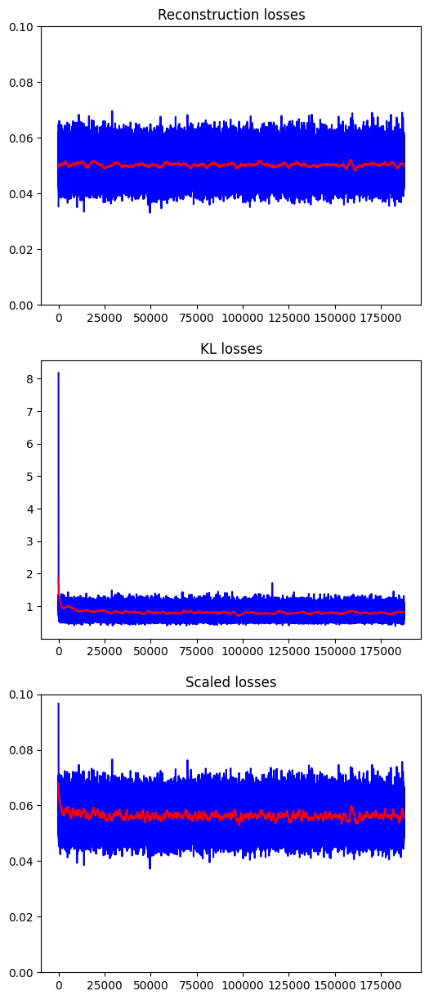

In [42]:
fig, axs = plt.subplots(3, 1, figsize = (6, 15))

train_losses_reconstruction_avg = [np.mean(train_losses_reconstruction[i:i+50]) for i in range(3750)] #CHANGE dEPENDING EPOCH, 100 --> 3750
axs[0].plot(np.arange(epochs * 1875), train_losses_reconstruction, color = 'b', label = 'mini-batches')
axs[0].plot(np.arange(0, epochs * 1875, 50), train_losses_reconstruction_avg, color = 'r', label = 'running average')
axs[0].set_ylim(0,0.1)
axs[0].set_title('Reconstruction losses')

train_losses_KL_avg = [np.mean(train_losses_KL[i:i+50]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[1].plot(np.arange(epochs * 1875), train_losses_KL, color = 'b', label = 'mini-batches')
axs[1].plot(np.arange(0, epochs * 1875, 50), train_losses_KL_avg, color = 'r', label = 'running average')
axs[1].set_title('KL losses')

train_losses_total_avg = [np.mean(train_losses_total[i:i+20]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[2].plot(np.arange(epochs * 1875), train_losses_total, color = 'b', label = 'mini-batches')
axs[2].plot(np.arange(0, epochs * 1875, 50), train_losses_total_avg, color = 'r', label = 'running average')
axs[2].set_ylim(0,0.1)
axs[2].set_title('Scaled losses')

plt.show()

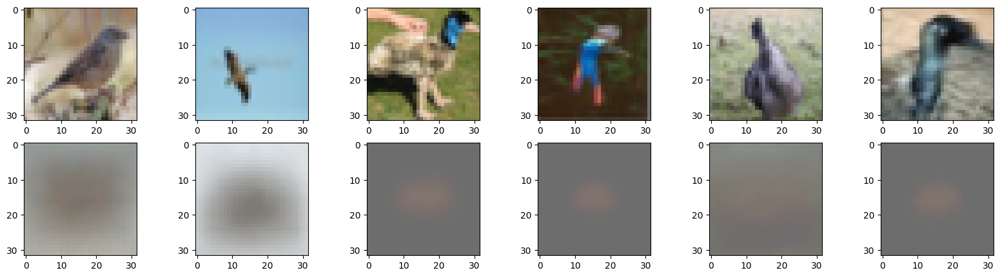

In [43]:
fig, axs = plt.subplots(2, 6, figsize = (20, 5))
for i in range(6):
    axs[0][i].imshow(X[i+10000,:,:,:].permute(1,2,0))
_, _, new_fig = model(X[10000:10006, :, :, :].to(device))
for i in range(6):
    axs[1][i].imshow(new_fig[i].permute(1,2,0).cpu().detach().numpy())

Text(0.5, 1.0, 'comparison between the latent spaces')

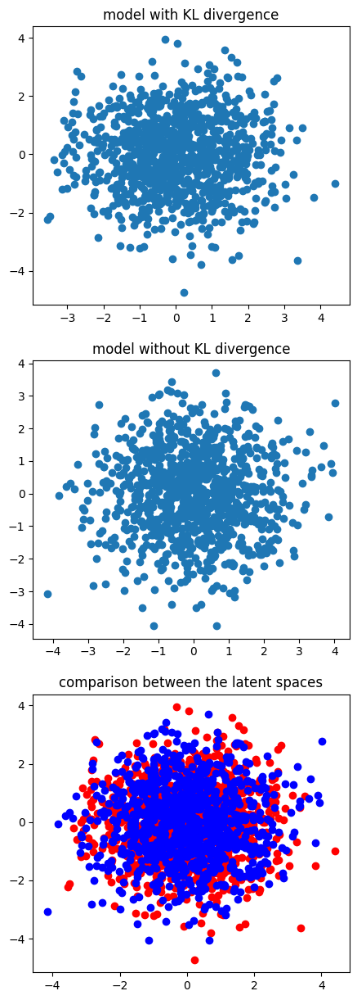

In [44]:
pca = PCA(n_components = 2)

_,_,latent_model1 = model.encode(X[:1000].to(device))
_,_,latent_model2 = model2.encode(X[:1000].to(device))
latent_model1 = latent_model1.cpu().detach().numpy()
latent_model2 = latent_model2.cpu().detach().numpy()

fig, axs = plt.subplots(3, figsize = (5, 15))
plot_X_1 = pca.fit_transform(latent_model1)
axs[0].scatter(plot_X_1[:,0], plot_X_1[:,1])
axs[0].set_title('model with KL divergence')
plot_X_2 = pca.fit_transform(latent_model2)
axs[1].scatter(plot_X_2[:, 0], plot_X_2[:, 1])
axs[1].set_title('model without KL divergence')

axs[2].scatter(plot_X_1[:,0], plot_X_1[:, 1], color = 'r')
axs[2].scatter(plot_X_2[:,0], plot_X_2[:, 1], color = 'b')
axs[2].set_title('comparison between the latent spaces')

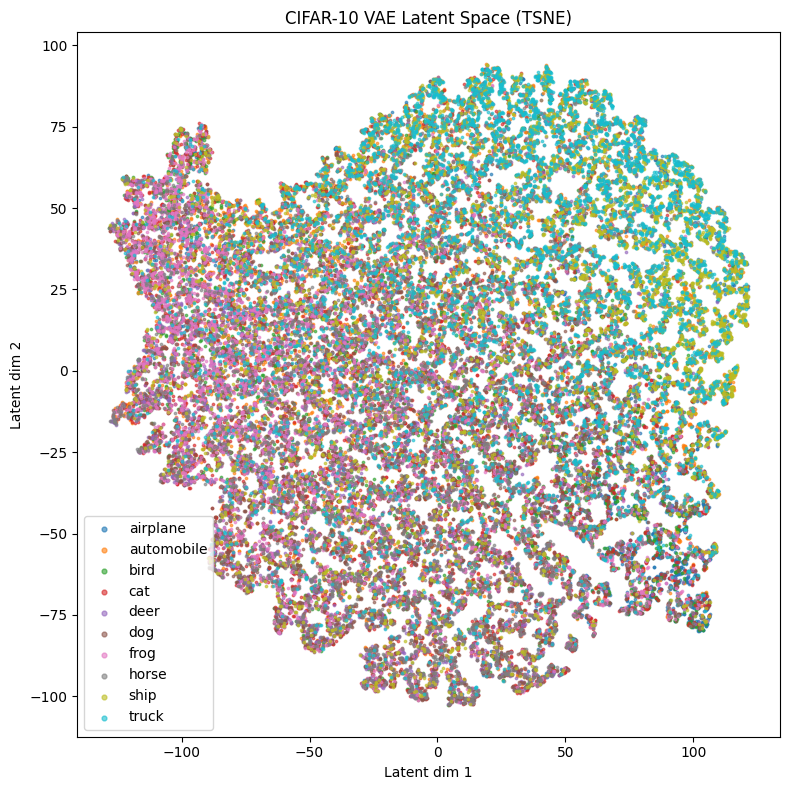

In [45]:
vae = model  # your trained VAE
vae.eval()

latents = []
batch_size = 256
device = next(vae.parameters()).device
labels = np.array(labels)
with torch.no_grad():
    for i in range(0, len(X), batch_size):
        batch = X[i:i+batch_size].to(device)
        mean, logvar, z = vae.encode(batch)
        latents.append(mean.cpu().numpy())
latents = np.concatenate(latents, axis=0)

# Step 3: t-SNE or PCA

reducer = TSNE(n_components=2, random_state=42,perplexity=30)
# reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (TSNE)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

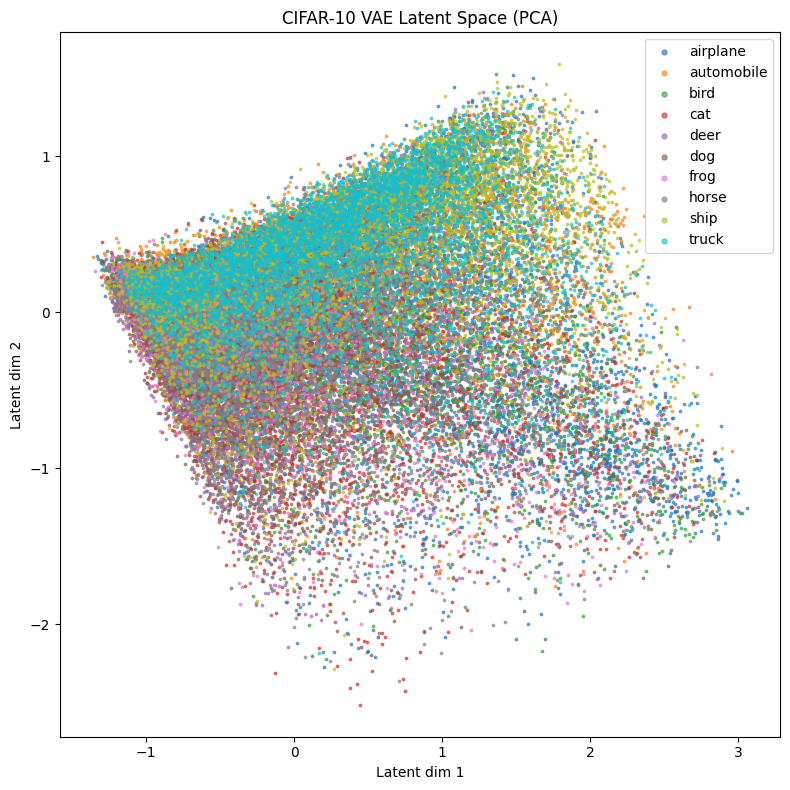

In [46]:
reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (PCA)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

** Beta-VAE with beta = 0

In [62]:
class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args
        
    def forward(self, x):
        return x.view(self.shape)
    
class Trim(nn.Module):
    def __init__(self):
        super(Trim, self).__init__()
    
    def forward(self, x):
        return x[:, :, :32, :32]
    
class VAE(nn.Module):
    def __init__(self):
        
        # [(W−K+2P)/S]+1
        super(VAE, self).__init__()
        # Unfortunately, we cannot have maxunpool2d in nn.Sequential, so we have to write them out

        self.conv1 = nn.Conv2d(3, 32, 3, stride = 2, padding = 1)
        self.conv2 = nn.Conv2d(32, 64, 3, stride = 2, padding = 1)
        self.conv3 = nn.Conv2d(64, 128, 3, stride = 2, padding = 1)
        self.flatten = nn.Flatten()
        
        self.linear_mean = nn.Linear(2048, 100)
        self.linear_logvar = nn.Linear(2048, 100)

        self.linear = nn.Linear(100, 2048)
        self.reshape = Reshape(-1, 128, 4, 4)
        self.deconv1 = nn.ConvTranspose2d(128, 64, 3, stride = 2, padding=0)
        self.deconv2 = nn.ConvTranspose2d(64, 32, 3, stride = 2, padding=1)
        self.deconv3 = nn.ConvTranspose2d(32, 3, 3, stride = 2, padding=1)
        self.trim = Trim()
    
    def reparameterized(self, mean, var):
        eps = torch.randn(mean.size(0), mean.size(1)).to(device)
        z = mean + eps * torch.exp(var / 2.)
        return z

    def encode(self, x): # Using silu instead of relu here
        x = F.silu(self.conv1(x))
        x = F.silu(self.conv2(x))
        x = self.conv3(x)
        x = self.flatten(x)
        mean = self.linear_mean(x)
        var = self.linear_logvar(x)
        z = self.reparameterized(mean, var)
        return mean, var, z

    def decode(self, z):
        z = self.linear(z)
        z = self.reshape(z)
        z = F.silu(self.deconv1(z))
        z = F.silu(self.deconv2(z))
        z = F.silu(self.deconv3(z))
        z = self.trim(z)
        z = F.sigmoid(z)
        return z
    
    def forward(self, x):
        mean, var, z = self.encode(x)
        z = self.decode(z)
        return mean, var, z

model = VAE().to(device)
model2 = VAE().to(device)
# print(X.shape)

x = torch.randn(1, 3, 32, 32).to(device)
model(x)
summary(model, (3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 16, 16]             896
            Conv2d-2             [-1, 64, 8, 8]          18,496
            Conv2d-3            [-1, 128, 4, 4]          73,856
           Flatten-4                 [-1, 2048]               0
            Linear-5                  [-1, 100]         204,900
            Linear-6                  [-1, 100]         204,900
            Linear-7                 [-1, 2048]         206,848
           Reshape-8            [-1, 128, 4, 4]               0
   ConvTranspose2d-9             [-1, 64, 9, 9]          73,792
  ConvTranspose2d-10           [-1, 32, 17, 17]          18,464
  ConvTranspose2d-11            [-1, 3, 33, 33]             867
             Trim-12            [-1, 3, 32, 32]               0
Total params: 803,019
Trainable params: 803,019
Non-trainable params: 0
-------------------------------

In [64]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
epochs = 100
beta = 0
KL_weight = beta*0.000075 # The KL divergence is much larger than MAE loss, scaling it down

train_losses_total, train_losses_total_avg = [], []
train_losses_reconstruction, train_losses_reconstruction_avg = [], []
train_losses_KL, train_losses_KL_avg = [], []
for epoch in range(epochs):
    train_loss_total = 0.0
    train_loss_reconstruction = 0.0
    train_loss_KL = 0.0
    for images in tqdm(image_loader):
        images = images.to(device)
        mean, var, outputs = model(images)

        optimizer.zero_grad()
        loss1 = criterion(outputs, images)
        loss2 = torch.mean(-0.5 * torch.sum(1 + var - mean**2 - torch.exp(var),axis=1),axis=0) # sum over latent dimension, not batch
        # -0.5 * torch.sum(1 + var - mean**2 - torch.exp(var), axis = 1).mean()
        # loss2 = torch.atan(loss2) / (np.pi / 2) # scaling it to [0,1]        
        loss = loss1  + KL_weight * loss2
        loss.backward()
        optimizer.step()
        with torch.no_grad():
            train_losses_reconstruction.append(loss1.item())
            train_losses_KL.append(loss2.item())
            train_losses_total.append(loss.item())
            train_loss_reconstruction += loss1.item() * images.size(0)
            train_loss_KL += loss2.item() * images.size(0)
            train_loss_total += loss.item() * images.size(0)
    
    train_loss_total /= len(image_loader)
    train_loss_reconstruction /= len(image_loader)
    train_loss_KL /= len(image_loader)
    
    train_losses_total_avg.append(train_loss_total)
    train_losses_reconstruction_avg.append(train_loss_reconstruction)
    train_losses_KL_avg.append(train_loss_KL)
    
    print('-----------------------------------------------------')
    print(f'Epoch{epoch + 1}')
    print(f'Total loss = {train_loss_total:.3f}')
    print(f'Reconstruction loss = {train_loss_reconstruction:.3f}, KL = {train_loss_KL:.3f}')

    log = {
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict()
    }

    torch.save(log, f'model1_log_{epoch + 1}.pth')     

100%|██████████| 1875/1875 [00:05<00:00, 321.35it/s]


-----------------------------------------------------
Epoch1
Total loss = 0.844
Reconstruction loss = 0.844, KL = 11557.811


100%|██████████| 1875/1875 [00:05<00:00, 356.50it/s]


-----------------------------------------------------
Epoch2
Total loss = 0.785
Reconstruction loss = 0.785, KL = 14496.957


100%|██████████| 1875/1875 [00:05<00:00, 342.95it/s]


-----------------------------------------------------
Epoch3
Total loss = 0.780
Reconstruction loss = 0.780, KL = 15230.190


100%|██████████| 1875/1875 [00:05<00:00, 350.96it/s]


-----------------------------------------------------
Epoch4
Total loss = 0.778
Reconstruction loss = 0.778, KL = 15718.497


100%|██████████| 1875/1875 [00:05<00:00, 342.07it/s]


-----------------------------------------------------
Epoch5
Total loss = 0.777
Reconstruction loss = 0.777, KL = 15935.733


100%|██████████| 1875/1875 [00:05<00:00, 346.42it/s]


-----------------------------------------------------
Epoch6
Total loss = 0.776
Reconstruction loss = 0.776, KL = 16237.063


100%|██████████| 1875/1875 [00:05<00:00, 343.43it/s]


-----------------------------------------------------
Epoch7
Total loss = 0.775
Reconstruction loss = 0.775, KL = 16469.951


100%|██████████| 1875/1875 [00:05<00:00, 356.24it/s]


-----------------------------------------------------
Epoch8
Total loss = 0.774
Reconstruction loss = 0.774, KL = 16588.936


100%|██████████| 1875/1875 [00:05<00:00, 353.23it/s]


-----------------------------------------------------
Epoch9
Total loss = 0.773
Reconstruction loss = 0.773, KL = 16828.813


100%|██████████| 1875/1875 [00:05<00:00, 322.63it/s]


-----------------------------------------------------
Epoch10
Total loss = 0.772
Reconstruction loss = 0.772, KL = 16990.758


100%|██████████| 1875/1875 [00:05<00:00, 346.14it/s]


-----------------------------------------------------
Epoch11
Total loss = 0.772
Reconstruction loss = 0.772, KL = 17162.279


100%|██████████| 1875/1875 [00:05<00:00, 347.44it/s]


-----------------------------------------------------
Epoch12
Total loss = 0.771
Reconstruction loss = 0.771, KL = 17235.409


100%|██████████| 1875/1875 [00:05<00:00, 342.77it/s]


-----------------------------------------------------
Epoch13
Total loss = 0.771
Reconstruction loss = 0.771, KL = 17509.877


100%|██████████| 1875/1875 [00:05<00:00, 346.28it/s]


-----------------------------------------------------
Epoch14
Total loss = 0.771
Reconstruction loss = 0.771, KL = 17651.772


100%|██████████| 1875/1875 [00:05<00:00, 336.44it/s]


-----------------------------------------------------
Epoch15
Total loss = 0.770
Reconstruction loss = 0.770, KL = 17811.673


100%|██████████| 1875/1875 [00:05<00:00, 329.75it/s]


-----------------------------------------------------
Epoch16
Total loss = 0.770
Reconstruction loss = 0.770, KL = 17962.367


100%|██████████| 1875/1875 [00:05<00:00, 354.25it/s]


-----------------------------------------------------
Epoch17
Total loss = 0.770
Reconstruction loss = 0.770, KL = 18094.427


100%|██████████| 1875/1875 [00:05<00:00, 359.08it/s]


-----------------------------------------------------
Epoch18
Total loss = 0.769
Reconstruction loss = 0.769, KL = 18290.334


100%|██████████| 1875/1875 [00:05<00:00, 325.19it/s]


-----------------------------------------------------
Epoch19
Total loss = 0.769
Reconstruction loss = 0.769, KL = 18400.665


100%|██████████| 1875/1875 [00:05<00:00, 345.77it/s]


-----------------------------------------------------
Epoch20
Total loss = 0.769
Reconstruction loss = 0.769, KL = 18474.535


100%|██████████| 1875/1875 [00:05<00:00, 350.83it/s]


-----------------------------------------------------
Epoch21
Total loss = 0.768
Reconstruction loss = 0.768, KL = 18650.510


100%|██████████| 1875/1875 [00:05<00:00, 337.08it/s]


-----------------------------------------------------
Epoch22
Total loss = 0.768
Reconstruction loss = 0.768, KL = 18766.884


100%|██████████| 1875/1875 [00:05<00:00, 334.41it/s]


-----------------------------------------------------
Epoch23
Total loss = 0.768
Reconstruction loss = 0.768, KL = 18893.706


100%|██████████| 1875/1875 [00:05<00:00, 339.71it/s]


-----------------------------------------------------
Epoch24
Total loss = 0.768
Reconstruction loss = 0.768, KL = 18981.258


100%|██████████| 1875/1875 [00:05<00:00, 344.23it/s]


-----------------------------------------------------
Epoch25
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19157.140


100%|██████████| 1875/1875 [00:05<00:00, 345.89it/s]


-----------------------------------------------------
Epoch26
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19261.598


100%|██████████| 1875/1875 [00:05<00:00, 333.83it/s]


-----------------------------------------------------
Epoch27
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19325.256


100%|██████████| 1875/1875 [00:05<00:00, 347.10it/s]


-----------------------------------------------------
Epoch28
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19470.654


100%|██████████| 1875/1875 [00:05<00:00, 352.95it/s]


-----------------------------------------------------
Epoch29
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19668.518


100%|██████████| 1875/1875 [00:05<00:00, 323.94it/s]


-----------------------------------------------------
Epoch30
Total loss = 0.767
Reconstruction loss = 0.767, KL = 19744.993


100%|██████████| 1875/1875 [00:05<00:00, 336.12it/s]


-----------------------------------------------------
Epoch31
Total loss = 0.766
Reconstruction loss = 0.766, KL = 19828.845


100%|██████████| 1875/1875 [00:05<00:00, 344.34it/s]


-----------------------------------------------------
Epoch32
Total loss = 0.766
Reconstruction loss = 0.766, KL = 19990.757


100%|██████████| 1875/1875 [00:05<00:00, 338.66it/s]


-----------------------------------------------------
Epoch33
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20144.206


100%|██████████| 1875/1875 [00:05<00:00, 352.94it/s]


-----------------------------------------------------
Epoch34
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20236.208


100%|██████████| 1875/1875 [00:05<00:00, 342.06it/s]


-----------------------------------------------------
Epoch35
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20423.454


100%|██████████| 1875/1875 [00:05<00:00, 340.31it/s]


-----------------------------------------------------
Epoch36
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20500.015


100%|██████████| 1875/1875 [00:05<00:00, 357.99it/s]


-----------------------------------------------------
Epoch37
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20521.226


100%|██████████| 1875/1875 [00:05<00:00, 358.99it/s]


-----------------------------------------------------
Epoch38
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20695.469


100%|██████████| 1875/1875 [00:05<00:00, 320.32it/s]


-----------------------------------------------------
Epoch39
Total loss = 0.766
Reconstruction loss = 0.766, KL = 20691.161


100%|██████████| 1875/1875 [00:05<00:00, 335.26it/s]


-----------------------------------------------------
Epoch40
Total loss = 0.765
Reconstruction loss = 0.765, KL = 20954.027


100%|██████████| 1875/1875 [00:05<00:00, 349.09it/s]


-----------------------------------------------------
Epoch41
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21019.827


100%|██████████| 1875/1875 [00:05<00:00, 345.89it/s]


-----------------------------------------------------
Epoch42
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21125.928


100%|██████████| 1875/1875 [00:05<00:00, 346.68it/s]


-----------------------------------------------------
Epoch43
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21236.181


100%|██████████| 1875/1875 [00:05<00:00, 347.38it/s]


-----------------------------------------------------
Epoch44
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21295.356


100%|██████████| 1875/1875 [00:05<00:00, 322.66it/s]


-----------------------------------------------------
Epoch45
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21515.170


100%|██████████| 1875/1875 [00:06<00:00, 304.78it/s]


-----------------------------------------------------
Epoch46
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21543.597


100%|██████████| 1875/1875 [00:05<00:00, 337.88it/s]


-----------------------------------------------------
Epoch47
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21637.299


100%|██████████| 1875/1875 [00:05<00:00, 351.26it/s]


-----------------------------------------------------
Epoch48
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21873.605


100%|██████████| 1875/1875 [00:05<00:00, 351.14it/s]


-----------------------------------------------------
Epoch49
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21837.479


100%|██████████| 1875/1875 [00:05<00:00, 345.87it/s]


-----------------------------------------------------
Epoch50
Total loss = 0.765
Reconstruction loss = 0.765, KL = 21960.541


100%|██████████| 1875/1875 [00:05<00:00, 344.42it/s]


-----------------------------------------------------
Epoch51
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22246.974


100%|██████████| 1875/1875 [00:05<00:00, 345.30it/s]


-----------------------------------------------------
Epoch52
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22205.334


100%|██████████| 1875/1875 [00:05<00:00, 351.58it/s]


-----------------------------------------------------
Epoch53
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22520.996


100%|██████████| 1875/1875 [00:05<00:00, 348.62it/s]


-----------------------------------------------------
Epoch54
Total loss = 0.765
Reconstruction loss = 0.765, KL = 22609.465


100%|██████████| 1875/1875 [00:05<00:00, 353.76it/s]


-----------------------------------------------------
Epoch55
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22703.062


100%|██████████| 1875/1875 [00:05<00:00, 318.70it/s]


-----------------------------------------------------
Epoch56
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22751.381


100%|██████████| 1875/1875 [00:05<00:00, 340.62it/s]


-----------------------------------------------------
Epoch57
Total loss = 0.764
Reconstruction loss = 0.764, KL = 22851.780


100%|██████████| 1875/1875 [00:05<00:00, 351.84it/s]


-----------------------------------------------------
Epoch58
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23070.844


100%|██████████| 1875/1875 [00:05<00:00, 338.45it/s]


-----------------------------------------------------
Epoch59
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23181.345


100%|██████████| 1875/1875 [00:05<00:00, 351.46it/s]


-----------------------------------------------------
Epoch60
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23403.327


100%|██████████| 1875/1875 [00:05<00:00, 349.81it/s]


-----------------------------------------------------
Epoch61
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23365.217


100%|██████████| 1875/1875 [00:05<00:00, 344.17it/s]


-----------------------------------------------------
Epoch62
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23631.985


100%|██████████| 1875/1875 [00:05<00:00, 347.75it/s]


-----------------------------------------------------
Epoch63
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23419.416


100%|██████████| 1875/1875 [00:05<00:00, 346.72it/s]


-----------------------------------------------------
Epoch64
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23641.684


100%|██████████| 1875/1875 [00:05<00:00, 332.02it/s]


-----------------------------------------------------
Epoch65
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23662.258


100%|██████████| 1875/1875 [00:05<00:00, 344.14it/s]


-----------------------------------------------------
Epoch66
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23766.650


100%|██████████| 1875/1875 [00:05<00:00, 329.16it/s]


-----------------------------------------------------
Epoch67
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23885.552


100%|██████████| 1875/1875 [00:05<00:00, 313.88it/s]


-----------------------------------------------------
Epoch68
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24027.641


100%|██████████| 1875/1875 [00:05<00:00, 344.46it/s]


-----------------------------------------------------
Epoch69
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23986.509


100%|██████████| 1875/1875 [00:05<00:00, 352.59it/s]


-----------------------------------------------------
Epoch70
Total loss = 0.764
Reconstruction loss = 0.764, KL = 23946.180


100%|██████████| 1875/1875 [00:05<00:00, 320.95it/s]


-----------------------------------------------------
Epoch71
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24228.627


100%|██████████| 1875/1875 [00:05<00:00, 333.80it/s]


-----------------------------------------------------
Epoch72
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24191.961


100%|██████████| 1875/1875 [00:05<00:00, 353.88it/s]


-----------------------------------------------------
Epoch73
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24203.203


100%|██████████| 1875/1875 [00:05<00:00, 341.92it/s]


-----------------------------------------------------
Epoch74
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24319.375


100%|██████████| 1875/1875 [00:05<00:00, 352.45it/s]


-----------------------------------------------------
Epoch75
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24537.349


100%|██████████| 1875/1875 [00:05<00:00, 339.83it/s]


-----------------------------------------------------
Epoch76
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24458.531


100%|██████████| 1875/1875 [00:05<00:00, 344.77it/s]


-----------------------------------------------------
Epoch77
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24427.293


100%|██████████| 1875/1875 [00:05<00:00, 339.85it/s]


-----------------------------------------------------
Epoch78
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24611.242


100%|██████████| 1875/1875 [00:05<00:00, 333.96it/s]


-----------------------------------------------------
Epoch79
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24424.846


100%|██████████| 1875/1875 [00:05<00:00, 335.10it/s]


-----------------------------------------------------
Epoch80
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24543.001


100%|██████████| 1875/1875 [00:05<00:00, 349.56it/s]


-----------------------------------------------------
Epoch81
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24622.938


100%|██████████| 1875/1875 [00:05<00:00, 348.23it/s]


-----------------------------------------------------
Epoch82
Total loss = 0.764
Reconstruction loss = 0.764, KL = 25055.211


100%|██████████| 1875/1875 [00:05<00:00, 350.66it/s]


-----------------------------------------------------
Epoch83
Total loss = 0.764
Reconstruction loss = 0.764, KL = 24812.396


100%|██████████| 1875/1875 [00:05<00:00, 354.33it/s]


-----------------------------------------------------
Epoch84
Total loss = 0.763
Reconstruction loss = 0.763, KL = 24908.776


100%|██████████| 1875/1875 [00:05<00:00, 335.41it/s]


-----------------------------------------------------
Epoch85
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25075.781


100%|██████████| 1875/1875 [00:05<00:00, 338.86it/s]


-----------------------------------------------------
Epoch86
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25024.741


100%|██████████| 1875/1875 [00:05<00:00, 338.02it/s]


-----------------------------------------------------
Epoch87
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25007.490


100%|██████████| 1875/1875 [00:05<00:00, 341.44it/s]


-----------------------------------------------------
Epoch88
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25143.007


100%|██████████| 1875/1875 [00:05<00:00, 348.07it/s]


-----------------------------------------------------
Epoch89
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25279.206


100%|██████████| 1875/1875 [00:05<00:00, 323.52it/s]


-----------------------------------------------------
Epoch90
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25240.107


100%|██████████| 1875/1875 [00:05<00:00, 313.21it/s]


-----------------------------------------------------
Epoch91
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25346.858


100%|██████████| 1875/1875 [00:05<00:00, 340.58it/s]


-----------------------------------------------------
Epoch92
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25302.918


100%|██████████| 1875/1875 [00:05<00:00, 342.46it/s]


-----------------------------------------------------
Epoch93
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25439.830


100%|██████████| 1875/1875 [00:05<00:00, 336.12it/s]


-----------------------------------------------------
Epoch94
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25593.787


100%|██████████| 1875/1875 [00:05<00:00, 346.62it/s]


-----------------------------------------------------
Epoch95
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25569.199


100%|██████████| 1875/1875 [00:05<00:00, 354.89it/s]


-----------------------------------------------------
Epoch96
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25637.894


100%|██████████| 1875/1875 [00:05<00:00, 340.44it/s]


-----------------------------------------------------
Epoch97
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25754.819


100%|██████████| 1875/1875 [00:05<00:00, 345.99it/s]


-----------------------------------------------------
Epoch98
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25745.470


100%|██████████| 1875/1875 [00:05<00:00, 351.59it/s]


-----------------------------------------------------
Epoch99
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25769.541


100%|██████████| 1875/1875 [00:05<00:00, 324.17it/s]

-----------------------------------------------------
Epoch100
Total loss = 0.763
Reconstruction loss = 0.763, KL = 25727.019


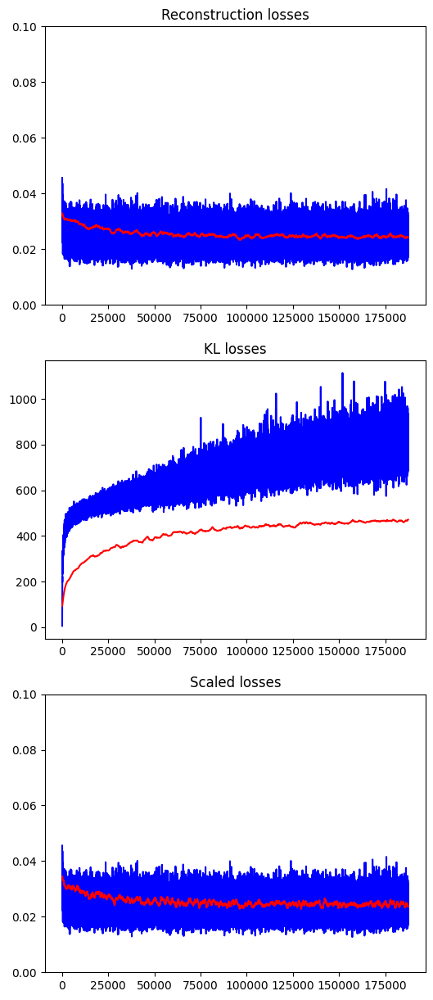

In [65]:
fig, axs = plt.subplots(3, 1, figsize = (6, 15))

train_losses_reconstruction_avg = [np.mean(train_losses_reconstruction[i:i+50]) for i in range(3750)] #CHANGE dEPENDING EPOCH, 100 --> 3750
axs[0].plot(np.arange(epochs * 1875), train_losses_reconstruction, color = 'b', label = 'mini-batches')
axs[0].plot(np.arange(0, epochs * 1875, 50), train_losses_reconstruction_avg, color = 'r', label = 'running average')
axs[0].set_ylim(0,0.1)
axs[0].set_title('Reconstruction losses')

train_losses_KL_avg = [np.mean(train_losses_KL[i:i+50]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[1].plot(np.arange(epochs * 1875), train_losses_KL, color = 'b', label = 'mini-batches')
axs[1].plot(np.arange(0, epochs * 1875, 50), train_losses_KL_avg, color = 'r', label = 'running average')
axs[1].set_title('KL losses')

train_losses_total_avg = [np.mean(train_losses_total[i:i+20]) for i in range(3750)]#CHANGE dEPENDING EPOCH, 100 --> 3750
axs[2].plot(np.arange(epochs * 1875), train_losses_total, color = 'b', label = 'mini-batches')
axs[2].plot(np.arange(0, epochs * 1875, 50), train_losses_total_avg, color = 'r', label = 'running average')
axs[2].set_ylim(0,0.1)
axs[2].set_title('Scaled losses')

plt.show()

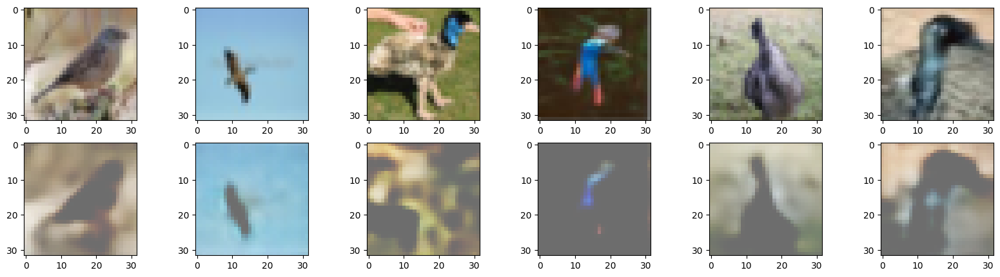

In [66]:
fig, axs = plt.subplots(2, 6, figsize = (20, 5))
for i in range(6):
    axs[0][i].imshow(X[i+10000,:,:,:].permute(1,2,0))
_, _, new_fig = model(X[10000:10006, :, :, :].to(device))
for i in range(6):
    axs[1][i].imshow(new_fig[i].permute(1,2,0).cpu().detach().numpy())

Text(0.5, 1.0, 'comparison between the latent spaces')

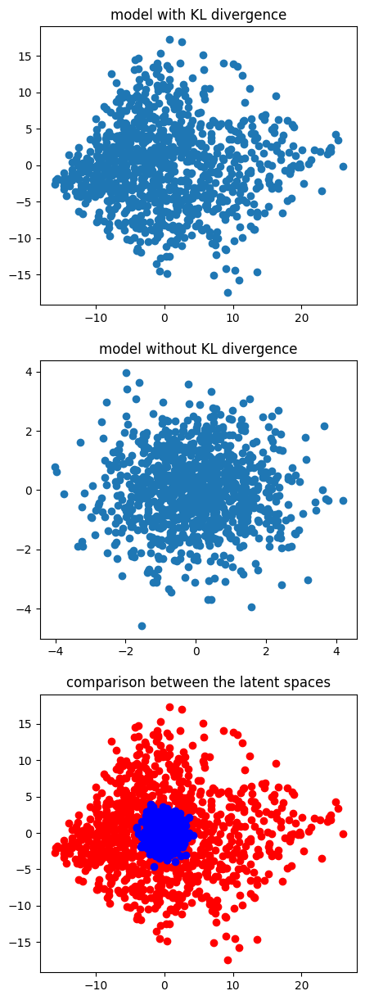

In [67]:
pca = PCA(n_components = 2)

_,_,latent_model1 = model.encode(X[:1000].to(device))
_,_,latent_model2 = model2.encode(X[:1000].to(device))
latent_model1 = latent_model1.cpu().detach().numpy()
latent_model2 = latent_model2.cpu().detach().numpy()

fig, axs = plt.subplots(3, figsize = (5, 15))
plot_X_1 = pca.fit_transform(latent_model1)
axs[0].scatter(plot_X_1[:,0], plot_X_1[:,1])
axs[0].set_title('model with KL divergence')
plot_X_2 = pca.fit_transform(latent_model2)
axs[1].scatter(plot_X_2[:, 0], plot_X_2[:, 1])
axs[1].set_title('model without KL divergence')

axs[2].scatter(plot_X_1[:,0], plot_X_1[:, 1], color = 'r')
axs[2].scatter(plot_X_2[:,0], plot_X_2[:, 1], color = 'b')
axs[2].set_title('comparison between the latent spaces')

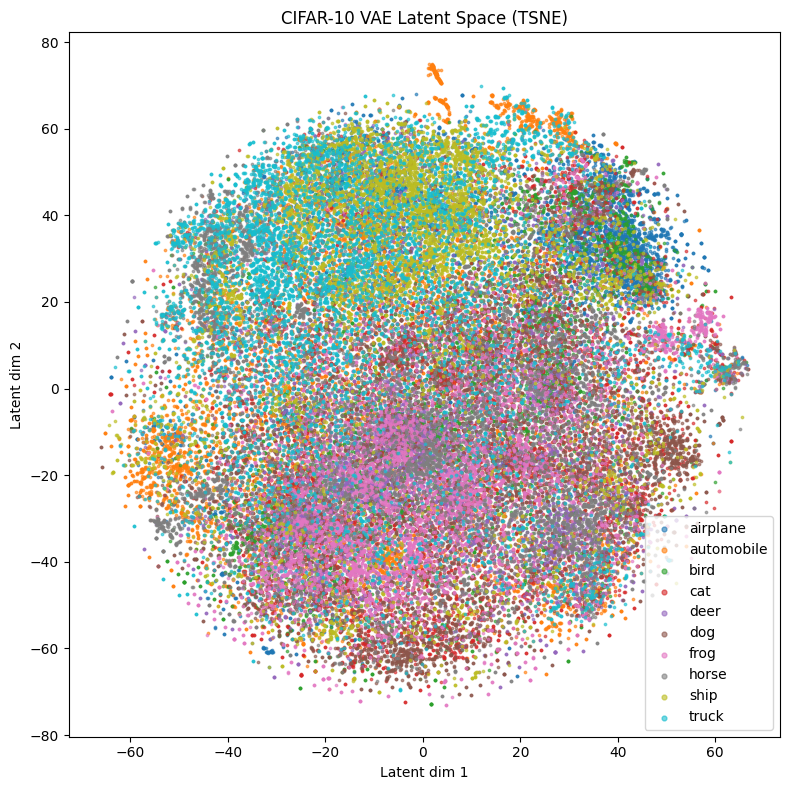

In [68]:
vae = model  # your trained VAE
vae.eval()

latents = []
batch_size = 256
device = next(vae.parameters()).device
labels = np.array(labels)
with torch.no_grad():
    for i in range(0, len(X), batch_size):
        batch = X[i:i+batch_size].to(device)
        mean, logvar, z = vae.encode(batch)
        latents.append(mean.cpu().numpy())
latents = np.concatenate(latents, axis=0)

# Step 3: t-SNE or PCA

reducer = TSNE(n_components=2, random_state=42,perplexity=30)
# reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (TSNE)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

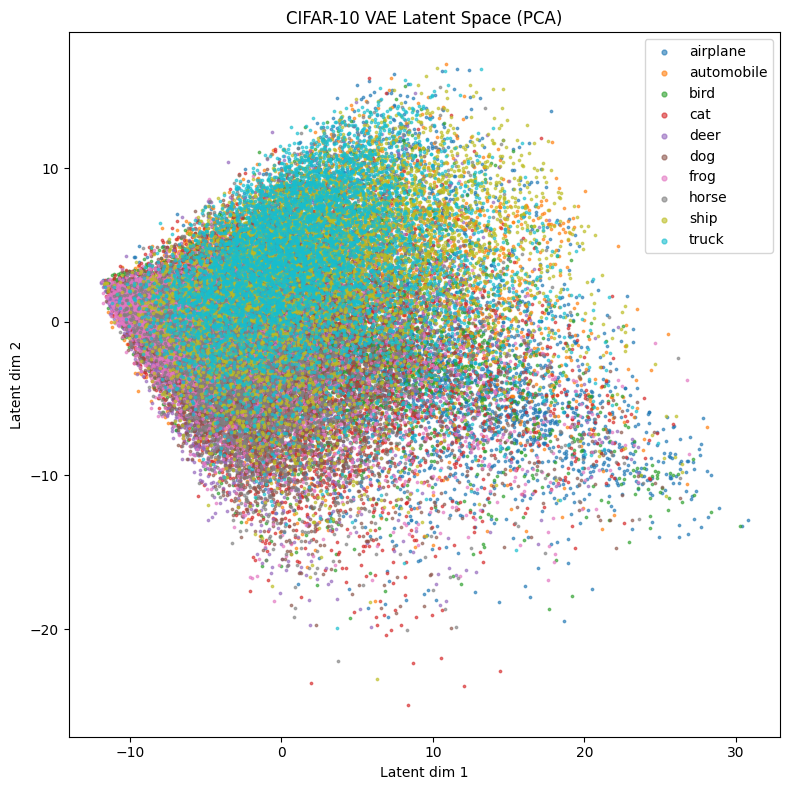

In [69]:
reducer = PCA(n_components=2, random_state=42 ) # If using PCA
latents_2d = reducer.fit_transform(latents)

# Step 4: Plot
import matplotlib.pyplot as plt
cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer', 
    'dog', 'frog', 'horse', 'ship', 'truck'
]

plt.figure(figsize=(8,8))
for class_idx in range(10):
    idx = labels == class_idx
    plt.scatter(latents_2d[idx, 0], latents_2d[idx, 1], s=3, label=cifar10_classes[class_idx], alpha=0.6)
plt.legend(markerscale=2, fontsize=10)
plt.title("CIFAR-10 VAE Latent Space (PCA)")
plt.xlabel("Latent dim 1")
plt.ylabel("Latent dim 2")
plt.tight_layout()
plt.show()

# Save Models

In [ ]:
torch.save(model.state_dict(), './model/model1.pth')
torch.save(model2.state_dict(), './model/model2.pth')
print("Saved model1 and model2 successfully.")